# Import the Required Libraries

## Introduction
India has one of the fastest-growing economies in the world. Many new and innovative startups are emerging, and they are receiving a lot of funding.
In this notebook, we will explore the data on Indian startup funding to understand more about this ecosystem and how it has changed over time.



### Objectives

- How Does the Funding Ecosystem changes with respect to Time?
- What is the General Amount that Startups get in India?
- Which Kind of Industries are more preferred for Startups?
- Does Location also play a role, In determining the Growth of a Startup?
- Who plays the main role in Indian Startups Ecosystem?
- What are the different Types of Funding for Startups?

### About the Dataset
**Dataset**: 'startup_funding.csv'

**Content:** This dataset contains information about funding provided to startups India.

- Rows : 3044
- Columns: 10

**Columns:**

- Sr No - Serial number for each entry
- Date dd/mm/yyyy - The date when the funding was provided, in the format dd/mm/yyyy
- Startup Name - The name of the startup that received funding
- Industry Vertical - The industry or sector in which the startup operates, such as technology, healthcare, e-commerce, etc.
- SubVertical - A more specific category within the industry, providing additional details about the startup's focus
- City  Location - The city or location where the startup is based
- Investors Name - The names of the investors or venture capital firms that provided the funding
- InvestmentnType - The type of investment, such as Seed Funding, Series A, Series B, etc.
- Amount in USD - The amount of funding received by the startup, typically expressed in US dollars
- Remarks - Any additional remarks or notes about the funding round or the startup

In [1]:
# Library for Data manipulation and cleaning 
import pandas as pd

# Library for numerical computations
import numpy as np

# Library for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library for ignoring warnings

import warnings

warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('C:/Users/rkpc1/Downloads/archive (6).zip')

In [3]:
df.sample(5)

,Sr No,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
2451,2452,23/09/2015,InnerChef,Food Delivery Platform,NaN,New Delhi,"Phanindra Sama, Anupam Mittal, Vijay Shekhar S...",Private Equity,"17,50,000",pre-Series A
2119,2120,03/12/2015,Shuttl,App based Bus Pooling Services,NaN,Gurgaon,"Sequoia Capital, Times Internet Ltd & One more...",Private Equity,"2,00,00,000",Series B
2838,2839,16/04/2015,UrbanClap,Hyperlocal Mobile Services Marketplace,NaN,New Delhi,"SAIF Partners, Accel Partners, Kunal Bahl, Roh...",Seed Funding,"16,00,000",NaN
3005,3006,09/01/2015,YepMe,NaN,NaN,NaN,"JS Capital, Helion Venture Partners, Capricorn...",Private Equity,"1,30,00,000",Series A
2739,2740,25/06/2015,Fusion Microfinance,Micro Finance Platform,NaN,New Delhi,Development finance institution Belgian Invest...,Private Equity,"86,00,000",Series C


In [4]:
df.shape

(3044, 10)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3044 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Sr No              3044 non-null   int64 
 1   Date dd/mm/yyyy    3044 non-null   object
 2   Startup Name       3044 non-null   object
 3   Industry Vertical  2873 non-null   object
 4   SubVertical        2108 non-null   object
 5   City  Location     2864 non-null   object
 6   Investors Name     3020 non-null   object
 7   InvestmentnType    3040 non-null   object
 8   Amount in USD      2084 non-null   object
 9   Remarks            419 non-null    object
dtypes: int64(1), object(9)
memory usage: 237.9+ KB


### This dataset has funding information of the Indian startups from January 2015 to August 2020. It includes columns as follows :

1) Sr No : Serial number of all the entries.

2) Date dd/mm/yyyy : Date of funding.

3) Startup Name : Name of the startup which got funded.

4) Industry Vertical : Industry to which the startup belongs.

5) SubVertical : Sub-category of the industry types.

6) City Location : City at which the Startup is based.

7) Investors Name : Name of the investors involved in the funding round.

8) InvestmentnType : Type of investment on the startup.

9) Amount in USD : The amount funded by the investor to statup in US Dollars.

10) Remarks : Extra remarks (if any).

### Observation:
Fromom above output we can say that , Date dd/mm/yyyy and Amount in USD are not in appropriate form they should be in datetime and float respectively so we will convert them in their appropriate type in preprocessing step

# Data Preprocessing

In [6]:
df.head()

,Sr No,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
0,1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000",NaN
1,2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394",NaN
2,3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,"1,83,58,860",NaN
3,4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,"30,00,000",NaN
4,5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,"18,00,000",NaN


In [7]:
df.drop(columns=["Sr No"],inplace=True)

In [8]:
df.rename(columns={"Date dd/mm/yyyy":"Date","City  Location":"City","InvestmentnType":"Investment Type"},inplace=True)

In [9]:
df.head(2)

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,Remarks
0,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000",NaN
1,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394",NaN


In [10]:
df.describe()

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,Remarks
count,3044,3044,2873,2108,2864,3020,3040,2084,419
unique,1035,2459,821,1942,112,2412,55,471,72
top,02/02/2015,Ola Cabs,Consumer Internet,Online Lending Platform,Bangalore,Undisclosed Investors,Private Equity,"10,00,000",Series A
freq,11,8,941,11,700,39,1356,165,175


In [11]:
df.duplicated().sum()

0

In [12]:
df.isnull().sum()

Date                    0
Startup Name            0
Industry Vertical     171
SubVertical           936
City                  180
Investors Name         24
Investment Type         4
Amount in USD         960
Remarks              2625
dtype: int64

In [13]:
(df.isnull().sum()*100/df.shape[0]).to_frame().rename(columns={0:"missing values %"})

,missing values %
Date,0.000000
Startup Name,0.000000
Industry Vertical,5.617608
SubVertical,30.749014
City,5.913272
Investors Name,0.788436
Investment Type,0.131406
Amount in USD,31.537451
Remarks,86.235217


### since remarks is having ~86 % missing values and this column seems not much important so we will drop.

In [14]:
df.drop(columns=["Remarks"],inplace=True)

### since the there is a very less missing values % i.e 0.78 and 0.13 in columns Investors Name,Investment Type respectively so we drop rows corresponding to these columns have missing values

In [15]:
df.shape

(3044, 8)

In [16]:
df.dropna(subset=["Investors Name","Investment Type"],inplace=True)

In [17]:
df.shape

(3016, 8)

In [18]:
df.head()

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD
0,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000"
1,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394"
2,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,"1,83,58,860"
3,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,"30,00,000"
4,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,"18,00,000"


### Now, we are going to handle the missing values in each of column and clean them seperately as per the domain knowledge.

### Cleaning Date Column

In [19]:
df["Date"].dtypes

dtype('O')

The Date is showing in object so need to convert them in datetime format using to_datetime function of pandas but when we convert it directly I am getting the parse error because some dates are not in appropriate form so we need cleam them first then we would be able to convert them.

In [21]:
df["Date"].unique()

array(['09/01/2020', '13/01/2020', '02/01/2020', ..., '29/01/2015',
       '30/01/2015', '31/01/2015'], dtype=object)

#### finding the dates which are not in appropriate form using regex in following code.

In [22]:
for i in df['Date'].unique():
 print(i)

09/01/2020
13/01/2020
02/01/2020
10/01/2020
12/12/2019
06/12/2019
03/12/2019
13/12/2019
17/12/2019
16/12/2019
14/12/2019
11/12/2019
20/12/2019
13/11/2019
14/11/2019
17/11/2019
18/11/2019
15/11/2019
20/11/2019
12/11/2019
11/11/2019
19/11/2019
25/11/2019
04/10/2019
02/10/2019
21/10/2019
05/09/2019
04/09/2019
03/09/2019
01/08/2019
12/08/2019
13/08/2019
23/08/2019
22/08/2019
21/08/2019
19/08/2019
27/08/2019
02/07/2019
01/07/2019
03/07/2019
04/07/2019
10/07/2019
11/07/2019
09/07/2019
08/07/2019
05/06/2019
04/06/2019
03/06/2019
06/06/2019
10/06/2019
08/06/2019
06/05/2019
05/05/2019
01/05/2019
02/05/2019
28/05/2019
30/05/2019
31/05/2019
16/04/2019
12/04/2019
10/04/2019
13/04/2019
11/04/2019
19/04/2019
17/04/2019
01/02/2019
08/02/2019
13/02/2019
14/02/2018
03/01/2019
04/01/2019
04/12/2018
01/12/2018
02/12/2018
06/12/2018
01/11/2018
03/11/2018
06/11/2018
08/11/2018
12/11/2018
13/11/2018
14/11/2018
19/11/2018
20/11/2018
21/11/2018
22/11/2018
23/11/2018
24/11/2018
25/11/2018
01/10/2018
02/10/2018

The above date formats seems to create the problem so we need to fix this format :

In [23]:

df["Date"]=df["Date"].replace({'01/07/015':'01/07/2015',
                               '12/05.2015':'12/05/2015',
                               '13/04.2015':'13/04/2015',
                               '15/01.2015':'15/01/2015',
                               '22/01//2015':'22/01/2015', 
                               '05/072018':'05/07/2018',
                               '05/072018':'05/07/2018'})

In [24]:
df['Date'] = df['Date'].str.replace(r"\\xc2\\xa010/7/2015", "10/07/2015")

In [25]:
for i in df['Date'].unique():
 print(i)

09/01/2020
13/01/2020
02/01/2020
10/01/2020
12/12/2019
06/12/2019
03/12/2019
13/12/2019
17/12/2019
16/12/2019
14/12/2019
11/12/2019
20/12/2019
13/11/2019
14/11/2019
17/11/2019
18/11/2019
15/11/2019
20/11/2019
12/11/2019
11/11/2019
19/11/2019
25/11/2019
04/10/2019
02/10/2019
21/10/2019
05/09/2019
04/09/2019
03/09/2019
01/08/2019
12/08/2019
13/08/2019
23/08/2019
22/08/2019
21/08/2019
19/08/2019
27/08/2019
02/07/2019
01/07/2019
03/07/2019
04/07/2019
10/07/2019
11/07/2019
09/07/2019
08/07/2019
05/06/2019
04/06/2019
03/06/2019
06/06/2019
10/06/2019
08/06/2019
06/05/2019
05/05/2019
01/05/2019
02/05/2019
28/05/2019
30/05/2019
31/05/2019
16/04/2019
12/04/2019
10/04/2019
13/04/2019
11/04/2019
19/04/2019
17/04/2019
01/02/2019
08/02/2019
13/02/2019
14/02/2018
03/01/2019
04/01/2019
04/12/2018
01/12/2018
02/12/2018
06/12/2018
01/11/2018
03/11/2018
06/11/2018
08/11/2018
12/11/2018
13/11/2018
14/11/2018
19/11/2018
20/11/2018
21/11/2018
22/11/2018
23/11/2018
24/11/2018
25/11/2018
01/10/2018
02/10/2018

#### Now, convert the Date into Datetime format.

In [26]:
# Convert date column to datetime format

from datetime import datetime as dt

df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y',errors='coerce')

# Extract year from date
df['year']=df.Date.dt.year

df['year'].unique()

array([2020, 2019, 2018, 2017, 2016, 2015])

In [27]:
# Verifying the Date dtype 

df["Date"].dtypes

dtype('<M8[ns]')

In [29]:
# Convert all values in the specified column to lowercase

df['Startup Name'] = df['Startup Name'].str.lower()
df['Industry Vertical'] = df['Industry Vertical'].str.lower()
df['SubVertical'] = df['SubVertical'].str.lower()
df['City'] = df['City'].str.lower()
df['Investors Name'] = df['Investors Name'].str.lower()
df['Investment Type'] = df['Investment Type'].str.lower()
df

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
0,2020-01-09,byju’s,e-tech,e-learning,bengaluru,tiger global management,private equity round,"20,00,00,000",2020
1,2020-01-13,shuttl,transportation,app based shuttle service,gurgaon,susquehanna growth equity,series c,"80,48,394",2020
2,2020-01-09,mamaearth,e-commerce,retailer of baby and toddler products,bengaluru,sequoia capital india,series b,"1,83,58,860",2020
3,2020-01-02,https://www.wealthbucket.in/,fintech,online investment,new delhi,vinod khatumal,pre-series a,"30,00,000",2020
4,2020-01-02,fashor,fashion and apparel,embroiled clothes for women,mumbai,sprout venture partners,seed round,"18,00,000",2020
...,...,...,...,...,...,...,...,...,...
3039,2015-01-29,printvenue,NaN,NaN,NaN,asia pacific internet group,private equity,"45,00,000",2015
3040,2015-01-29,graphene,NaN,NaN,NaN,karsemven fund,private equity,"8,25,000",2015
3041,2015-01-30,mad street den,NaN,NaN,NaN,"exfinity fund, growx ventures.",private equity,"15,00,000",2015
3042,2015-01-30,simplotel,NaN,NaN,NaN,makemytrip,private equity,NaN,2015


### Cleaning Startup Column Name

#### Let's first check if Startup column has anomalies.

In [30]:
for i in df["Startup Name"].unique():
    print(i)

byju’s
shuttl
mamaearth
https://www.wealthbucket.in/
fashor
pando
zomato
ecozen
cardekho
dhruva space
rivigo
healthians
licious
trell
rein games
lenskart.com
freshworks
misters
sunstone eduversity pvt. ltd
burger singh
ninjacart
aye finance
supergaming
clumio
ebikego
digital mall asia
medikabazaar
vogo automotive
paytm
dunzo
udaan
the man company
fpl technologies
cashflo
digital f5
3rdflix
75f
myelin foundry
atomberg technology
goqii
vyapar app
progcap
alteria capital
pine labs
meesho
cars24
uniphore
zendrive
lo! foods
tala
indwealth
hungerbox
admitkard
mishry reviews
grofers
rapido bike taxi
renewbuy
atlan
wizcounsel
ola cabs
daalchini technologies
"byju\\'s"
moglix
ezyhaul
indus os
healthassure
house of msasaba
board infinity
nobroker
bira91
avail finance
bharatpe
recykal
agara labs
chakr innovation
pratilipi
bolo app
okcredit
biz2credit
vogo automotive pvt. ltd.
leegality
ola electric
saahas zero waste
styledotme
blackbuck
zenoti
ather energy
freshvnf
glowroad
kuvera
medlife
kabadiw

### In above output there are so may anomilies in the Start up so we clean them one by one.

### There is ambiguity of CarDekho.com with CarDekho.

In [31]:
df[df["Startup Name"].str.contains("cardekho",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
8,2019-12-06,cardekho,e-commerce,automobile,gurgaon,ping an global voyager fund,series d,"7,00,00,000",2019
44,2019-08-01,cardekho,e-commerce,automotive,gurgaon,sc gg india mobility holdings llc,series c,"2,00,00,000",2019
116,2019-01-03,cardekho,automobile,online marketplace,jaipur,"sequoia india, hillhouse capital, alphabet\\xe...",series c,"11,00,00,000",2019
2795,2015-05-22,cardekho,online car portal,NaN,jaipur,hdfc bank,private equity,NaN,2015
2953,2015-02-09,cardekho.com,NaN,NaN,NaN,ratan tata,private equity,NaN,2015
3037,2015-01-27,cardekho.com,NaN,NaN,NaN,"hillhouse capital, tybourne capital",private equity,"5,00,00,000",2015


### There is ambiguity of Ola with Ola Cabs, Olacabs.

In [32]:
df[df["Startup Name"].str.contains("ola cabs|olacabs|ola",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
64,2019-07-03,ola cabs,transport,cabs,kormangala,"dig investment ab, deshe holdings, samih touka...",series j,"10,00,000",2019
89,2019-05-06,ola electric,transport,cabs,bengaluru,tata sons,series a,undisclosed,2019
267,2018-05-22,vola,finance,micro lending platform,bengaluru,credika and unnamed angel investors,seed/ angel funding,"5,00,000",2018
367,2018-02-13,holachef,food and beverages,online food delivery,mumbai,ashok kumar gajera,seed / angle funding,"3,11,200",2018
523,2017-10-03,ola cabs,consumer internet,app based cab hailing services,bangalore,"tencent, softbank group",private equity,"11,00,00,000",2017
570,2017-10-28,ola cabs,consumer internet,app based cab hailing services,bangalore,ani technologies pvt. ltd,private equity,"77,00,000",2017
653,2017-08-11,ola cabs,consumer internet,app based cab aggregation service,gurgaon,tekne capital management,private equity,"3,60,00,000",2017
748,2017-06-14,ola,consumer internet,cab aggregation app,bangalore,tekne capital management llc,private equity,"5,00,00,000",2017
791,2017-05-03,ola,consumer internet,cab aggregation app,bangalore,"falcon edge capital,\\xc2\\xa0 capital advisers",private equity,"10,45,00,000",2017
889,2017-04-14,ola cabs,consumer internet,cab aggregator app,bangalore,simi pacific pte,private equity,"26,00,00,000",2017


### There is ambiguity of OYO Rooms with Oyo Rooms,OyoRooms and Oyorooms

In [33]:
df[df["Startup Name"].str.contains("oyo rooms|oyorooms",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
115,2018-02-14,oyorooms,hospitality,budget rooms,gurgaon,didi chuxing,equity,"10,00,00,000",2018
586,2017-09-07,oyo rooms,consumer internet,branded budget hotels marketplace,gurgaon,"softbank group, sequoia capital india, lightsp...",private equity,"25,00,00,000",2017
600,2017-09-13,oyo rooms,consumer internet,udget hotel marketplace,gurgaon,china lodging group,private equity,"1,00,00,000",2017
906,2017-04-24,oyo rooms,consumer internet,branded budget hotels aggregator,gurgaon,"softbank vision fund, lightspeed venture partn...",private equity,"25,00,00,000",2017
1446,2016-08-16,oyorooms,consumer internet,budget hotels aggregator,new delhi,softbank group,private equity,"6,20,00,000",2016
2476,2015-08-03,oyorooms,budget hotel accommodation brand,NaN,new delhi,"softbank group, greenoaks capital, sequoia cap...",private equity,"10,00,00,000",2015
2618,2015-07-15,oyo rooms,budget hotel accommodation,NaN,gurgaon,"softbank, sequoia capital",private equity,"10,00,00,000",2015
2919,2015-03-25,oyo rooms,NaN,NaN,NaN,"greenoaks capital, sequoia capital, lightspeed...",private equity,"2,50,00,000",2015


### There is ambiguity of Rapido with Rapido Bike Taxi.

In [34]:
df[df["Startup Name"].str.contains("rapido",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
60,2019-08-27,rapido bike taxi,transportation,bike taxi,bengaluru,westbridge capital,series b,"3,90,00,00,000",2019
503,2017-11-21,rapido,technology,bike and taxi pooling online platform,hyderabad,"skycatcher fund, aravind sanka",seed/angel funding,"3,29,230",2017
621,2017-09-25,rapido,consumer internet,bike aggregator mobile app,bangalore,battery road digital holdings llc,seed funding,"4,22,000",2017
1780,2016-04-18,rapido,consumer internet,bike aggregator app,bangalore,"pawan munjal, advantedge partners, astarc vent...",private equity,NaN,2016


###  There is ambiguity of byjus with different form of Byjus

In [35]:
df[df["Startup Name"].str.contains("byju",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
0,2020-01-09,byju’s,e-tech,e-learning,bengaluru,tiger global management,private equity round,"20,00,00,000",2020
67,2019-07-10,"""byju\\'s""",edtech,education,bengaluru,qatar investment authority,private equity round,"15,00,00,000",2019
712,2017-07-25,byju\\xe2\\x80\\x99s,consumer internet,mobile learning app,bangalore,tencent holdings,private equity,"3,50,00,000",2017
983,2017-03-29,byju\\xe2\\x80\\x99s,consumer internet,online education platform,bangalore,verlinvest,private equity,NaN,2017
1164,2016-12-20,byju\\xe2\\x80\\x99s,consumer internet,online learning platform,bangalore,international financial corporation,private equity,"1,50,00,000",2016
1356,2016-09-09,byju\\xe2\\x80\\x99s,education,online learning app,bangalore,"chan zuckerberg initiative, times internet ltd...",private equity,"5,00,00,000",2016
1880,2016-03-22,byju\\xe2\\x80\\x99s,consumer internet,educational video content creator,bangalore,"sequoia india, sofina",private equity,"7,50,00,000",2016


In [36]:
df.loc[0,"Startup Name"]="byjus"
df.loc[67,"Startup Name"]="byjus"

In [37]:
df[df["Startup Name"].str.contains('byju',case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
0,2020-01-09,byjus,e-tech,e-learning,bengaluru,tiger global management,private equity round,"20,00,00,000",2020
67,2019-07-10,byjus,edtech,education,bengaluru,qatar investment authority,private equity round,"15,00,00,000",2019
712,2017-07-25,byju\\xe2\\x80\\x99s,consumer internet,mobile learning app,bangalore,tencent holdings,private equity,"3,50,00,000",2017
983,2017-03-29,byju\\xe2\\x80\\x99s,consumer internet,online education platform,bangalore,verlinvest,private equity,NaN,2017
1164,2016-12-20,byju\\xe2\\x80\\x99s,consumer internet,online learning platform,bangalore,international financial corporation,private equity,"1,50,00,000",2016
1356,2016-09-09,byju\\xe2\\x80\\x99s,education,online learning app,bangalore,"chan zuckerberg initiative, times internet ltd...",private equity,"5,00,00,000",2016
1880,2016-03-22,byju\\xe2\\x80\\x99s,consumer internet,educational video content creator,bangalore,"sequoia india, sofina",private equity,"7,50,00,000",2016


#### There is \n in startup Name , eg:

Alef\nMobitech <br> 
PlanMy\nMedicalTrip

In [38]:
df[df["Startup Name"].str.contains(r"\\n")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2013,2016-01-05,alef\\nmobitech,consumer internet,cloud mobility solutions,mumbai,tata capital innovation fund,private equity,"50,00,000",2016
2018,2016-01-06,planmy\\nmedicaltrip,healthcare,medical tourism platform,pune,"bhanu vikram parsotam, rohan desai and paras p...",seed funding,"1,50,000",2016


In [39]:
df.loc[2013,"Startup Name"]="alef mobitech"
df.loc[2018,"Startup Name"]="planmymedicaltrip"

In [40]:
df[df["Startup Name"].str.contains('alef',case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2013,2016-01-05,alef mobitech,consumer internet,cloud mobility solutions,mumbai,tata capital innovation fund,private equity,"50,00,000",2016


In [41]:
df[df["Startup Name"].str.contains('planmy',case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2018,2016-01-06,planmymedicaltrip,healthcare,medical tourism platform,pune,"bhanu vikram parsotam, rohan desai and paras p...",seed funding,"1,50,000",2016


### There is more encoding problems in startup Name as follows :

\xc2\xa0CloudCherry

NearBuy (previously\xc2\xa0 groupon India) \xc2\xa0News in shorts

\xc2\xa0Bluestone

\xc2\xa0Shopsity

\xc2\xa0Notesgen

\xc2\xa0Infinity Assurance

\xc2\xa0Footprints Education

\xc2\xa0Loylty Rewards

\xc2\xa0Ameyo

\xc2\xa0Mamagoto

\xc2\xa0Satvacart

\xc2\xa0Nudgespot

What\\xe2\\x80\\x99s Up Life

Creator\\xe2\\x80\\x99s Gurukul

SERV\\xe2\\x80\\x99D

Don\\xe2\\x80\\x99t Scratch Your Head

Carl\\xe2\\x80\\x99s Jr

Faaso\\xe2\\x80\\x99s


In [42]:
df[df["Startup Name"].str.contains(r"xe2\\x80\\x99s",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
1398,2016-09-26,let\xe2\x80\x99s barter,consumer internet,goods & services barter platform,new delhi,scale ventures funds,seed funding,NaN,2016


In [43]:
df["Startup Name"]=df["Startup Name"].apply(lambda x:x.replace(r"\xe2\x80\x99",""))

In [44]:
df.loc[1398]

Date                              2016-09-26 00:00:00
Startup Name                              lets barter
Industry Vertical                   consumer internet
SubVertical          goods & services barter platform
City                                        new delhi
Investors Name                   scale ventures funds
Investment Type                          seed funding
Amount in USD                                     NaN
year                                             2016
Name: 1398, dtype: object

In [45]:
df[df["Startup Name"].str.contains("xc2|xe2" ,case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
239,2018-06-13,what\\xe2\\x80\\x99s up life,consumer internet,"a local discovery app for dining-out, party, l...",gurugram,rannvijay singha,seed/ angel funding,NaN,2018
712,2017-07-25,byju\\xe2\\x80\\x99s,consumer internet,mobile learning app,bangalore,tencent holdings,private equity,"3,50,00,000",2017
713,2017-07-26,creator\\xe2\\x80\\x99s gurukul,others,co-working space provider,new delhi,yuvraj singh,seed funding,NaN,2017
983,2017-03-29,byju\\xe2\\x80\\x99s,consumer internet,online education platform,bangalore,verlinvest,private equity,NaN,2017
1153,2016-12-15,serv\\xe2\\x80\\x99d,consumer internet,financial services for unorganized workforce,pune,digital financial service lab,seed funding,"1,00,000",2016
1164,2016-12-20,byju\\xe2\\x80\\x99s,consumer internet,online learning platform,bangalore,international financial corporation,private equity,"1,50,00,000",2016
1356,2016-09-09,byju\\xe2\\x80\\x99s,education,online learning app,bangalore,"chan zuckerberg initiative, times internet ltd...",private equity,"5,00,00,000",2016
1394,2016-09-23,\\xc2\\xa0cloudcherry,technology,crm saas platform,chennai,"vertex ventures, cisco ventures, idg ventures",private equity,"60,00,000",2016
1514,2016-07-06,don\\xe2\\x80\\x99t scratch your head,technology,full stack offline & online erp solution,ahmedabad,"gaurav singhvi, zaffiro ventures",seed funding,"2,50,000",2016
1880,2016-03-22,byju\\xe2\\x80\\x99s,consumer internet,educational video content creator,bangalore,"sequoia india, sofina",private equity,"7,50,00,000",2016


In [46]:
df["Startup Name"]=df["Startup Name"].apply(lambda x:x.replace(r"\\xc2\\xa0",""))
df["Startup Name"]=df["Startup Name"].apply(lambda x:x.replace(r"\\xe2\\x80\\x99",""))

In [47]:
df[df["Startup Name"].str.contains("xc2|xe2" ,case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year


In [48]:
df.loc[2954]

Date                 2015-02-09 00:00:00
Startup Name                      faasos
Industry Vertical                    NaN
SubVertical                          NaN
City                                 NaN
Investors Name         lightbox ventures
Investment Type           private equity
Amount in USD                2,00,00,000
year                                2015
Name: 2954, dtype: object

### There is a url https://www.wealthbucket.in/ mentioned of startup name wealthbucket.

In [49]:
df[df["Startup Name"].str.contains("www")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
3,2020-01-02,https://www.wealthbucket.in/,fintech,online investment,new delhi,vinod khatumal,pre-series a,"30,00,000",2020


In [50]:
df.loc[3,"Startup Name"]="wealthbucket"

In [51]:
df.loc[3]

Date                 2020-01-02 00:00:00
Startup Name                wealthbucket
Industry Vertical                fintech
SubVertical            online investment
City                           new delhi
Investors Name            vinod khatumal
Investment Type             pre-series a
Amount in USD                  30,00,000
year                                2020
Name: 3, dtype: object

In [52]:
StartupNameCorrections = {'#fame':'fame', 'shubh loans': 'shubhloans', 'lenskart.com': 'lenskart', 'lending kart': 'lendingkart', 'urbanclap technologies pvt. ltd': 'urbanclap', 
                          'urban ladder': 'urbanladder', 'firstcry.com': 'firstcry', 'doctor insta': 'doctorinsta',
                          'instalively.com': 'instalively', 'policy bazaar': 'policybazaar',
                           'customfurnish.com': ' customfurnish', 'craftstvilla':'craftsvilla',
                          'daily ninja': 'dailyninja', 'cartrade.com': 'cartrade',
                          '1mg (healthkartplus)': '1mg', 'i can stay': 'icanstay', 'gameezop': 'gamezop',
                           'bank bazaar': 'bankbazaar', 'credit mate': 'creditmate', 'credit vidya': 'creditvidya',
                          'loan tap': ' loantap', 'deal4loans / wishfin': 'deal4loans', 'happilyunmarried': 'happily unmarried', 
                          'guidoo': 'guiddoo', 'zest money': 'zestmoney',
                          'roposo.com': 'roposo', 'raw pressery': 'rawpressery','wow express': 'wowexpress',
                          'pressplay tv': 'pressplay', 'nearbuy (previously groupon india)': 'nearbuy', 'groupon india': 'nearbuy', 
                          'peesafe.in': 'peesafe', 'weddingz.in': 'weddingz', 'grab.in': 'grab', 'grabhouse.com': 'grabhouse',
                          'active.ai':'active ai',
                          'aye finanace': 'ayefinance', 'cloudcherry analytics': 'cloudcherry', 
                          'zenify.in': 'zenify', 'smartivity.in': 'smartivity',
                          ' customfurnish': 'customfurnish', 'springboard': '91springboard', 'gennext students': 'genextstudents',
                          'lenden club': 'lendenclub', 'neogrowth credit': 'neogrowth', 'crown-it':'crownit', 'pipa bella': 'pipabella', 
                          'thebetterindia.com': 'the better india', 'samunnati financial intermediation & services pvt. ltd': 'samunnati', 
                          'cashkaro.com': 'cashkaro', 'netmeds.com': 'netmeds',
                          'housing.com': 'housing','aahaa stores':'aahaa','absentia':'absentia vr','aisle.co':'aisle','ampere vehicles':'ampere','cardekho.com':'cardekho', 
                          'ola cabs':'ola','olacabs':'ola',"oyo rooms":"oyorooms",
                          'bluegape.com':'bluegape','flipkart.com':'flipkart','arcatron mobility':'arcatron','atomberg technology':'atomberg','avail finance':'availfinance',
                          'bhive':'bhive workspace','big basket':'bigbasket','bigstylist.com':'bigstylist','bite club':'biteclub',
                          'black white orange brands':'black white orange','book my show':'bookmyshow','box my space':'boxmyspace', 'capillary':'capillary tech', 
                          'caravan craft retail':'caravan craft', 'chai point':'chaipoint','confirmttkt':'confirmtkt', 'cult':'cult fitness',
                          'cure fit':'curefit', 'cyclops':'cyclopsmedtech','daily hunt':'dailyhunt','daily rounds':'dailyrounds','droom.in':'droom','early salary':'earlysalary',
                          'earlysalary.com':'earlysalary','eazy diner':'eazydiner','elastirun':'elasticrun','etaout':'etauto','faircent.com':'faircent','fitraq.com':'fitraq',
                          'frsh.co.in':'frsh','fyle technologies':'fyle','gaana.com':'gaana','glam studios':'glamstudios','gympik.com':'gympik','hansel.io':'hansel',
                          'healthians.com':'healthians','high radius':'highradius', 'hike messanger':'hike','hwell24':'hwell24 plus','icustomadeit':'icustommadeit',
                          'impact guru':'impactguru','india lends':'indialends','ink monk':'inkmonk','intelligencenode':'intelligence node', 'i2ifunding':'i2i funding',
                          'jolly food fellow':'jollyfoodfellow','leaf wearables':'leaf','legal raasta':'legalraasta','little black book delhi':'little black book',
                          'log 9 materials':'log9 materials','logic roots':'logicroots','milk basket':'milkbasket','mind your fleet':'mindyourfleet','m.paani':'mpaani',
                          'naaptol.com':'naaptol','news in shorts':'newsinshorts','paytm marketplace':'paytm','phone pe':'phonepe','pine labs':'pinelabs',
                          'popxo.com':'popxo','portea medical':'portea','purplle.com':'purplle','qyk app':'qyk','renew buy':'renewbuy','roll mafia':'rollmafia',
                          'satvakart':'satvacart','shabdnagari':'shabdanagari','silvan innovation labs':'silvan','spares hub':'spareshub',
                          'sport flashes':'sports flashes', 'stalk buy love':'stalkbuylove', 'rapido bike taxi':'rapido',
                          'staydobe':'stayabode','tails life':'tailslife','tea box':'teabox','teabox.com':'teabox','tempgo':'tempogo','the moms co.':'the moms co', 	
                          'tone tag':'tonetag','toko innovations':'toko innovation studios','toppr.com':'toppr','travel triangle':'traveltriangle',
                          'ue life sciences':'ue lifesciences', 'unaacademy':'unacademy',
                          'vahdam teas':'vahdam tea','vanity cube':'vanitycube','veritas finance ltd.':'veritas finance','vogo automotive pvt. ltd.':'vogo',
                          'vogo automotive':'vogo','wooplr.com':'wooplr','zebi (yet to launch)':'zebi'  
                           }
                         
for i in StartupNameCorrections:
    if i in df["Startup Name"].values:
        y=df[df["Startup Name"]==i]
        df["Startup Name"].loc[y.index]=StartupNameCorrections[i]

## Cleaning Industry Vertical Column Name

In [53]:
df["Industry Vertical"].isnull().sum()*100/df.shape[0]

5.6697612732095495

#### Observation: It has 5.66 % missing values so first find the rows where Industry Vertical has missing values.

In [54]:
df[df["Industry Vertical"].isnull()]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2873,2015-03-02,trulymadly.com,NaN,NaN,NaN,"helion venture partners, kae capital",private equity,"55,00,000",2015
2874,2015-03-02,instalively,NaN,NaN,NaN,group of angel investors,seed funding,"1,20,000",2015
2875,2015-03-03,vserv,NaN,NaN,NaN,"maverick capital, idg ventures india",private equity,"1,50,00,000",2015
2876,2015-03-03,intruo.com,NaN,NaN,NaN,"ashutosh lawania, alok goel & others",seed funding,NaN,2015
2877,2015-03-05,niffler,NaN,NaN,NaN,saif partners,seed funding,"10,00,000",2015
...,...,...,...,...,...,...,...,...,...
3039,2015-01-29,printvenue,NaN,NaN,NaN,asia pacific internet group,private equity,"45,00,000",2015
3040,2015-01-29,graphene,NaN,NaN,NaN,karsemven fund,private equity,"8,25,000",2015
3041,2015-01-30,mad street den,NaN,NaN,NaN,"exfinity fund, growx ventures.",private equity,"15,00,000",2015
3042,2015-01-30,simplotel,NaN,NaN,NaN,makemytrip,private equity,NaN,2015


### since the industry vertical name is unkown so fill with unknown

In [55]:
df["Industry Vertical"]=df["Industry Vertical"].fillna("unknown")

### Let's first check if Industry Vertical column has anomalies :

In [56]:
c=0
for i in  df["Industry Vertical"].unique():
    print(i)
    c=c+1
print(c)

e-tech
transportation
e-commerce
fintech
fashion and apparel
logistics
hospitality
technology
aerospace
b2b-focused foodtech startup
video
gaming
software
health and wellness
education
food and beverage
b2b marketing
video games
saas
last mile transportation
healthcare
customer service
b2b
consumer goods
advertising, marketing
iot
information technology
consumer technology
accounting
finance
customer service platform
automotive
edtech
services
compliance
transport
artificial intelligence
tech
health care
luxury label
waste management service
deep-tech
energy
digital media
automobile
agtech
social media
ai
ecommerce
nanotechnology
services platform
travel tech
online education
online marketplace
saas, ecommerce
nbfc
food
food tech
automation
investment
social network
financial tech
fashion
real estate
logistics tech
consumer internet
b2b platform
fin-tech
food-tech
ed-tech
it
clean-tech
fiinance
food & beverages
media
food and beverages
publishing
agriculture
inspiration
storytelling
li

### From above output we can say that there is incosistency with E-Commerce with E-commerce, ECommerce, eCommerce, eCommece, ecommerce.

In [57]:
pd.set_option("display.max_rows",None)
df[df["Industry Vertical"].str.contains("com",case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2,2020-01-09,mamaearth,e-commerce,retailer of baby and toddler products,bengaluru,sequoia capital india,series b,"1,83,58,860",2020
8,2019-12-06,cardekho,e-commerce,automobile,gurgaon,ping an global voyager fund,series d,"7,00,00,000",2019
12,2019-12-16,licious,e-commerce,online meat and seafood ordering startup,bengaluru,vertex growth fund,series e,"3,00,00,000",2019
16,2019-12-20,lenskart,e-commerce,online eyewear shopping portal,faridabad,softbank vision fund,series g,"23,10,00,000",2019
27,2019-11-19,digital mall asia,e-commerce,virtual e-commerce platform,delhi,amour infrastructure,seed funding,"22,00,00,000",2019
44,2019-08-01,cardekho,e-commerce,automotive,gurgaon,sc gg india mobility holdings llc,series c,"2,00,00,000",2019
49,2019-08-12,meesho,e-commerce,social commerce,bengaluru,naspers,series d,"12,50,00,000",2019
50,2019-08-13,cars24,e-commerce,car retail,gurugram,ms dhoni,series d,"1,10,00,000",2019
59,2019-08-19,grofers,e-commerce,grocery delivery,gurgaon,softbank vision fund,series f,"7,00,00,000",2019
63,2019-07-01,wizcounsel,compliance,consulting,new delhi,kapil dev,angel,"1,45,000",2019


### There is also encoding problems with some industry vertical names like Hyperlocal\xc2\xa0 and  Grocery Delivery Service and wifi \xe2\x80\x93 first cloud communication pl...	



In [58]:
df[df["Industry Vertical"].str.contains("xc2", case= False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2175,2015-12-21,peppertap,hyperlocal\\xc2\\xa0 grocery delivery service,NaN,gurgaon,innoven capital,private equity,"40,00,000",2015
2238,2015-11-17,craftsvilla,women ethnic wear\\xc2\\xa0 online marketplace,NaN,mumbai,"sequoia india, lightspeed venture partners, ne...",private equity,"3,40,00,000",2015
2364,2015-10-27,happitoo,location based nightlife recommendation\\xc2\\...,NaN,mumbai,unnamed investor,seed funding,"77,000",2015
2385,2015-09-01,luxuryhues,luxury goods\\xc2\\xa0 shopping platform,NaN,gurgaon,reliance capital,private equity,"9,00,000",2015
2488,2015-08-06,appvigil,app security\\xc2\\xa0 testing platform,NaN,mumbai,"ravi gururaj, gaurav sharma, viswanath ramacha...",seed funding,"5,00,000",2015
2602,2015-07-09,newsinshorts,\\xc2\\xa0news aggregator mobile app,NaN,\\xc2\\xa0noida,\\xc2\\xa0tiger global,private equity,"\\xc2\\xa020,000,000",2015
2603,2015-07-09,bluestone,\\xc2\\xa0online jewellery store,NaN,\\xc2\\xa0bangalore,"\\xc2\\xa0ivycap ventures, accel partners, dra...",private equity,"\\xc2\\xa016,200,000",2015
2604,2015-07-09,shopsity,\\xc2\\xa0fashion info aggregator app,NaN,\\xc2\\xa0gurgaon,"\\xc2\\xa0 sandeep aggarwal, teruhide sato",seed funding,\\xc2\\xa0N/A,2015
2605,2015-07-09,notesgen,\\xc2\\xa0online study notes marketplace,NaN,\\xc2\\xa0new delhi,"\\xc2\\xa0rajeev saraf, arvind jha, r. satya n...",seed funding,\\xc2\\xa0N/A,2015
2606,2015-07-10,infinity assurance,\\xc2\\xa0warranty programs service administra...,NaN,\\xc2\\xa0new delhi,\\xc2\\xa0indian angel network,seed funding,"\\xc2\\xa0600,000",2015


In [59]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\\xc2\\xa0",""))

#### There is also encoding problems with some industry vertical names like wifi \xe2\x80\x93 first cloud communication

In [60]:
df[df["Industry Vertical"].str.contains("xe2", case=False)]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2200,2015-11-03,sabse,wifi \xe2\x80\x93 first cloud communication pl...,NaN,mumbai,ratan tata,private equity,NaN,2015
2394,2015-09-04,blubox,ecommerce brands\\xe2\\x80\\x99 full service a...,NaN,mumbai,ashish jhalani,seed funding,"1,00,000",2015
2419,2015-09-15,tea trails,chain of tea caf\\xc3\\xa9\\xe2\\x80\\x99s,NaN,mumbai,"anil matai, vikram tandon, shyam sundar r & ot...",seed funding,"10,00,000",2015


In [61]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\xe2\x80\x93" ,r"'"))

#### There is also encoding problems with some industry vertical with \xe2\x80\x99 which means nothing

In [62]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\\xe2\\x80\\x99",""))

#### There is also encoding problems with some industry vertical with \xc3\xa9\xe2\x80\x99 in which this \xc3\xa9\x means nothing and this 2\x80\x99 means single quote so we are correcting as follows

In [63]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\\xc3\\xa9\\xe2\\x80\\x99","e'"))

#### There ia a string pattern "\\xc3\\xa9" needs to replaced by "e". (eg. Home Design & D\xc3\xa9cor platform -> Home Design & Decor platform)

In [64]:
df[df["Industry Vertical"].str.contains("xc3")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2409,2015-09-11,renomania,home design & d\\xc3\\xa9cor platform,NaN,new delhi,subodh gupta,seed funding,NaN,2015
2419,2015-09-15,tea trails,chain of tea caf\\xc3\\xa9s,NaN,mumbai,"anil matai, vikram tandon, shyam sundar r & ot...",seed funding,"10,00,000",2015
2508,2015-08-11,livspace,home design & d\\xc3\\xa9cor solutions,NaN,bangalore,"helion ventures, jungle ventures & bessemer ve...",private equity,"80,00,000",2015
2647,2015-07-28,pepperfry,online home d\\xc3\\xa9cor marketplace,NaN,mumbai,"goldman sachs, zodius technology fund, bertels...",private equity,"10,00,00,000",2015
2802,2015-05-26,renderlogy,online home d\\xc3\\xa9cor,NaN,hyderabad,astarc ventures,private equity,"10,00,000",2015


In [65]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\\xc3\\xa9","e"))

#### Some of them have a string "\n" in between which has to be replaced by a blank space. (eg. Online Furnishing\\neCommerce -> Online Funishing Ecommerce)

In [66]:
df[df["Industry Vertical"].str.contains(r"\\n")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2220,2015-11-09,appvirality,mobile growth hacking\\nplatform,NaN,hyderabad,"rajan anandan, mike galgon, ravi gururaj, ashi...",seed funding,"5,00,000",2015
2691,2015-06-05,medwell ventures,healthcare\\nservice provider,NaN,bangalore,"fidelity growth partners, fidelity biosciences",private equity,"1,00,00,000",2015
2824,2015-04-09,urbanladder,online furnishing\\necommerce,NaN,bangalore,"sequoia capital, tr capital, steadview capital...",private equity,"5,00,00,000",2015
2839,2015-04-16,taskbob,ondemand\\nmobile handyman services,NaN,mumbai,"orios venture partners, mayfield india",seed funding,"12,00,000",2015


In [67]:
df["Industry Vertical"]=df["Industry Vertical"].apply(lambda x:x.replace(r"\\n"," "))

In [68]:
df.loc[2839]

Date                                    2015-04-16 00:00:00
Startup Name                                        taskbob
Industry Vertical         ondemand mobile handyman services
SubVertical                                             NaN
City                                                 mumbai
Investors Name       orios venture partners, mayfield india
Investment Type                                seed funding
Amount in USD                                     12,00,000
year                                                   2015
Name: 2839, dtype: object

In [69]:
IndustryVerticalCorrections = {'edtech':'ed-tech', 'ed tech':'ed-tech', 'e-tech':'ed-tech',
                               'online education':'ed-tech', 'online education platform':'ed-tech',
                               'education content etailer':'education content retailer',
                               'health care':'healthcare','food tech':'food-tech',
                               'food & beverage':'food and beverage','food & beverages':'food and beverage',
                               'food and beverages':'food and beverage',
                               'online food ordering':'online food delivery',
                               'fintech': 'fin-tech', 'fintech startup incubation platform':'fin-tech',
                               'clean tech': 'clean-tech', "ecommerce":"e-commerce", "ecommece":"e-commerce",
                               "ecomece":"e-commerce", "ecommerce":"e-commerce", "ecommerce":"e-commerce",
                               'ecommerce':'e-commerce','consumer interne':'consumer internet','fiinance':'finance',
                               'financial tech':'fin-tech','hyperlocal grocery delivery service':'hyperlocal grocery delivery'
                               }

for i in IndustryVerticalCorrections:
    if i in df["Industry Vertical"].values:
        x=df[df["Industry Vertical"]==i]
        df["Industry Vertical"].loc[x.index]=IndustryVerticalCorrections[i]

In [70]:
df11=df.sort_values(by='Industry Vertical')

c=0
for i in  df11["Industry Vertical"].unique():
    print(i)
    c=c+1
print(c) 

360-degree view creating platform
3d printer manufacturer
accounting
activity based social network
advertising & marketing community networking platform
advertising, marketing
aerospace
affordable education
affordable hotel booking online
affordable personal healthcare products
agriculture
agtech
ai
algorithmic match making platform
alternate mobile monetization platform
anonymous bulletin board app
api workflow platform
app analytics platform
app based bus pooling services
app based fitness coaching
app security testing platform
architectural design & consulting
artificial intelligence
artificial intelligence ecommerce chatbot
artificial intelligence platform
artist / designer marketplace
asset financing platform
auto
auto insurance online platform
auto rickshaw based logistics
auto rickshaw based services
automated storage & warehousing solution
automation
automobile
automotive
automotive services platform
autorickshaw aggregator & booking platform
b2b
b2b ecommerce marketplace
b2b l

### Cleaning the SubVertical Column

In [71]:
df["SubVertical"].isnull().sum()*100/df.shape[0]

30.83554376657825

#### Observation: It has 30.83 % missing values so first find the rows where SubIndustry Vertical has missing values.

In [72]:
df[df["SubVertical"].isnull()]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2108,2015-12-01,collegedekho,online education information platform,NaN,jaipur,girnarsoft,seed funding,"10,00,000",2015
2109,2015-12-01,black white orange,brand licensing startup,NaN,mumbai,youwecan ventures,seed funding,NaN,2015
2110,2015-12-01,biteclub,gourmet food discovery & delivery platform,NaN,gurgaon,growx ventures,private equity,NaN,2015
2111,2015-12-01,patel logistics,transportation & logistics platform,NaN,mumbai,frontline strategy,private equity,"56,00,000",2015
2112,2015-12-01,wigzo,enterprise marketing automation platform,NaN,new delhi,"aarin capital partners, tv mohandas pai",seed funding,"5,00,000",2015
2114,2015-12-01,godof hospitals,digital healthcare,NaN,new delhi,pankaj gupta,seed funding,"20,00,000",2015
2115,2015-12-02,roomstonite,last minute hotel booking app,NaN,bangalore,"lashit sanghvi, nikhil vora, venkat vardhan,mo...",seed funding,"15,00,000",2015
2116,2015-12-02,kaaryah,womens fashion wear portal,NaN,new delhi,"the saha fund, tv mohandas pai",private equity,NaN,2015
2117,2015-12-03,anakage,product learning platform,NaN,bangalore,cio angel network (can),seed funding,NaN,2015
2118,2015-12-03,easykhaana,online food ordering & delivery platform,NaN,new delhi,undisclosed investors,seed funding,"1,00,000",2015


#### since we don not subverticals values in above output so fill the missing values in SubVertical with unknown

In [73]:
df["SubVertical"]=df["SubVertical"].fillna("unknown")

### Now, Lets check out if there are anomalies in this column.

In [74]:
for i in df["SubVertical"].unique():
    print(i)

e-learning
app based shuttle service
retailer of baby and toddler products
online investment
embroiled clothes for women
open-market, freight management platform
online food delivery platform
agritech
automobile
satellite communication
logistics services and solutions
food solutions for corporate
online meat and seafood ordering startup
experience discovery platform
real money based gaming startup
online eyewear shopping portal
business and customer engagement tools
men's health and wellness brand
elearning
indian burger brand
healthcare services
financial services to msmes
social gaming platform
recovery software
electric bike rental
virtual e-commerce platform
b2b platform for medical supplies
scooter sharing app
mobile wallet
delivery service
business development
beauty and grooming
financial services
invoice discounting platform and sme lending marketplace
digital marketing firm
education technology
building automation system
deep-technology
consumer electronics, home appliances
we

### There are anomalies in this column as well but some anomalies are very similar to the "IndustryVertical" column. Again, these anomalies needs to be corrected as well.

#### There is a string pattern, "\xc2\xa0" which we will replace by a single space. (eg. Applied Artificial Intelligence and IoT focused\xc2\xa0Platform -> Applied Artificial Intelligence And Iot focused Platform)

In [75]:
df[df["SubVertical"].str.contains("xc2")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
153,2018-09-03,dailyhunt,consumer internet,news and ebooks mobile app\\xc2\\xa0,bengaluru,falcon edge,private equity,"63,90,000",2018
182,2018-08-22,pi ventures,technology,applied artificial intelligence and iot focuse...,bengaluru,cdc group plc\\xc2\\xa0,private equity,"60,00,000",2018
185,2018-08-26,shubhloans,fin-tech,\\xc2\\xa0customer sourcing platform\\xc2\\xa0,bengaluru,"saama capital, sri capital, beenext, and prave...",private equity,"42,00,000",2018
187,2018-08-28,narvar,it,post-purchase customer engagement platform\\xc...,bengaluru,accel (formerly known as accel partners),private equity,"30,00,000",2018
752,2017-06-16,goodbox,e-commerce,mobile saas\\xc2\\xa0 ecommerce platform for smes,bangalore,"nexus venture partners, mekin maheshwari",private equity,"10,00,000",2017
772,2017-06-26,hug innovations,technology,gesture based\\xc2\\xa0 smartwatch manufacturer,hyderabad,"mohit srivastav, kishore ganji, venkat vallabh...",private equity,"50,00,000",2017
852,2017-05-31,magicpin,consumer internet,hyperlocal discovery\\xc2\\xa0 & rewards platform,gurgaon,"lightspeed india partners, waterbridge ventures",private equity,"70,00,000",2017
903,2017-04-20,wooplr,e-commerce,social commerce\\xc2\\xa0 fashion platform,bangalore,ankit nagori,private equity,NaN,2017
1215,2016-11-16,stasis labs,technology,cloud based\\xc2\\xa0 health monitoring platform,bangalore,"rtp-hc, wonder ventures, techstars ventures & ...",private equity,"50,00,000",2016
1244,2016-11-28,kloseby,consumer internet,proximity based\\xc2\\xa0 rewards platform,bangalore,undisclosed investor,seed funding,"1,00,000",2016


In [76]:
df["SubVertical"]=df["SubVertical"].apply(lambda x:x.replace(r"\\xc2\\xa0"," "))

#### There are string patterns having "\\xe2\\x80\\x99" and "\xe2\x80\x99". (eg. Children\\xe2\\x80\\x99s Entertainment Portal -> Childrens Entertainment Portal, Children\xe2\x80\x99s Entertainment Games & Products -> Childrens Entertainment Games & Products) has to be replaced with single quote.

In [77]:
df[df["SubVertical"].str.contains("xe2")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
1346,2016-09-06,eshakti,e-commerce,women\xe2\x80\x99s fashion apparel etailer,chennai,"infina finance pvt. ltd, uday kotak",private equity,"13,50,000",2016
1415,2016-08-01,voonik,e-commerce,online women\\xe2\\x80\\x99s fashion marketplace,bangalore,innoven capital,private equity,"30,00,000",2016
1434,2016-08-10,bombay shaving company,e-commerce,men\\xe2\\x80\\x99s grooming product etailer,new delhi,"noshir kaka, subramanian ramadorai, kiran desh...",seed funding,"6,00,000",2016
1543,2016-07-15,baggout,e-commerce,women\\xe2\\x80\\x99s fashion etailer,new delhi,"sumit jain, sumit jain, anurag gupta, varun kh...",seed funding,NaN,2016
1613,2016-06-16,voonik,e-commerce,online women\\xe2\\x80\\x99s fashion marketplace,bangalore,sequoia capital,private equity,"2,00,00,000",2016
1686,2016-05-09,toko innovation studios,consumer internet,children\\xe2\\x80\\x99s entertainment portal,bangalore,"roopak saluja, vishal khare",seed funding,"4,50,000",2016
1781,2016-04-18,yufta,e-commerce,women\\xe2\\x80\\x99s fashion ecommerce portal,bangalore,ajay data & other hnis,seed funding,NaN,2016
1803,2016-04-22,toko innovation studios,consumer internet,children\xe2\x80\x99s entertainment games & pr...,new delhi,indian angel network,seed funding,"4,50,000",2016
1846,2016-03-08,lovecycles,consumer internet,women\\xe2\\x80\\x99s health tracker,bangalore,prime venture partners,seed funding,"7,50,000",2016


In [78]:
df["SubVertical"]=df["SubVertical"].apply(lambda x:x.replace(r"\\xe2\\x80\\x99","'"))
df["SubVertical"]=df["SubVertical"].apply(lambda x:x.replace(r"\xe2\x80\x99","'"))

#### There is one more string pattern "\\xc3\\xa9" to be replaced by "e". (eg. Home D\xc3\xa9cor Product etailer -> Home Decor Product Etailer)

In [79]:
df[df["SubVertical"].str.contains("xc3")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
1851,2016-03-09,mygubbi,real estate,interior design & home d\\xc3\\xa9cor solutions,bangalore,"vipul parekh, ajesh k murthy,",seed funding,"25,00,000",2016
2088,2016-01-25,skycandle,e-commerce,home d\\xc3\\xa9cor product etailer,new delhi,gpa group,private equity,NaN,2016


In [80]:
df["SubVertical"]=df["SubVertical"].apply(lambda x:x.replace(r"\\xc3\\xa9","e"))

### Cleaning City Column

In [81]:
df["City"].isnull().sum()*100/df.shape[0]

5.968169761273209

#### There ia 5.9% missing values in City column. so first we check the rows where this columns has missing values and then fill accordingly

In [82]:
df[df["City"].isnull()]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
338,2018-03-20,one labs,consumer internet,consumer technology and artificial intelligenc...,NaN,micromax informatics ltd,private equity,NaN,2018
1600,2016-06-13,matrubharti,consumer internet,e-book publisher,NaN,viridian capital,seed funding,"30,000",2016
1765,2016-04-12,indi.com,consumer internet,video social network,NaN,anil kapoor,seed funding,NaN,2016
1811,2016-04-27,careongo,consumer internet,online pharmacy,NaN,"farooq oomerbhoy, anupam mittal, anand mittal,...",seed funding,NaN,2016
1891,2016-03-23,hashlearn,consumer internet,mobile based private tutoring services,NaN,"bhavish aggarwal, binny bansal,\\xc2\\xa0 raja...",seed funding,NaN,2016
1908,2016-02-02,maaxmarket,consumer internet,marketing automation platform,NaN,multiple investors through ten minute million ...,seed funding,"22,500",2016
2632,2015-07-23,mswipe,mobile point of sale payment solution,unknown,NaN,"falcon edge capital, meru capital, ola, matrix...",private equity,"2,50,00,000",2015
2736,2015-06-24,indix,saas product intelligence platform,unknown,NaN,"nokia growth partners, nexus venture partners,...",private equity,"1,50,00,000",2015
2789,2015-05-19,inspirock,online travel planning,unknown,NaN,makemytrip innovation fund,private equity,NaN,2015
2873,2015-03-02,trulymadly.com,unknown,unknown,NaN,"helion venture partners, kae capital",private equity,"55,00,000",2015


#### since city name is unknown so we fill them unknown

In [83]:
df["City"]=df["City"].fillna("unknown")

#### Now, Let's check out if there are any anomalies in this column.

In [84]:
for i in df.City.unique():
    print(i)

bengaluru
gurgaon
new delhi
mumbai
chennai
pune
noida
faridabad
san francisco
san jose,
amritsar
delhi
kormangala
hyderabad
burnsville
menlo park
gurugram
palo alto
santa monica
singapore
taramani
andheri
chembur
haryana
new york
karnataka
mumbai/bengaluru
bhopal
bengaluru and gurugram
india/singapore
jaipur
india/us
nagpur
indore
new york, bengaluru
california
india
rourkela
srinagar
bhubneswar
chandigarh
delhi & cambridge
kolkatta
kolkata
coimbatore
bangalore
udaipur
unknown
ahemdabad
bhubaneswar
ahmedabad
ahemadabad
surat
goa
uttar pradesh
nw delhi
gaya
vadodara
trivandrum
missourie
panaji
gwalior
karur
udupi
kochi
agra
bangalore/ bangkok
hubli
kerala
kozhikode
us
siliguri
usa
lucknow
kanpur
sfo / bangalore
london
seattle / bangalore
pune/seattle
pune / dubai
bangalore / sfo
varanasi
new delhi / us
mumbai / uk
jodhpur
hyderabad/usa
boston
bangalore / palo alto
mumbai / ny
usa/india
goa/hyderabad
noida / singapore
belgaum
pune / us
chennai/ singapore
pune / singapore
bangalore / san 

#### There is a string pattern "\\xc2\\xa0" which needs to be removed. (eg. \xc2\xa0Bangalore -> Bangalore)

In [85]:
df[df["City"].str.contains("xc2")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2602,2015-07-09,newsinshorts,news aggregator mobile app,unknown,\\xc2\\xa0noida,\\xc2\\xa0tiger global,private equity,"\\xc2\\xa020,000,000",2015
2603,2015-07-09,bluestone,online jewellery store,unknown,\\xc2\\xa0bangalore,"\\xc2\\xa0ivycap ventures, accel partners, dra...",private equity,"\\xc2\\xa016,200,000",2015
2604,2015-07-09,shopsity,fashion info aggregator app,unknown,\\xc2\\xa0gurgaon,"\\xc2\\xa0 sandeep aggarwal, teruhide sato",seed funding,\\xc2\\xa0N/A,2015
2605,2015-07-09,notesgen,online study notes marketplace,unknown,\\xc2\\xa0new delhi,"\\xc2\\xa0rajeev saraf, arvind jha, r. satya n...",seed funding,\\xc2\\xa0N/A,2015
2606,2015-07-10,infinity assurance,warranty programs service administration,unknown,\\xc2\\xa0new delhi,\\xc2\\xa0indian angel network,seed funding,"\\xc2\\xa0600,000",2015
2607,2015-07-10,footprints education,pre-school chain,unknown,\\xc2\\xa0gurgaon,"\\xc2\\xa0letsventure, kumar bansal, kshitij jain",seed funding,"\\xc2\\xa0685,000",2015
2608,2015-07-10,loylty rewards,premium loyalty rewards point management,unknown,\\xc2\\xa0mumbai,\\xc2\\xa0indianideas.com,private equity,"\\xc2\\xa019,350,000",2015
2609,2015-07-13,ameyo,contact center software platform,unknown,\\xc2\\xa0gurgaon,\\xc2\\xa0forum synergies pe fund,private equity,"\\xc2\\xa05,000,000",2015
2610,2015-07-13,mamagoto,casual dining restaurant chain,unknown,\\xc2\\xa0new delhi,\\xc2\\xa0goldman sachs,private equity,"\\xc2\\xa010,000,000",2015
2611,2015-07-13,satvacart,online grocery delivery,unknown,\\xc2\\xa0gurgaon,\\xc2\\xa0palaash ventures,seed funding,\\xc2\\xa0N/A,2015


In [86]:
df["City"]=df["City"].apply(lambda x:x.replace(r"\\xc2\\xa0",""))

In [87]:
df_city=df.sort_values(by='City')
c=0
for i in df_city.City.unique():
    print(i)
    c=c+1
print(c)  

agra
ahemadabad
ahemdabad
ahmedabad
amritsar
andheri
bangalore
bangalore / palo alto
bangalore / san mateo
bangalore / sfo
bangalore / usa
bangalore/ bangkok
belgaum
bengaluru
bengaluru and gurugram
bhopal
bhubaneswar
bhubneswar
boston
burnsville
california
chandigarh
chembur
chennai
chennai/ singapore
coimbatore
delhi
delhi & cambridge
faridabad
gaya
goa
goa/hyderabad
gurgaon
gurgaon / sfo
gurugram
gwalior
haryana
hubli
hyderabad
hyderabad/usa
india
india / us
india/singapore
india/us
indore
jaipur
jodhpur
kanpur
karnataka
karur
kerala
kochi
kolkata
kolkatta
kormangala
kozhikode
london
lucknow
menlo park
missourie
mumbai
mumbai / global
mumbai / ny
mumbai / uk
mumbai/bengaluru
nagpur
new delhi
new delhi / california
new delhi / us
new delhi/ houston
new york
new york, bengaluru
new york/ india
noida
noida / singapore
nw delhi
palo alto
panaji
pune
pune / dubai
pune / singapore
pune / us
pune/seattle
rourkela
san francisco
san jose,
santa monica
seattle / bangalore
sfo / bangalore
sili

### Some city names are mispelled and some city has multiple names. So we can have a separate dictionary to correct these. The following changes has to be done :

a) Ahemadabad -> Ahmedabad

b) Ahemdabad -> Ahmedabad

c) Bengaluru -> Bangalore

d) Bhubneswar -> Bhubaneswar

e) Gurgaon -> Gurugram

f) Kolkatta -> Kolkata

g) Nw Delhi -> New Delhi

h) USA -> US

i)Missourie -> Mussoorie

In [88]:
 cityCorrections = {'ahemadabad':'ahmedabad','ahemdabad':'ahmedabad', 'bengaluru':'bangalore','bengaluru and gurugram':'bangalore and gurugram',
                    'bhubneswar':'bhubaneswar', 'delhi':'new delhi', 'delhi & cambridge':'new delhi & cambridge', 'gurgaon':'gurugram',
                    'gurgaon / sfo':'gurugram/sfo','india / us':'india/usa','india/us':'india/usa', 'kolkatta':'kolkata', 
                    'missourie':'missouri','mumbai/bengaluru':'mumbai/bangalore', 'mumbai / ny':'mumbai/new york',
                    'nw delhi':'new delhi', 'new delhi / us':'new delhi/usa', 'pune / us':'pune/usa',  'san jose,':'san jose', 'sfo / bangalore':'bangalore / sfo',
                    'us':'usa','us/india':'india/usa','usa/india':'india/usa'
                    } 
for i in cityCorrections:
    if i in df["City"].values:
        x=df[df["City"]==i]
        df["City"].loc[x.index]=cityCorrections[i]

In [89]:
c=0
for i in df.City.unique():
    print(i)
    c=c+1
print(c)

bangalore
gurugram
new delhi
mumbai
chennai
pune
noida
faridabad
san francisco
san jose
amritsar
kormangala
hyderabad
burnsville
menlo park
palo alto
santa monica
singapore
taramani
andheri
chembur
haryana
new york
karnataka
mumbai/bangalore
bhopal
bangalore and gurugram
india/singapore
jaipur
india/usa
nagpur
indore
new york, bengaluru
california
india
rourkela
srinagar
bhubaneswar
chandigarh
new delhi & cambridge
kolkata
coimbatore
udaipur
unknown
ahmedabad
surat
goa
uttar pradesh
gaya
vadodara
trivandrum
missouri
panaji
gwalior
karur
udupi
kochi
agra
bangalore/ bangkok
hubli
kerala
kozhikode
usa
siliguri
lucknow
kanpur
bangalore / sfo
london
seattle / bangalore
pune/seattle
pune / dubai
varanasi
new delhi/usa
mumbai / uk
jodhpur
hyderabad/usa
boston
bangalore / palo alto
mumbai/new york
goa/hyderabad
noida / singapore
belgaum
pune/usa
chennai/ singapore
pune / singapore
bangalore / san mateo
new york/ india
gurugram/sfo
bangalore / usa
new delhi/ houston
mumbai / global
new delhi / 

### Cleaning the Investors Name Column :

In [90]:
df["Investors Name"].isnull().sum()

0

### Now Let's go through this column inorder to check for anomalies.

In [91]:
for i in df["Investors Name"].unique():
    print(i)

tiger global management
susquehanna growth equity
sequoia capital india
vinod khatumal
sprout venture partners
chiratae ventures
ant financial
sathguru catalyzer advisors
ping an global voyager fund
mumbai angels, ravikanth reddy
saif partners, spring canter investment ltd.
paytm, nptk, sabre partners and neoplux
vertex growth fund
ruizheng investment
manipal education and medical group (memg)
softbank vision fund
sequoia, capitalg, accel
sauce.vc, rainforest ventures
prime venture partners, letsventure, ps1 venture and globallogic co-founder rajul garg
rb investments
dg daiwa ventures, dg incubation
trifecta capital advisors
fintech
dream incubator
altimeter capital, sutter hill ventures
startup buddy
amour infrastructure
ackermans & van haaren, healthquad, rebright partners, toppan printing
matrix partners, stellaris venture partners, kalaari capital
vijay shekhar sharma
lightbox
altimeter capital, dst global
ayushmann khurana
matrix partners india, sequoia india
saif partners
tiw pr

### There is a string pattern "\\xe2\\x80\\x99" which has to be replaced with with single quote

In [92]:
df[df["Investors Name"].str.contains("xe2")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
112,2019-02-01,fleetx,ai,logistics,gurugram,india quotient and letsventure\\xe2\\x80\\x99s...,pre series a,Undisclosed,2019
116,2019-01-03,cardekho,automobile,online marketplace,jaipur,"sequoia india, hillhouse capital, alphabet\\xe...",series c,"11,00,00,000",2019
127,2018-11-03,veritas finance,nbfc,msme finance,chennai,"norwest venture partners, cdc group, the uk\\x...",series d,"2,77,99,000",2018
141,2018-11-24,engineer.ai,software,ai platform,india/usa,"lakestar and jungle ventures, softbank\\xe2\\x...",series a,"2,95,00,000",2018
152,2018-09-03,udaan,b2b platform,logistics and shipping,bangalore,dst global and lightspeed venture partners\\xe...,private equity,"22,50,00,000",2018
404,2018-01-15,pi ventures,finance,venture capital,bangalore,"sunil kant munjal, hero electronix\\xe2\\x80\\...",private equity,"2,50,00,000",2018
482,2017-11-07,coveiot,technology,wearable tech and internet of things platform,bangalore,"titan co ltd, tata group\\xe2\\x80\\x99s watch...",private equity,"50,00,000",2017
660,2017-08-21,cerebroz,consumer internet,e-tech platform,vadodara,undisclosed hni\\xe2\\x80\\x99s,seed funding,"7,34,000",2017
842,2017-05-26,whatsloan,consumer internet,online lending mobile app,bangalore,lahiri music\\xe2\\x80\\x99s family office,seed funding,NaN,2017
878,2017-04-11,ninjacart,e-commerce,b2b agri-marketing platform,bangalore,"accel partners, nandan nilekani\\xe2\\x80\\x99...",private equity,"55,00,000",2017


In [93]:
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\xe2\\x80\\x99","'"))

### There is also a string pattern having xc3 as special string so they have to be replaced accordingly.

In [94]:
df[df["Investors Name"].str.contains("xc3")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
160,2018-09-11,autogrid,technology,ai-based energy optimisation and control provider,bangalore,"clp holdings group, innogy, \\xc3\\x98rstead, ...",private equity,"3,20,00,000",2018
874,2017-04-08,wonderchef,e-commerce,online marketplace for kitchen products,mumbai,labruyere eberl\\xc3\\xa9,private equity,NaN,2017
2070,2016-01-20,moodoo,consumer internet,social meeting organizer app,mumbai / uk,sa\\xc3\\xafd business school seed fund.,seed funding,"40,000",2016


In [95]:
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\xc3\\xaf","i"))
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\xc3\\x98","o"))
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\xc3\\xa9","e"))

In [96]:
df[df["Investors Name"].str.contains("xc2")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
157,2018-09-05,mad street den,technology,computer vision and artificial intelligence (a...,chennai,kddi\\xc2\\xa0,private equity,NaN,2018
182,2018-08-22,pi ventures,technology,applied artificial intelligence and iot focuse...,bangalore,cdc group plc\\xc2\\xa0,private equity,"60,00,000",2018
672,2017-08-29,curefit,consumer internet,end to end health and wellness platform.,bangalore,"accel partners, idg ventures, kalaari capital,...",private equity,"2,50,00,000",2017
791,2017-05-03,ola,consumer internet,cab aggregation app,bangalore,"falcon edge capital,\\xc2\\xa0 capital advisers",private equity,"10,45,00,000",2017
809,2017-05-10,lucideus,technology,cyber security startup,new delhi,"vellayan subbiah, jonathan boutelle, rajan ana...",seed funding,NaN,2017
994,2017-03-31,icertis,technology,erp solutions provider,pune,"b capital group, ignition partners, greycroft,...",private equity,"2,50,00,000",2017
1073,2017-01-17,practo,consumer internet,online healthcare platform,bangalore,"tencent,\\xc2\\xa0 ru-net, rsi fund, thrive ca...",private equity,"5,50,00,000",2017
1099,2017-01-25,wishberry,consumer internet,crowdfunding platform,mumbai,"sharad sharma, rajan anandan,\\xc2\\xa0 amit r...",seed funding,NaN,2017
1131,2016-12-07,wealthapp,consumer internet,online investment advisory platform,bangalore,"venk krishnan, mj aravind, vikram kotak, jayan...",seed funding,"4,40,000",2016
1186,2016-12-30,instantpay,consumer internet,digital payments & recharge platform,new delhi,"rb investments,\\xc2\\xa0 kaleden holdings",private equity,NaN,2016


In [97]:
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\xc2\\xa0"," "))

In [98]:
# Cleaning ( "kedaraa capital & ontario teachers\\'" ) from Investors Name

df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace('"', ''))
df["Investors Name"]=df["Investors Name"].apply(lambda x:x.replace(r"\\'", ""))

In [99]:
df_name=df.sort_values(by='Investors Name')
c=0
for i in df_name['Investors Name'].unique():
    print(i)
    c=c+1
print(c)  

  sandeep aggarwal, teruhide sato
 forum synergies pe fund
 goldman sachs
 indian angel network
 indianideas.com
 ivycap ventures, accel partners, dragoneer investment group
 letsventure, kumar bansal, kshitij jain
 palaash ventures
 rajeev saraf, arvind jha, r. satya narayanan
 tiger global
021 capita, binny bansal
1crowd
1crowd (through crowd funding)
1crowd (through crowdfunding)
1crowd, ankur capital
1crowd, eureka forbes ltd, shapoorji pallonji & co. ltd.
3 undisclosed hnis
3 undisclosed investors
3one4 capital
3one4 capital, mumbai angels, aarin capital
3one4 capital, tracxn labs, aaruha technology fund, endiya partners
500 startups
500 startups, idg ventures & advantedge fund, neeraj arora, leon seynave
500 startups, ivycap ventures
500 startups, littlerock, singularity ventures
500 startups, mato peric & others
500 startups, mato peric, tracxnlabs
500 startups, purvi capital, rajan anandan, abhishek gupta
500 startups, smile multimedia, kunal bahl, rohit bansal, girish matruboo

In [100]:
df["Investors Name"] = df["Investors Name"].str.strip()

In [101]:
Investor_Name_Corrections = { '1crowd (through crowd funding)':'1crowd','1crowd (through crowdfunding)':'1crowd','aarin capital partners,':
                             'aarin capital partners','aavishkaar':'aavishkaar venture management','accel (formerly known as accel partners)':
                             'accel partners','accel partners,':'accel partners','ajay relan,':'ajay relan','ant financial':'ant financials',
                             'avendus finance pvt. ltd':'avendus finance','bennett, coleman and co. ltd (bccl)':'bennett, coleman and company ltd (bccl)',
                             'bennett coleman and company ltd (bccl)':'bennett, coleman and company ltd (bccl)','bennett, coleman and company ltd (bccl),':
                             'bennett, coleman and company ltd (bccl)','bertelsmann india':'bertelsmann india investments','blacksoil capital pvt ltd':
                             'blacksoil capital pvt. ltd.','blacksoil capital pvt. ltd':'blacksoil capital pvt. ltd.','blume ventures & other unnamed investors':
                             'blume ventures & others','chandigarh angel network (can)':'chandigarh angels network','chandigarh angels funding':
                             'chandigarh angels network','chandigarh angels network (can)':'chandigarh angels network','cio angel network (can)':
                             'cio angel network','cyber carrier cl':'cyber carrier','dheeraj jain & other angel investors':'dheeraj jain & others',
                             'dsg consumer partners, saama capital.':'dsg consumer partners, saama capital','dunamis ventures pte ltd.':
                             'dunamis ventures pte ltd','eight roads':'eight road ventures','eight roads ventures':'eight road ventures',
                             'eight roads ventures india':'eight road ventures','equanimity venture fund':'equanimity ventures','facebook fb start programme':
                             'facebook fbstart','fairfax':'fairfax holdings','flipkart logistics pvt. ltd':'flipkart','gaja capital private equity fund':
                             'gaja capital','gems':'gems group','gic ventures':'gic','green house ventures (ghv)':'green house ventures','grex.in':'grex',
                             'group of angel investors from us/india':'group of angel investors','gvfl':'gvfl ltd','helion ventures partners':
                             'helion venture partners','high networth individuals from india & usa':'high networth individuals',
                             'high networth individuals (no details)':'high networth individuals','high networth individuals (undisclosed)':
                             'high networth individuals','ht media':'ht media ltd','hyderabad angels (at startup heroes event)':'hyderabad angels',
                             'ifmr capital':'ifmr capital finance','india quotient and others':'india quotient and other investors','indian angel network,':
                             'indian angel network','indian angels network':'indian angel network','info edge (india)':'info edge (india) ltd',
                             'infoedge':'info edge','infuse ventures fund':'infuse ventures','international financial corporation':'international finance corporation'
                             ,'kae capital':'kae capital management','kalpvriksh':'kalpavriksh','lead angel network':'lead angels network','lead angels':
                             'lead angels network','lightbox':'lightbox ventures','m&s partners':'m&s partners pte. ltd','makemytrip limited':'makemytrip',
                             'nihon kotsu co':'nihon kotsu','oliphabs capital':'oliphans capital','omidyar network,':'omidyar network','one 97 communications':
                             'one97 communications ltd.','one97 communication ltd':'one97 communications ltd.','one97 communications':'one97 communications ltd.',
                             'prime venture partners,':'prime venture partners','quona capital':'quona capital management','rajasthan angel investor network':
                             'rajasthan angel investors network','rata tata':'ratan tata','s chand and co':'s chand and co pvt ltd','saif partners and others':
                             'saif partners & others','sprout angels llp':'sprout angels','star india pvt ltd':'star india pvt. ltd','stellaris venture partners,':
                             'stellaris venture partners','swastika investmart ltd':'swastika','swastika company pvt ltd':'swastika','swastika company ltd.':
                             'swastika','swastika company ltd':'swastika','swastika co ltd.':'swastika','tekne capital management llc':'tekne capital management',
                             'times internet ltd':'times internet','un disclosed investors':'undisclosed investors','undisclosed':'undisclosed investors',
                             'undisclosed hni investors':'undisclosed hnis','undisclosed hni\'s':'undisclosed hnis','undisclosed investor':'undisclosed investors',
                             'undisclosed multiple investors':'undisclosed investors','unicorn venture':'unicorn ventures','unilazer ventures,':'unilazer ventures',
                             'uniliver ventures':'unilever ventures','verlinvest':'verlinvest sa','waterbridge ventures,':'waterbridge ventures',
                             'westbridge capital partners':'westbridge capital','yournest angel fund,':'yournest angel fund','yourwecan ventures':'youwecan ventures',
                             'youwecan ventures,':'youwecan ventures'
                             
                             
                    }

for i in Investor_Name_Corrections:
    if i in df["Investors Name"].values:
        x=df[df["Investors Name"]==i]
        df["Investors Name"].loc[x.index]=Investor_Name_Corrections[i]

In [102]:
df_name=df.sort_values(by='Investors Name')
c=0
for i in df_name['Investors Name'].unique():
    print(i)
    c=c+1
print(c)  

021 capita, binny bansal
1crowd
1crowd, ankur capital
1crowd, eureka forbes ltd, shapoorji pallonji & co. ltd.
3 undisclosed hnis
3 undisclosed investors
3one4 capital
3one4 capital, mumbai angels, aarin capital
3one4 capital, tracxn labs, aaruha technology fund, endiya partners
500 startups
500 startups, idg ventures & advantedge fund, neeraj arora, leon seynave
500 startups, ivycap ventures
500 startups, littlerock, singularity ventures
500 startups, mato peric & others
500 startups, mato peric, tracxnlabs
500 startups, purvi capital, rajan anandan, abhishek gupta
500 startups, smile multimedia, kunal bahl, rohit bansal, girish matrubootham
500 startups, tv mohandas pai, tandem capital, vikram chachra, aloke bajpai
50k ventures
50k ventures, munish jauhar, pulkit jain, rohit narang
91maker.com
a m sikander
a91 partners
aakrit vaish, swapan rajdev, sushill jiwarajka
aamir khan
aarin capital
aarin capital partners
aarin capital partners, tv mohandas pai
aarin capital, michael herzig, a

### Cleaning Investment Type Column.

#### checking the missing values in InvestorType.

In [103]:
df["Investment Type"].isnull().sum()

0

### Now, Check out any anomilies in the data.

In [104]:
for i in df["Investment Type"].unique():
    print(i)

private equity round
series c
series b
pre-series a
seed round
series a
series d
seed
series f
series e
series g
series h
venture
debt funding
seed funding
funding round
corporate round
maiden round
single venture
venture round
angel
series j
angel round
venture - series unknown
bridge round
private equity
debt and preference capital
inhouse funding
seed/ angel funding
debt
pre series a
equity
debt-funding
mezzanine
series b (extension)
equity based funding
private funding
seed / angel funding
seed/angel funding
seed / angle funding
angel / seed funding
private
structured debt
term loan
privateequity
angel funding
seed\\nfunding
private\\nequity
crowd funding


### There is \n is present in some invester type like Seed\nFunding so it has to be replaced with space.

In [105]:
df[df["Investment Type"].str.contains(r"\\n")]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
2933,2015-02-02,faaya,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2934,2015-02-02,instabounce,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2935,2015-02-02,chloroplast foods,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2936,2015-02-02,dealwithus,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2937,2015-02-02,cleversharks,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2938,2015-02-02,leaf,unknown,unknown,unknown,group of angel investors,seed\\nfunding,"16,600",2015
2939,2015-02-02,smartpocket,unknown,unknown,unknown,"sol primero, rajiv mehta",seed\\nfunding,"2,50,000",2015
2943,2015-02-02,holachef,unknown,unknown,unknown,india quotient,seed\\nfunding,"3,25,000",2015
2944,2015-02-03,frsh,unknown,unknown,unknown,"india quotient, kae capital",seed\\nfunding,"5,18,000",2015
2946,2015-02-05,kobster.com,unknown,unknown,unknown,splice advisors,seed\\nfunding,NaN,2015


In [106]:
df["Investment Type"]=df["Investment Type"].apply(lambda x:x.replace(r"\\n"," "))

In [107]:
InvestTypeCorrections = { 'seed/ angel funding':'seed/angel funding', 'seed / angel funding':'seed/angel funding',
                         'seed /angel funding':'seed/angel funding', 'seed / angle funding':'seed/angel funding',
                         'angel / seed funding':'seed/angel funding', 'private':'private equity round', 'private equity':'private equity round',
                         'privateequity':'private equity round', 'seed':'seed funding', 'seed round':'seed funding',
                         'angel':'angel funding', 'debt':'debt funding', 'debt-funding':'debt funding', 'venture':'venture round', 
                         'pre-series a':'pre series a', 'angel round':'angel funding',
                         'series b (extension)':'series b', 'equity':'equity based funding',
                         'venture - series unknown':'venture round', 'seed funding':'seed funding'
                         }
                         
for i in InvestTypeCorrections:
    if i in df["Investment Type"].values:
        x=df[df["Investment Type"]==i]
        df["Investment Type"].loc[x.index]=InvestTypeCorrections[i]

In [108]:
for i in df["Investment Type"].unique():
    print(i)

private equity round
series c
series b
pre series a
seed funding
series a
series d
series f
series e
series g
series h
venture round
debt funding
funding round
corporate round
maiden round
single venture
angel funding
series j
bridge round
debt and preference capital
inhouse funding
seed/angel funding
equity based funding
mezzanine
private funding
structured debt
term loan
crowd funding


### Cleaning Amount in USD column.

In [109]:
df["Amount in USD"].isnull().sum()

955

In [110]:
df[df["Amount in USD"].isnull()]

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in USD,year
144,2018-10-01,northmist,fashion,mens wear,new delhi,prashant jaiswal,seed/angel funding,NaN,2018
155,2018-09-04,happygoeasy,consumer internet,online travel agecy,gurugram,"korea investment partners (kip), samsung and c...",private equity round,NaN,2018
157,2018-09-05,mad street den,technology,computer vision and artificial intelligence (a...,chennai,kddi,private equity round,NaN,2018
165,2018-08-01,healthfin,finance,patient financing platform,pune,"axilor, sprout venture partners and others",seed/angel funding,NaN,2018
189,2018-07-01,leena ai,technology,hr virtual agent for employees,gurugram,y combinator,seed/angel funding,NaN,2018
197,2018-07-10,inicu,healthcare,med-tech platform providing care for newborns,new delhi,venture catalysts,seed/angel funding,NaN,2018
219,2018-07-26,bitla software,technology,travel-focused tech startup,bangalore,makemytrip,private equity round,NaN,2018
227,2018-06-04,kashmir box,e-commerce,"online marketplace for handicrafts, handlooms ...",srinagar,"bhairavi jani, alok divatia, namrata kaul, soh...",seed/angel funding,NaN,2018
228,2018-06-05,crowdera,finance,online crowdfunding platform,nagpur,"anil advani, pramod jain, amrendra reddy and m...",seed/angel funding,NaN,2018
229,2018-06-05,zoctr,healthcare,online healthcare aggregator,mumbai,nb ventures and others,seed/angel funding,NaN,2018


In [111]:
for i in df["Amount in USD"].unique():
    print(i)

20,00,00,000
80,48,394
1,83,58,860
30,00,000
18,00,000
90,00,000
15,00,00,000
60,00,000
7,00,00,000
5,00,00,000
2,00,00,000
1,20,00,000
3,00,00,000
20,00,000
23,10,00,000
4,86,000
15,00,000
undisclosed
2,60,00,000
1,74,11,265
13,00,000
13,50,00,000
3,00,000
22,00,00,000
1,58,00,000
28,30,00,000
1,00,00,00,000
4,50,00,000
58,50,00,000
unknown
45,00,000
33,00,000
50,00,000
1,80,00,000
10,00,000
1,00,00,000
45,00,00,000
14,00,00,000
3,80,80,000
12,50,00,000
1,10,00,000
5,10,00,000
3,70,00,000
5,00,000
11,00,00,000
1,50,00,000
65,90,000
Undisclosed
3,90,00,00,000
1,90,00,000
25,00,000
1,45,000
6,00,00,000
1,60,00,000
57,50,000
3,19,605
7,50,00,000
1,51,09,500.00
4,30,200
1,55,00,000
5,20,00,000
35,84,000
34,00,000
8,68,600
1,15,00,000
56,00,000
1,70,00,000
4,30,665
35,91,375
2,00,000
35,00,000
63,20,820
24,43,495
3,07,000
14,342,000+
22,60,00,000
6,00,000
10,00,00,000
2,20,00,000
7,00,000
8,00,000
5,72,000
1,43,000
1,38,995
2,77,99,000
30,00,00,000
2,78,000
3,10,00,000
2,95,00,000
4,20,00,

### fill the NaN with 0

In [112]:
df["Amount in USD"]=df["Amount in USD"].fillna('0')

#### since we checked before its dtype is object , it should be in float so we can not diretcly convert them into float we have to first clean it as below.

In [113]:
for i in df["Amount in USD"].unique():
    print(i)

20,00,00,000
80,48,394
1,83,58,860
30,00,000
18,00,000
90,00,000
15,00,00,000
60,00,000
7,00,00,000
5,00,00,000
2,00,00,000
1,20,00,000
3,00,00,000
20,00,000
23,10,00,000
4,86,000
15,00,000
undisclosed
2,60,00,000
1,74,11,265
13,00,000
13,50,00,000
3,00,000
22,00,00,000
1,58,00,000
28,30,00,000
1,00,00,00,000
4,50,00,000
58,50,00,000
unknown
45,00,000
33,00,000
50,00,000
1,80,00,000
10,00,000
1,00,00,000
45,00,00,000
14,00,00,000
3,80,80,000
12,50,00,000
1,10,00,000
5,10,00,000
3,70,00,000
5,00,000
11,00,00,000
1,50,00,000
65,90,000
Undisclosed
3,90,00,00,000
1,90,00,000
25,00,000
1,45,000
6,00,00,000
1,60,00,000
57,50,000
3,19,605
7,50,00,000
1,51,09,500.00
4,30,200
1,55,00,000
5,20,00,000
35,84,000
34,00,000
8,68,600
1,15,00,000
56,00,000
1,70,00,000
4,30,665
35,91,375
2,00,000
35,00,000
63,20,820
24,43,495
3,07,000
14,342,000+
22,60,00,000
6,00,000
10,00,00,000
2,20,00,000
7,00,000
8,00,000
5,72,000
1,43,000
1,38,995
2,77,99,000
30,00,00,000
2,78,000
3,10,00,000
2,95,00,000
4,20,00,

#### First remove "," in amount column.

In [114]:
df["Amount in USD"]=df["Amount in USD"].str.replace(",","")

In [115]:
for i in df["Amount in USD"].unique():
    print(i)

200000000
8048394
18358860
3000000
1800000
9000000
150000000
6000000
70000000
50000000
20000000
12000000
30000000
2000000
231000000
486000
1500000
undisclosed
26000000
17411265
1300000
135000000
300000
220000000
15800000
283000000
1000000000
45000000
585000000
unknown
4500000
3300000
5000000
18000000
1000000
10000000
450000000
140000000
38080000
125000000
11000000
51000000
37000000
500000
110000000
15000000
6590000
Undisclosed
3900000000
19000000
2500000
145000
60000000
16000000
5750000
319605
75000000
15109500.00
430200
15500000
52000000
3584000
3400000
868600
11500000
5600000
17000000
430665
3591375
200000
3500000
6320820
2443495
307000
14342000+
226000000
600000
100000000
22000000
700000
800000
572000
143000
138995
27799000
300000000
278000
31000000
29500000
42000000
1700000
0
8200000
4000000
14680000
35000000
225000000
6390000
157200000
32000000
5500000
400000
7000000
120000
12200000
66000000
8000000
5850000
4800000
14270000
13400000
4200000
6250000
27700000
440000
1100000
437000
1

### now, replace undisclosed, N/A, unknown and empty string with 0.

In [116]:
df["Amount in USD"]=df["Amount in USD"].str.replace("undisclosed","0")
df["Amount in USD"]=df["Amount in USD"].str.replace("Undisclosed","0")
df["Amount in USD"]=df["Amount in USD"].str.replace("unknown","0")
df["Amount in USD"]=df["Amount in USD"].str.replace("N/A","0")

There is amount ended with + as : 14342000+ so it has to be removed.

In [117]:
df["Amount in USD"]=df["Amount in USD"].str.replace("+","")

### There is also a string pattern \xc2\xa0 which has to be removed.

In [118]:
df["Amount in USD"]=df["Amount in USD"].apply(lambda x:x.replace(r"\\xc2\\xa0",""))

In [119]:
for i in df["Amount in USD"].unique():
    print(i)

200000000
8048394
18358860
3000000
1800000
9000000
150000000
6000000
70000000
50000000
20000000
12000000
30000000
2000000
231000000
486000
1500000
0
26000000
17411265
1300000
135000000
300000
220000000
15800000
283000000
1000000000
45000000
585000000
4500000
3300000
5000000
18000000
1000000
10000000
450000000
140000000
38080000
125000000
11000000
51000000
37000000
500000
110000000
15000000
6590000
3900000000
19000000
2500000
145000
60000000
16000000
5750000
319605
75000000
15109500.00
430200
15500000
52000000
3584000
3400000
868600
11500000
5600000
17000000
430665
3591375
200000
3500000
6320820
2443495
307000
14342000
226000000
600000
100000000
22000000
700000
800000
572000
143000
138995
27799000
300000000
278000
31000000
29500000
42000000
1700000
8200000
4000000
14680000
35000000
225000000
6390000
157200000
32000000
5500000
400000
7000000
120000
12200000
66000000
8000000
5850000
4800000
14270000
13400000
4200000
6250000
27700000
440000
1100000
437000
180000
175000
29000000
49700000
28

In [120]:
df["Amount in USD"].dtypes

dtype('O')

### There is still one non-numeric value in amount column, so first we detect where it is present.

In [121]:
df[(df["Amount in USD"].str.isdigit())==False]["Amount in USD"]

83    15109500.00
Name: Amount in USD, dtype: object

In [122]:
#at index 83 empty string is found in amount in usd as below

df.loc[[83],["Amount in USD"]]=15109500

so far, amount column has been cleaned , now are converting into float

In [123]:
df["Amount in USD"]=df["Amount in USD"].astype(float)

In [124]:
df["Amount in USD"].dtypes

dtype('float64')

Now, we are converting US dollar in Rupees (Crores) as below :

In [125]:
def amount_Rs(dollar):
    inr = dollar * 89.80
    return inr/10000000

In [126]:
df["Amount in USD"]=df["Amount in USD"].apply(amount_Rs)

In [127]:
# Now renaming it into Amount in Crore Rs

df.rename(columns={"Amount in USD":"Amount in Crore Rs"},inplace=True)

In [128]:
for i in df["Amount in Crore Rs"].unique():
    print(i)

1796.0
72.27457811999999
164.8625628
26.94
16.164
80.82
1347.0
53.88
628.6
449.0
179.6
107.76
269.4
17.96
2074.38
4.36428
13.47
0.0
233.48
156.3531597
11.674
1212.3
2.694
1975.6
141.884
2541.34
8980.0
404.1
5253.3
40.41
29.634
44.9
161.64
8.98
89.8
4041.0
1257.2
341.9584
1122.5
98.78
457.98
332.26
4.49
987.8
134.7
59.1782
35022.0
170.62
22.45
1.3021
538.8
143.68
51.635
2.8700529
673.5
135.68331
3.863196
139.19
466.96
32.18432
30.532
7.800028
103.27
50.288
152.66
3.8673717
32.2505475
1.796
31.43
56.7609636
21.9425851
2.75686
128.79116
2029.48
5.388
898.0
197.56
6.286
7.184
5.13656
1.28414
1.2481751
249.63502
2694.0
2.49644
278.38
264.91
377.16
15.266
73.636
35.92
131.8264
314.3
2020.5
57.3822
1411.656
287.36
49.39
3.592
62.86
1.0776
109.556
592.68
71.84
52.533
43.104
128.1446
120.332
37.716
56.125
248.746
3.9512
9.878
3.92426
1.6164
1.5715
260.42
446.306
2.5144
3.91528
11.225
1077.6
1.1225
206.54
193.07
132.904
90.698
4.041
30.981
188.58
81.718
80.371
8.52202
215.52
6.6003
2.63114
125.7

In [129]:
df.sample(3)

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in Crore Rs,year
14,2019-12-14,trell,video,experience discovery platform,bangalore,ruizheng investment,seed funding,17.96,2019
1719,2016-05-19,veqta,consumer internet,on demand digital sports network,new delhi,"chatsworth management, itw digital",seed funding,4.49,2016
778,2017-06-28,fitraq,consumer internet,fitness centre discovery platform,new delhi,"aparup sengupta, devendra reddy,",seed funding,0.00,2017


In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3016 entries, 0 to 3043
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                3016 non-null   datetime64[ns]
 1   Startup Name        3016 non-null   object        
 2   Industry Vertical   3016 non-null   object        
 3   SubVertical         3016 non-null   object        
 4   City                3016 non-null   object        
 5   Investors Name      3016 non-null   object        
 6   Investment Type     3016 non-null   object        
 7   Amount in Crore Rs  3016 non-null   float64       
 8   year                3016 non-null   int32         
dtypes: datetime64[ns](1), float64(1), int32(1), object(6)
memory usage: 288.4+ KB


In [131]:
df["Amount in Crore Rs"].describe()

count     3016.000000
mean       111.095284
std        899.442063
min          0.000000
25%          0.000000
50%          4.490000
75%         35.920000
max      35022.000000
Name: Amount in Crore Rs, dtype: float64

In [132]:
df

,Date,Startup Name,Industry Vertical,SubVertical,City,Investors Name,Investment Type,Amount in Crore Rs,year
0,2020-01-09,byjus,ed-tech,e-learning,bangalore,tiger global management,private equity round,1796.000000,2020
1,2020-01-13,shuttl,transportation,app based shuttle service,gurugram,susquehanna growth equity,series c,72.274578,2020
2,2020-01-09,mamaearth,e-commerce,retailer of baby and toddler products,bangalore,sequoia capital india,series b,164.862563,2020
3,2020-01-02,wealthbucket,fin-tech,online investment,new delhi,vinod khatumal,pre series a,26.940000,2020
4,2020-01-02,fashor,fashion and apparel,embroiled clothes for women,mumbai,sprout venture partners,seed funding,16.164000,2020
5,2020-01-13,pando,logistics,"open-market, freight management platform",chennai,chiratae ventures,series a,80.820000,2020
6,2020-01-10,zomato,hospitality,online food delivery platform,gurugram,ant financials,private equity round,1347.000000,2020
7,2019-12-12,ecozen,technology,agritech,pune,sathguru catalyzer advisors,series a,53.880000,2019
8,2019-12-06,cardekho,e-commerce,automobile,gurugram,ping an global voyager fund,series d,628.600000,2019
9,2019-12-03,dhruva space,aerospace,satellite communication,bangalore,"mumbai angels, ravikanth reddy",seed funding,449.000000,2019


The below code cleans both categorical and numerical columns by converting invalid placeholders ('unknown' and 0) 
into proper missing values (pd.NA), ensuring accurate EDA, aggregation, and downstream modeling.

In [133]:
df['Industry Vertical'] = df['Industry Vertical'].replace('unknown', pd.NA)
df['SubVertical'] = df['SubVertical'].replace('unknown', pd.NA)
df['City'] = df['City'].replace('unknown', pd.NA)
df['Amount in Crore Rs']=df['Amount in Crore Rs'].replace(0, pd.NA)

In [134]:
df.isnull().sum()

Date                    0
Startup Name            0
Industry Vertical     171
SubVertical           930
City                  180
Investors Name          0
Investment Type         0
Amount in Crore Rs    966
year                    0
dtype: int64

In [135]:
from collections import Counter

# Function to get the most common value or NaN if not available
def get_most_common(series):
    series = series.dropna()
    if not series.empty:
        return Counter(series).most_common(1)[0][0]
    else:
        return None

# Group by 'Startup Name' and determine the most common values

startup_info = df.groupby('Startup Name').agg({
    'Industry Vertical': get_most_common,
    'SubVertical': get_most_common,
    'City': get_most_common
}).reset_index()

# Merge back the standardized information to the original dataframe

df = df.drop(columns=['Industry Vertical', 'SubVertical', 'City'])
df = df.merge(startup_info, on='Startup Name', how='left')
df

,Date,Startup Name,Investors Name,Investment Type,Amount in Crore Rs,year,Industry Vertical,SubVertical,City
0,2020-01-09,byjus,tiger global management,private equity round,1796.0,2020,consumer internet,e-learning,bangalore
1,2020-01-13,shuttl,susquehanna growth equity,series c,72.274578,2020,transportation,app based shuttle service,gurugram
2,2020-01-09,mamaearth,sequoia capital india,series b,164.862563,2020,e-commerce,retailer of baby and toddler products,gurugram
3,2020-01-02,wealthbucket,vinod khatumal,pre series a,26.94,2020,fin-tech,online investment,new delhi
4,2020-01-02,fashor,sprout venture partners,seed funding,16.164,2020,fashion and apparel,embroiled clothes for women,mumbai
5,2020-01-13,pando,chiratae ventures,series a,80.82,2020,logistics,"open-market, freight management platform",chennai
6,2020-01-10,zomato,ant financials,private equity round,1347.0,2020,hospitality,online food delivery platform,gurugram
7,2019-12-12,ecozen,sathguru catalyzer advisors,series a,53.88,2019,technology,agritech,pune
8,2019-12-06,cardekho,ping an global voyager fund,series d,628.6,2019,e-commerce,automobile,gurugram
9,2019-12-03,dhruva space,"mumbai angels, ravikanth reddy",seed funding,449.0,2019,aerospace,satellite communication,bangalore


The above code helps to standardize categorical attributes per startup by choosing the most frequent (most common) value of Industry Vertical, SubVertical and City, means it standardizes categorical startup attributes by grouping on entity level and imputing dominant categories to reduce noise and improve analytical consistency.

In [137]:
df.isnull().sum()

Date                    0
Startup Name            0
Investors Name          0
Investment Type         0
Amount in Crore Rs    966
year                    0
Industry Vertical      95
SubVertical           606
City                  102
dtype: int64

In [138]:
df.shape

(3016, 9)

In [139]:
df1=df[df[['Industry Vertical', 'City']].isnull().any(axis=1)]
df1

,Date,Startup Name,Investors Name,Investment Type,Amount in Crore Rs,year,Industry Vertical,SubVertical,City
322,2018-03-20,one labs,micromax informatics ltd,private equity round,<NA>,2018,consumer internet,consumer technology and artificial intelligenc...,None
1578,2016-06-13,matrubharti,viridian capital,seed funding,0.2694,2016,consumer internet,e-book publisher,None
1743,2016-04-12,indi.com,anil kapoor,seed funding,<NA>,2016,consumer internet,video social network,None
1869,2016-03-23,hashlearn,"bhavish aggarwal, binny bansal, rajan anandan...",seed funding,<NA>,2016,consumer internet,mobile based private tutoring services,None
1886,2016-02-02,maaxmarket,multiple investors through ten minute million ...,seed funding,0.20205,2016,consumer internet,marketing automation platform,None
2709,2015-06-24,indix,"nokia growth partners, nexus venture partners,...",private equity round,134.7,2015,saas product intelligence platform,None,None
2762,2015-05-19,inspirock,makemytrip innovation fund,private equity round,<NA>,2015,online travel planning,None,None
2845,2015-03-02,trulymadly.com,"helion venture partners, kae capital",private equity round,49.39,2015,None,None,None
2847,2015-03-03,vserv,"maverick capital, idg ventures india",private equity round,134.7,2015,None,None,None
2848,2015-03-03,intruo.com,"ashutosh lawania, alok goel & others",seed funding,<NA>,2015,None,None,None


In [140]:
df1.shape

(102, 9)

In [141]:
df.dropna(subset=["Industry Vertical","City"],inplace=True)
df.shape

(2914, 9)

In [142]:
df[df[['Industry Vertical', 'City']].isnull().any(axis=1)]

,Date,Startup Name,Investors Name,Investment Type,Amount in Crore Rs,year,Industry Vertical,SubVertical,City


In [143]:
df["SubVertical"]=df["SubVertical"].fillna("unknown")

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2914 entries, 0 to 3013
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                2914 non-null   datetime64[ns]
 1   Startup Name        2914 non-null   object        
 2   Investors Name      2914 non-null   object        
 3   Investment Type     2914 non-null   object        
 4   Amount in Crore Rs  1973 non-null   object        
 5   year                2914 non-null   int32         
 6   Industry Vertical   2914 non-null   object        
 7   SubVertical         2914 non-null   object        
 8   City                2914 non-null   object        
dtypes: datetime64[ns](1), int32(1), object(7)
memory usage: 216.3+ KB


In [145]:
# Group the DataFrame by 'Industry Type' and calculate the median 'Amount' for each group

median_amounts_by_industry = df.groupby('Industry Vertical')['Amount in Crore Rs'].median()

# Create a function to fill missing values based on industry-specific medians
def fill_missing_amount(row):
    if pd.isnull(row['Amount in Crore Rs']):
        industry = row['Industry Vertical']
        return median_amounts_by_industry[industry]
    else:
        return row['Amount in Crore Rs']

# Apply the function to fill missing values in the 'Amount' column
df['Amount in Crore Rs'] = df.apply(fill_missing_amount, axis=1)
df

,Date,Startup Name,Investors Name,Investment Type,Amount in Crore Rs,year,Industry Vertical,SubVertical,City
0,2020-01-09,byjus,tiger global management,private equity round,1796.000000,2020,consumer internet,e-learning,bangalore
1,2020-01-13,shuttl,susquehanna growth equity,series c,72.274578,2020,transportation,app based shuttle service,gurugram
2,2020-01-09,mamaearth,sequoia capital india,series b,164.862563,2020,e-commerce,retailer of baby and toddler products,gurugram
3,2020-01-02,wealthbucket,vinod khatumal,pre series a,26.940000,2020,fin-tech,online investment,new delhi
4,2020-01-02,fashor,sprout venture partners,seed funding,16.164000,2020,fashion and apparel,embroiled clothes for women,mumbai
5,2020-01-13,pando,chiratae ventures,series a,80.820000,2020,logistics,"open-market, freight management platform",chennai
6,2020-01-10,zomato,ant financials,private equity round,1347.000000,2020,hospitality,online food delivery platform,gurugram
7,2019-12-12,ecozen,sathguru catalyzer advisors,series a,53.880000,2019,technology,agritech,pune
8,2019-12-06,cardekho,ping an global voyager fund,series d,628.600000,2019,e-commerce,automobile,gurugram
9,2019-12-03,dhruva space,"mumbai angels, ravikanth reddy",seed funding,449.000000,2019,aerospace,satellite communication,bangalore


**The above code**

* Groups data by Industry Vertical
* Calculates the median funding amount separately for each industry
* For each row:
  * If funding amount is missing:
    * Identify that startup’s industry
    * Fill missing value with that industry’s median
  * Otherwise, keep original value

In [146]:
df.isnull().sum()

Date                    0
Startup Name            0
Investors Name          0
Investment Type         0
Amount in Crore Rs    155
year                    0
Industry Vertical       0
SubVertical             0
City                    0
dtype: int64

In [147]:
median_amount=df['Amount in Crore Rs'].median()
median_amount

14.368

First I used a hierarchical imputation strategy. First, I filled missing funding amounts using industry-specific medians to preserve domain-level patterns. For remaining missing values where industry information was unavailable, I used the overall median, ensuring robustness against skewed distributions and outliers.

In [148]:
df['Amount in Crore Rs'] = df['Amount in Crore Rs'].fillna(median_amount)

In [149]:
df.isnull().sum()

Date                  0
Startup Name          0
Investors Name        0
Investment Type       0
Amount in Crore Rs    0
year                  0
Industry Vertical     0
SubVertical           0
City                  0
dtype: int64

In [150]:
df.shape

(2914, 9)

# EDA

### "Number Of Total Funded Startup"

In [151]:
df["Startup Name"].nunique()

2082

There are 2082 total startups funded during 2015 to 2020.

<Axes: xlabel='Amount in Crore Rs', ylabel='Density'>

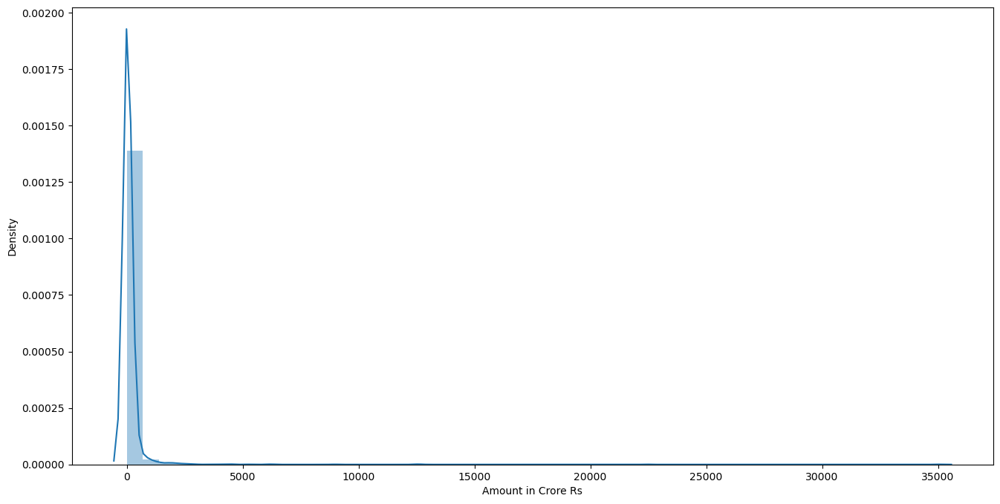

In [152]:
plt.figure(figsize=(16,8))
sns.distplot(df['Amount in Crore Rs'])

The funding distribution is highly right-skewed, showing that most startups raise relatively small to moderate funding, while a few attract extremely large investments. The long right tail (up to ~35,000 crore Rs) reflects mega funding deals that act as outliers and distort the overall scale. As a result, the mean is not a reliable measure of central tendency; median or log-transformed values provide a more realistic view of typical funding levels.

**Business Insight:**

This pattern highlights a power-law–like investment landscape, where capital is concentrated in a small number of high-potential startups. For investors and policymakers, this suggests the need for segmented funding strategies—supporting early-stage startups differently from unicorn-scale ventures—and for analysts, it emphasizes using robust metrics to avoid decisions being skewed by a few large deals.

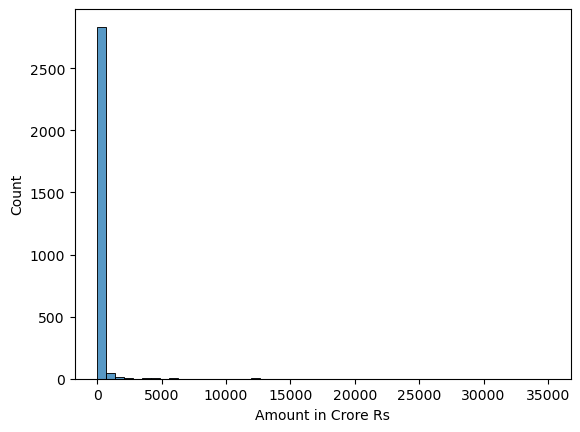

In [153]:
sns.histplot(df['Amount in Crore Rs'],bins=50)
plt.xlabel('Amount in Crore Rs')
plt.show()

<Axes: xlabel='Amount in Crore Rs'>

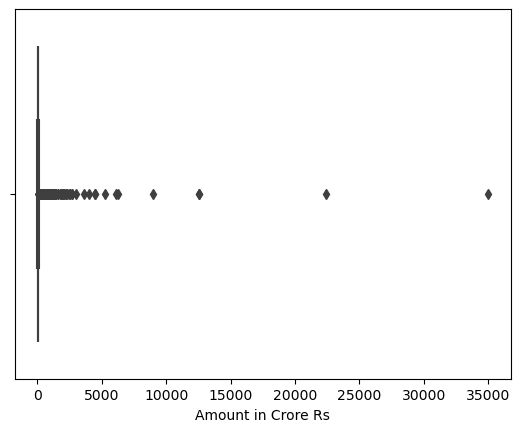

In [154]:
sns.boxplot(x=df['Amount in Crore Rs'])

<Axes: xlabel='Amount in Crore Rs'>

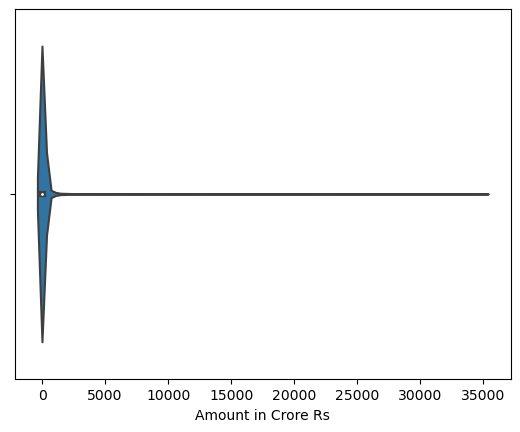

In [155]:
sns.violinplot(x=df['Amount in Crore Rs'])

### Let's create a new column 'Amount_log' to see better distribution of Amount.

<Axes: xlabel='Amount in Crore Rs', ylabel='Density'>

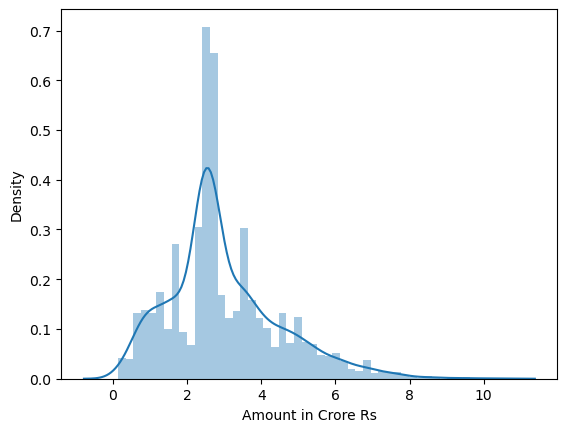

In [156]:
amount_log = np.log(df['Amount in Crore Rs']+1)
sns.distplot(amount_log)

### Total, Max, Average and Median Amount funded in Startups from year 2015 to 2020

In [157]:
M=df["Amount in Crore Rs"].agg(['sum','max','min',"mean",'median','var','std'])
M

sum       346376.667850
max        35022.000000
min            0.143680
mean         118.866393
median        14.368000
var       835593.553568
std          914.108064
Name: Amount in Crore Rs, dtype: float64

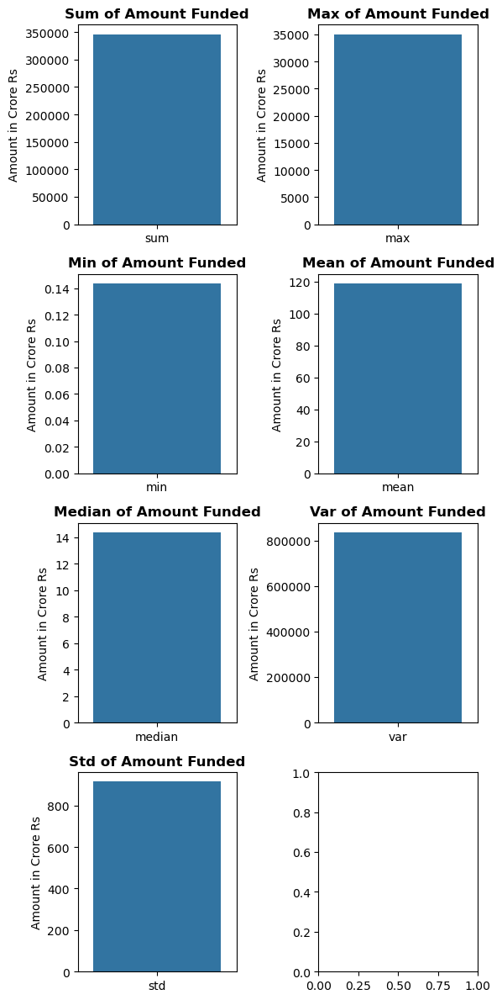

In [158]:

fig, axarr = plt.subplots(4, 2, figsize=(6, 12))

# Flatten the axarr to simplify indexing
axarr = axarr.flatten()

# Iterate over the aggregated metrics and plot
for i, metric in enumerate(M.index):
    sns.barplot(x=[metric], y=[M[metric]], ax=axarr[i])
    axarr[i].set_title(f"{metric.capitalize()} of Amount Funded", fontweight="bold")
    axarr[i].set_ylabel('Amount in Crore Rs')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


The total funding across all startups is approximately ₹3,46,376 crore, with individual funding rounds ranging
from as low as ₹0.14 crore to as high as ₹35,022 crore. While the average funding amount is ₹118.87 crore, the
median funding is only ₹14.37 crore, highlighting a strong right-skewed distribution. 
The high standard deviation (₹914.11 crore) further indicates significant variability driven by a small number of extremely large funding deals.

**Business Insight**

This disparity between mean and median suggests that most startups operate with relatively modest funding, while a few large players dominate capital inflows. For investors and analysts, relying on median funding or segmented analysis (by stage or industry) provides a more realistic view of typical investment sizes, while outlier-driven mega deals should be evaluated separately for strategic portfolio decisions.

# Analysis of Startups Based on Funding Amount

### Top 10 startups that got maximum funding amount 

In [159]:
top_10=df.groupby(["Startup Name"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
top_10

Startup Name
flipkart     42742.106000
rapido       35039.073045
paytm        30135.084000
ola          18457.043000
oyorooms      8055.060000
udaan         7812.600000
snapdeal      6286.000000
byjus         4724.827000
bigbasket     4597.760000
goqii         4522.328000
Name: Amount in Crore Rs, dtype: float64

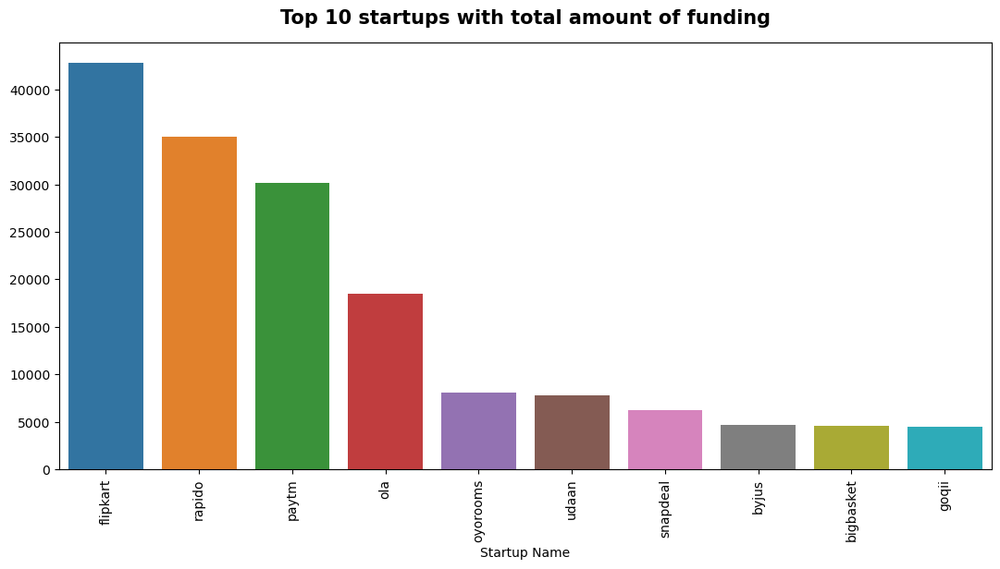

In [160]:
plt.figure(figsize=(13,6))

sns.barplot(x=top_10.index,y=top_10.values)
plt.title("Top 10 startups with total amount of funding",fontweight="black",size=15, pad=15)

plt.xticks(rotation=90);

The table shows the top 10 startups by total funding amount (in crore Rs), aggregated across all funding rounds. Flipkart, Rapido, and Paytm lead the list with exceptionally high cumulative investments, indicating strong investor confidence and long-term growth potential.

**Business Insight:**

This funding concentration highlights how capital flows heavily toward market leaders and scalable business models. Companies operating in e-commerce, fintech, mobility, and consumer internet tend to attract repeated and large investments due to their ability to capture large user bases and generate long-term returns. For investors and new startups, this suggests that scalability, market dominance, and proven traction are key drivers of funding success.

### Top 10 startups which got the highest amount funded.

In [161]:
top10=df.groupby(["Startup Name"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
top10

Startup Name
rapido                 35022.00
flipkart               22450.00
paytm                  12572.00
udaan                   5253.30
ola                     4490.00
snapdeal                4490.00
goqii                   4041.00
automation anywhere     2694.00
bigbasket               2694.00
vogo                    2541.34
Name: Amount in Crore Rs, dtype: float64

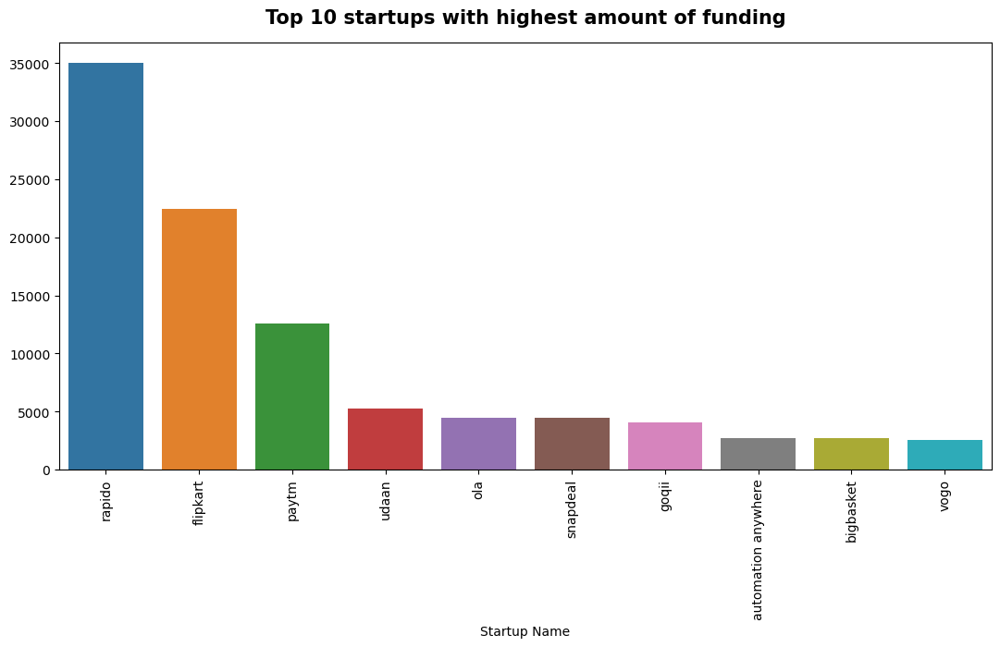

In [162]:
plt.figure(figsize=(13,6))

sns.barplot(x=top10.index,y=top10.values)
plt.title("Top 10 startups with highest amount of funding",fontweight="black",size=15, pad=15)

plt.xticks(rotation=90);

The table highlights the top 10 startups with the highest single funding amounts. Rapido leads by a wide margin, followed by Flipkart and Paytm, indicating strong investor confidence in large-scale, high-growth platforms. Companies like Udaan, Ola, and Snapdeal also feature prominently, reflecting sustained capital inflows in logistics, mobility, and e-commerce sectors.

**Business Insight**

The sharp gap between the top-funded startups and others shows that capital is heavily concentrated among a few market leaders. This suggests a “winner-takes-most” investment pattern, where investors prioritize startups with proven scale, strong market presence, and clear revenue potential. For new or smaller startups, this highlights the importance of differentiation and scalable business models to attract large funding rounds.   2541.34

### Top 10 startups that has highest frequency of Funding

In [163]:
startup=df['Startup Name'].value_counts().head(10)
print(startup)

Startup Name
ola            13
paytm           8
oyorooms        8
swiggy          8
byjus           7
urbanclap       7
lendingkart     7
lenskart        7
healthifyme     6
toppr           6
Name: count, dtype: int64


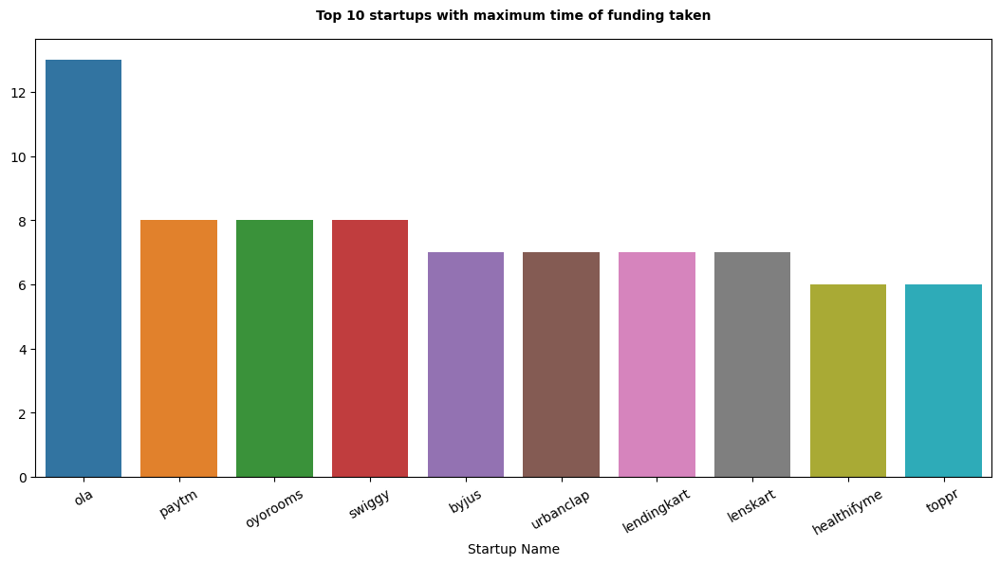

In [164]:
plt.figure(figsize=(13,6))

sns.barplot(x=startup.index,y=startup.values)
plt.title("Top 10 startups with maximum time of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=30);

The above output shows the top 10 startups with the highest number of funding records in the dataset. Startups like Ola, Paytm, OYO Rooms, Swiggy, and Byju’s appear most frequently, indicating that they have raised funds multiple times across different rounds.

**Business Insight**

This pattern suggests that successful and fast-growing startups attract repeated investments over time, rather than relying on a single large funding round. For investors and analysts, this highlights the importance of tracking funding history and growth consistency, while for startups, it shows that scalable business models and strong market traction lead to sustained investor confidence.

# Analysis of Industry Vertical Based on Funding Amount

In [166]:
topp10=df.groupby(["Industry Vertical"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
topp10

Industry Vertical
consumer internet      123000.868249
e-commerce             121358.151039
technology              23483.164266
finance                 11204.339400
logistics                7390.315500
healthcare               4783.277820
health and wellness      4726.048280
hospitality              3906.300000
fin-tech                 3217.983000
automation               2694.000000
Name: Amount in Crore Rs, dtype: float64

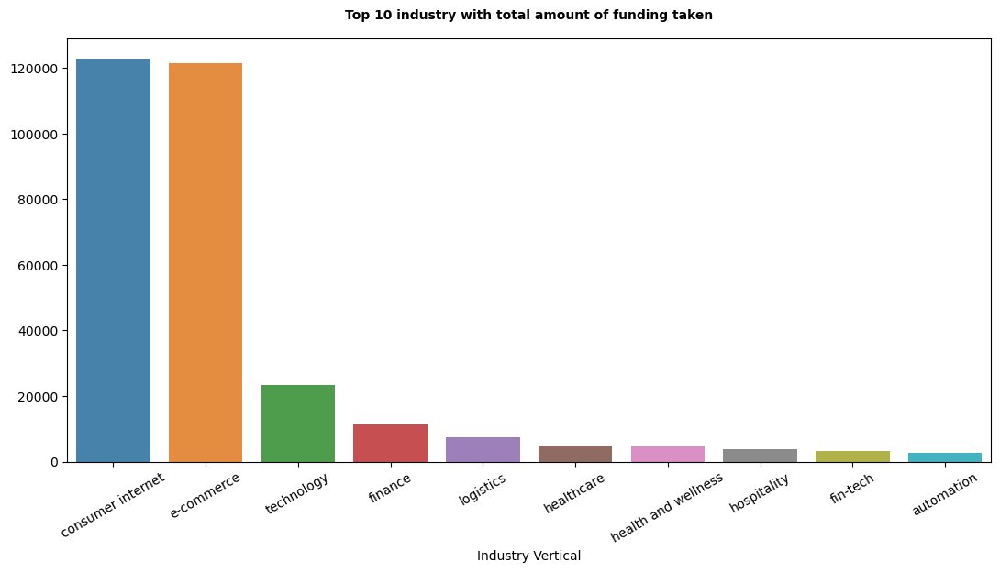

In [167]:
plt.figure(figsize=(13,6))

sns.barplot(x=topp10.index,y=topp10.values,alpha=0.9)
plt.title("Top 10 industry with total amount of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=30);

The analysis shows that Consumer Internet and E-commerce dominate startup funding, each attracting over ₹1.2 lakh crore, far exceeding other sectors. This is followed by Technology and Finance, which receive moderate but consistent investment. Sectors like Healthcare, Logistics, and Fin-Tech also feature in the top 10, indicating steady investor interest, while Automation receives comparatively lower funding.

**Business Insight:**

Investors clearly prefer scalable, digital-first industries with large customer bases and fast growth potential. For startups and businesses, this suggests that operating in or aligning with consumer-facing and online platforms can significantly improve funding opportunities, while emerging sectors may need stronger differentiation to attract capital.

In [168]:
toop10=df.groupby(["Industry Vertical"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
toop10

Industry Vertical
consumer internet           35022.00
e-commerce                  22450.00
health and wellness          4041.00
automation                   2694.00
last mile transportation     2541.34
finance                      2424.60
hospitality                  1796.00
software                     1347.00
logistics                    1347.00
agtech                       1257.20
Name: Amount in Crore Rs, dtype: float64

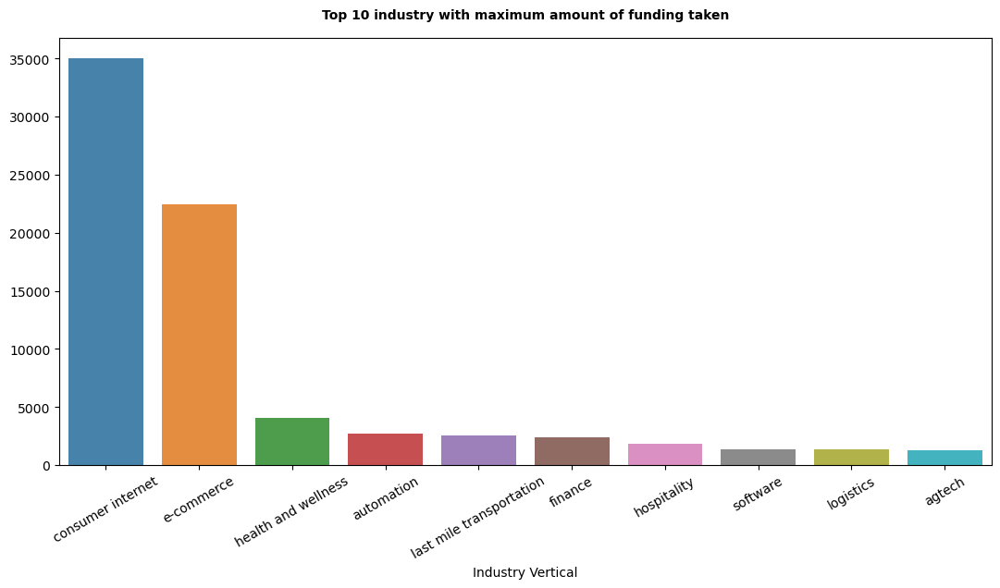

In [169]:
plt.figure(figsize=(13,6))

sns.barplot(x=toop10.index,y=toop10.values,alpha=0.9)
plt.title("Top 10 industry with maximum amount of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=30);

The table shows the top 10 industry verticals ranked by their highest single funding amount.
Consumer Internet and E-commerce dominate the list by a large margin, receiving exceptionally high investments compared to other sectors. Industries such as Health & Wellness, Automation, Finance, and Last-mile Transportation also attract significant funding, reflecting growing demand for digital services, efficiency, and convenience.

**Business Insight**

Investors tend to place big bets on scalable, high-growth sectors like consumer internet and e-commerce, while steady investments in health, automation, and finance indicate long-term confidence in technology-driven solutions. This suggests that startups operating in these domains have strong funding potential, especially if they demonstrate scalability and market impact.

In [170]:
industry=df['Industry Vertical'].value_counts().head(10)
print(industry)

Industry Vertical
consumer internet    1084
technology            525
e-commerce            362
healthcare             74
finance                60
logistics              43
food and beverage      40
ed-tech                29
education              25
fin-tech               19
Name: count, dtype: int64


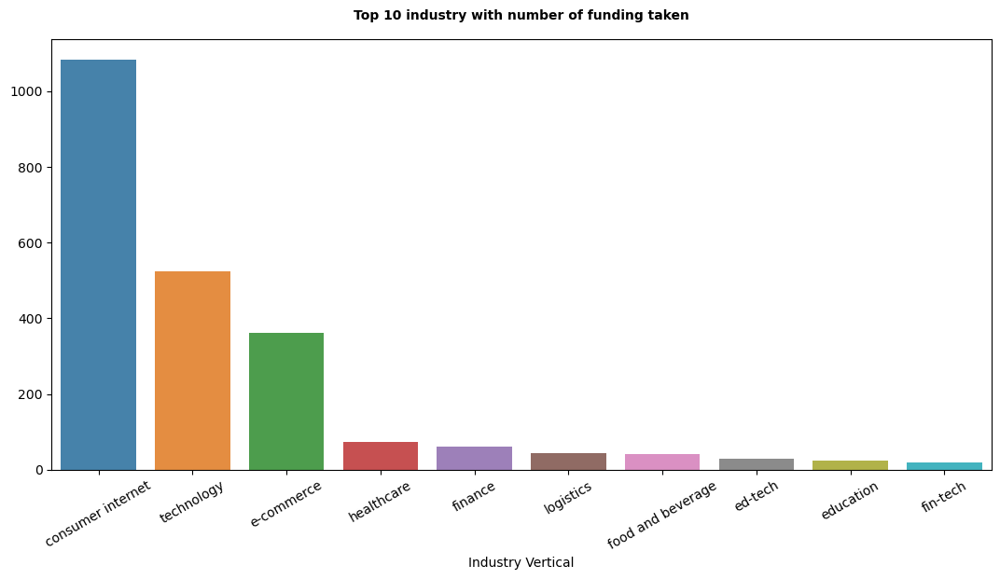

In [171]:
plt.figure(figsize=(13,6))

sns.barplot(x=industry.index,y=industry.values,alpha=0.9)
plt.title("Top 10 industry with number of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=30);

The dataset shows that consumer internet (1084 startups), technology (525), and e-commerce (362) dominate the startup ecosystem, followed by healthcare, finance, logistics, food & beverage, ed-tech, education, and fin-tech.

**Business Insight:**

Most startups are concentrated in digital and tech-driven sectors, indicating strong investor interest and market potential in online services, platforms, and technology solutions. Companies entering these industries may face high competition but also opportunities for growth and innovation.

# Analysis of SubVertical Based on Funding Amount

In [172]:
ttop10=df.groupby(["SubVertical"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
ttop10

SubVertical
bike taxi                             35022.00
online marketplace                    22450.00
mobile wallet & ecommerce platform    12572.00
b2b marketplace                        5253.30
horizontal online marketplace          4490.00
app based cab hailing services         4490.00
wearable fitness bands                 4041.00
online grocery & food store            2694.00
robotics                               2694.00
scooter sharing app                    2541.34
Name: Amount in Crore Rs, dtype: float64

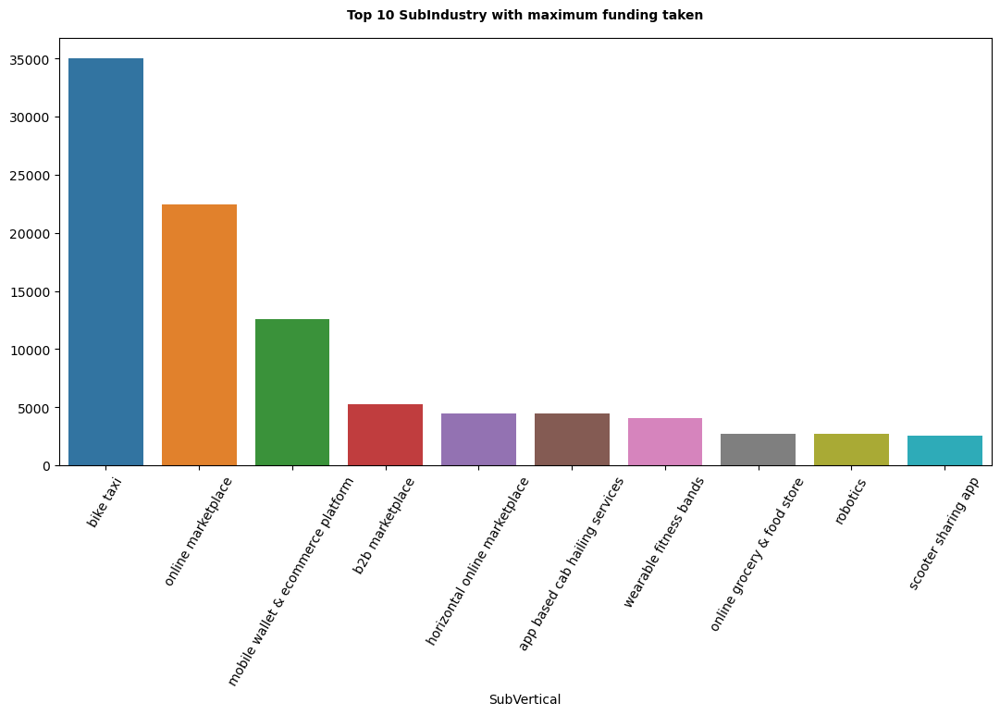

In [173]:
plt.figure(figsize=(13,6))

sns.barplot(x=ttop10.index,y=ttop10.values)
plt.title("Top 10 SubIndustry with maximum funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=60);

* The table shows the top 10 startup sub-verticals by their maximum funding:

  * Bike taxi received the highest funding at ₹35,022 crore, followed by online marketplaces (₹22,450 crore) and mobile wallet & e-commerce platforms (₹12,572 crore).

  * Other notable sub-verticals include B2B marketplaces, app-based cab services, wearable fitness bands, and robotics, with funding ranging from ₹2,500–₹5,250 crore.

**Business Insight:**
Investors tend to concentrate large capital in high-growth consumer platforms like mobility, e-commerce, and digital wallets. Startups in these sectors show high scalability potential, making them attractive for funding, while niche or emerging tech sectors receive moderate investment.

In [174]:
sub10=df.groupby(["SubVertical"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
sub10

SubVertical
online marketplace                    44607.252000
bike taxi                             35039.073045
mobile wallet & ecommerce platform    30135.084000
unknown                               20894.642448
app based cab hailing services        18457.043000
budget rooms                           8055.060000
b2b marketplace                        7843.581000
horizontal online marketplace          6286.000000
e-learning                             4981.841964
online grocery & food store            4597.760000
Name: Amount in Crore Rs, dtype: float64

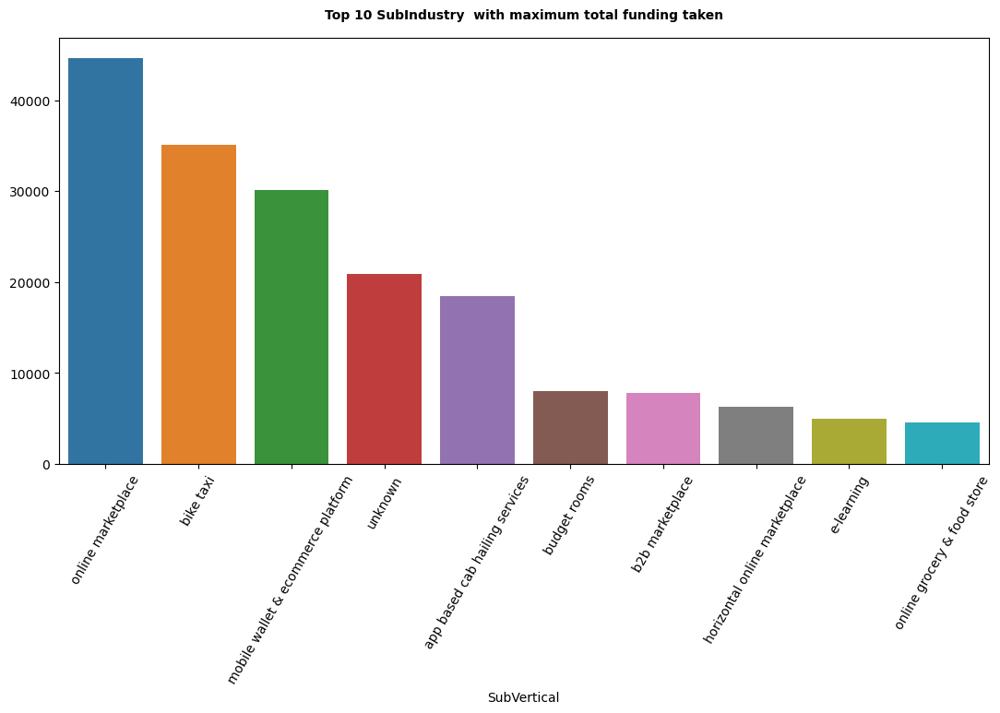

In [175]:
plt.figure(figsize=(13,6))

sns.barplot(x=sub10.index,y=sub10.values)
plt.title("Top 10 SubIndustry with maximum total funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=60);

**Top 10 SubIndustry with highest total funding taken (Sum)**- 

The analysis shows that online marketplaces have attracted the highest total funding, followed by bike taxi services and mobile wallet & e-commerce platforms. These sectors dominate overall investment, indicating strong investor confidence in platform-based and tech-driven business models.

**Business Insight:**

Investors are clearly favoring scalable, high-usage digital platforms that can quickly expand their user base and generate recurring revenue. The strong presence of mobility, fintech, and online commerce suggests that startups solving everyday consumer needs tend to receive higher funding. For new or early-stage startups, aligning with these high-growth sectors can improve funding potential and market visibility.

In [176]:
subindustry=df['SubVertical'].value_counts().head(10)
print(subindustry)

SubVertical
unknown                           509
online lending platform            26
online food delivery               16
app based cab hailing services     13
e-learning                         13
food delivery platform             11
online pharmacy                    11
online learning platform           10
online marketplace                  9
logistics                           8
Name: count, dtype: int64


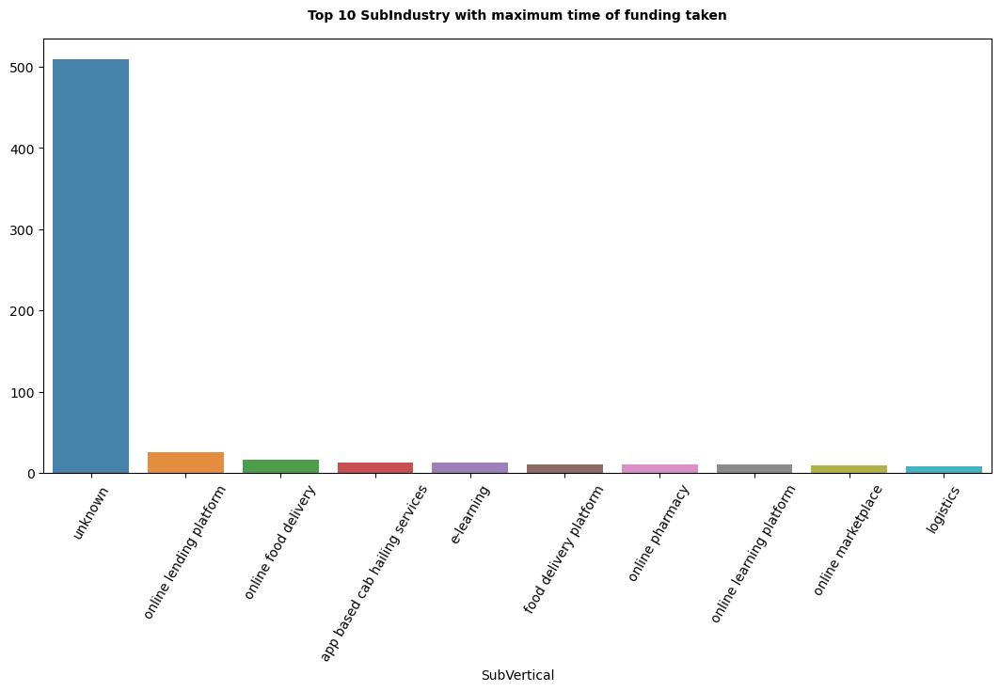

In [177]:
plt.figure(figsize=(13,6))

sns.barplot(x=subindustry.index,y=subindustry.values,alpha=0.9)
plt.title("Top 10 SubIndustry with maximum time of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=60);

**Top 10 SubIndustry with highest frequency of Funding taken**

The results show that “unknown” is the most frequent sub-industry, indicating missing or incomplete classification in the dataset. Among the clearly defined categories, online lending platforms, food delivery, cab-hailing services, e-learning, and online pharmacies appear most often, reflecting strong activity in digital-first and consumer internet sectors.

**Business Insight:**

This pattern suggests that fintech, food-tech, ed-tech, and mobility startups are major drivers of startup activity and funding. However, the large number of “unknown” entries highlights a data quality gap, and improving sub-industry tagging could lead to more accurate market analysis and better investment insights.

# Analysis of Cities Based on Funding Amount

In [178]:
city10=df.groupby(["City"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
city10

City
bangalore     185733.755172
mumbai         46394.299075
gurugram       42918.163767
new delhi      26309.409583
chennai         7837.582360
pune            6979.633160
noida           4589.803720
hyderabad       4099.441840
california      2694.000000
kormangala      2605.708640
Name: Amount in Crore Rs, dtype: float64

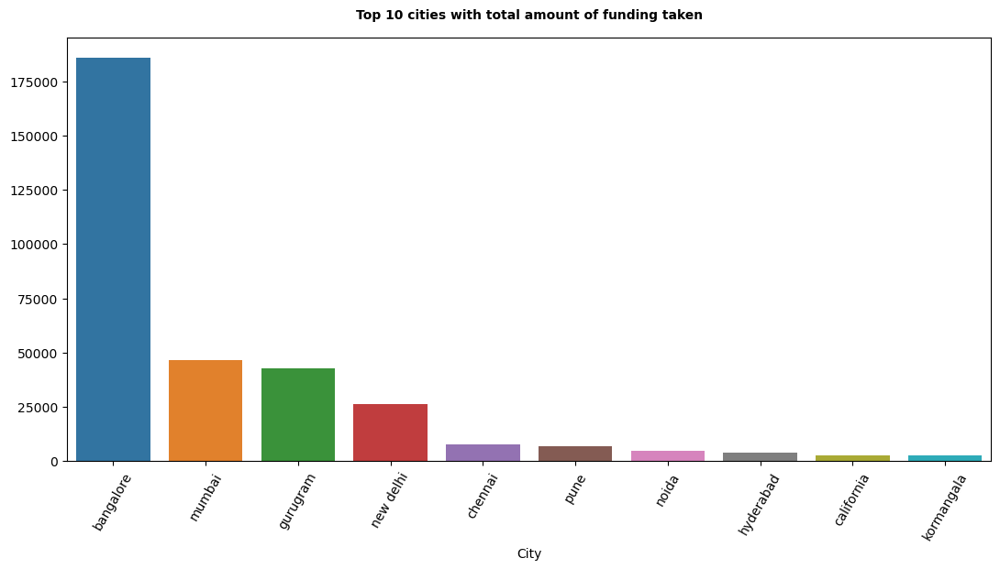

In [179]:
plt.figure(figsize=(13,6))

sns.barplot(x=city10.index,y=city10.values)
plt.title("Top 10 cities with total amount of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=60);

**Top 10 cities with Total Amount of Funding taken**

The analysis shows that Bangalore dominates startup funding, with a total investment of ~₹1.85 lakh crore, far ahead of other cities. Mumbai and Gurugram follow as the next major hubs, while New Delhi also attracts a significant share of funding. Other cities like Chennai, Pune, Noida, and Hyderabad receive comparatively lower but still notable investments.

**Business Insight:**

This pattern highlights a strong geographic concentration of capital in a few startup ecosystems, especially Bangalore. For investors, these cities represent high-opportunity innovation hubs, while policymakers and founders in other regions can focus on improving infrastructure and ecosystem support to attract more funding.

In [180]:
city_10=df.groupby(["City"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
city_10

City
bangalore             35022.00
new delhi              4490.00
mumbai                 4041.00
california             2694.00
kormangala             2541.34
gurugram               2245.00
bangalore/ bangkok     2029.48
san francisco          1347.00
san jose               1212.30
santa monica            987.80
Name: Amount in Crore Rs, dtype: float64

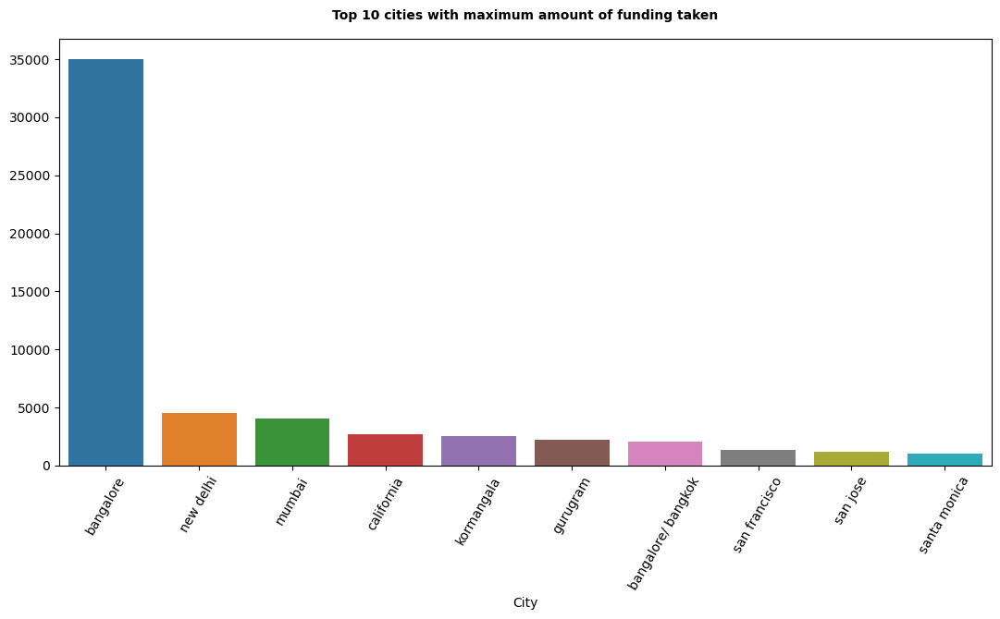

In [181]:
plt.figure(figsize=(13,6))

sns.barplot(x=city_10.index,y=city_10.values)
plt.title("Top 10 cities with maximum amount of funding taken",fontweight="black",size=10, pad=15)

plt.xticks(rotation=60);

**Top 10 Cities by Maximum Funding Amount**

The above analysis shows the top 10 cities based on the highest single funding amount raised. Bangalore clearly leads with a maximum funding of ₹35,022 crore, followed by New Delhi and Mumbai, indicating their strong startup ecosystems. International locations like California, San Francisco, San Jose, and Santa Monica also appear, highlighting the global nature of high-value startup investments.

**Business Insight:**

This suggests that major startup hubs attract larger investment deals, likely due to better infrastructure, talent availability, investor presence, and scalable business opportunities. For investors and founders, focusing on these cities can increase visibility, access to capital, and growth potential, while policymakers can use this insight to strengthen emerging startup ecosystems in other regions.

In [182]:
city=df['City'].value_counts().head(10)
city

City
bangalore    865
mumbai       567
new delhi    443
gurugram     388
pune         115
chennai      103
hyderabad    101
noida         98
ahmedabad     40
jaipur        25
Name: count, dtype: int64

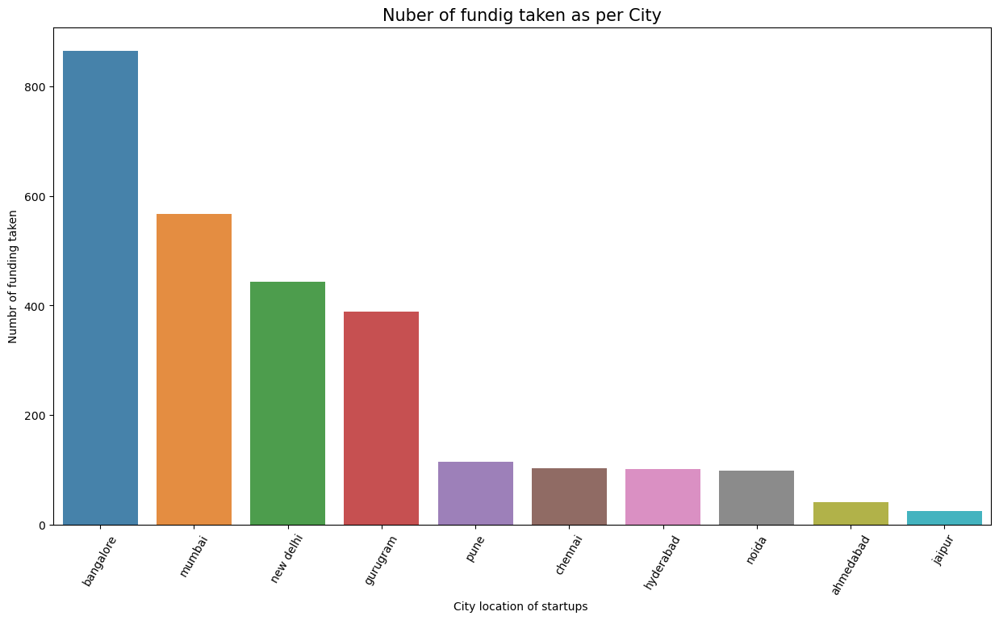

In [183]:
plt.figure(figsize=(15,8))
sns.barplot(x=city.index,y=city.values,alpha=0.9)
plt.xticks(rotation=60)
plt.xlabel('City location of startups ',fontsize=10)
plt.ylabel('Numbr of funding taken',fontsize=10)
plt.title('Nuber of fundig taken as per City',fontsize=15)
plt.show()

**Top 10 Cities by Number of Startups**

Bangalore leads by a large margin, followed by Mumbai and New Delhi. These cities host the highest concentration of funded startups.

**Business Insight:**

Startup activity in India is highly centralized. Investors and incubators focus heavily on a few metro hubs, making them prime locations for networking, talent, and capital access.

In [248]:
mean_amount_per_city = df.groupby('City')['Amount in Crore Rs'].mean().head(10)
median_amount_per_city = df.groupby('City')['Amount in Crore Rs'].median().head(10)

print("Mean amount of funding each city:\n", mean_amount_per_city)
print("\nMedian amount of funding  each city:\n", median_amount_per_city)

Mean amount of funding each city:
 City
agra                       30.756500
ahmedabad                  50.420679
amritsar                    2.694000
bangalore                 214.721104
bangalore / palo alto       8.980000
bangalore / san mateo      71.840000
bangalore / sfo            20.205000
bangalore / usa            44.900000
bangalore and gurugram     26.940000
bangalore/ bangkok        706.127333
Name: Amount in Crore Rs, dtype: float64

Median amount of funding  each city:
 City
agra                      30.7565
ahmedabad                 11.4495
amritsar                   2.6940
bangalore                 14.3680
bangalore / palo alto      8.9800
bangalore / san mateo     71.8400
bangalore / sfo           20.2050
bangalore / usa           44.9000
bangalore and gurugram    26.9400
bangalore/ bangkok        71.8400
Name: Amount in Crore Rs, dtype: float64


**Mean vs Median Funding by City**

Some cities (e.g., Bangalore) show a large gap between mean and median funding, indicating the presence of a few very large funding rounds.

**Business Insight:**

Funding distribution across cities is uneven. A small number of high-value deals inflate average funding, so median funding is a better indicator of typical startup capital in each city.

# Year wise analysis based on Amount

In [184]:
year10=df.groupby(["year"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
year10

year
2017    97262.844535
2019    85285.435435
2015    77351.582535
2018    41596.324614
2016    41376.419590
2020     3504.061141
Name: Amount in Crore Rs, dtype: float64

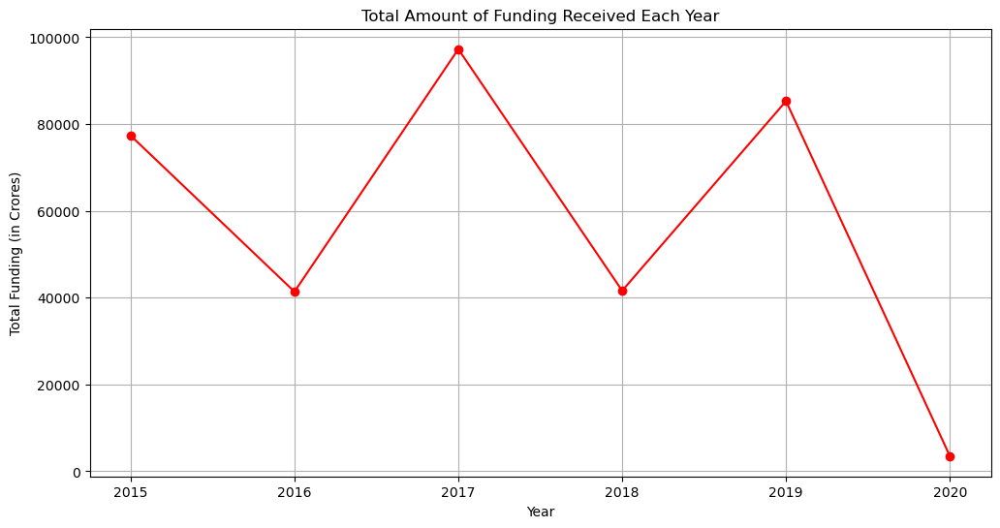

In [185]:
# Plotting the total funding received each year

plt.figure(figsize=(12,6))
df.groupby('year')['Amount in Crore Rs'].sum().plot(marker='o', color='red')
plt.title('Total Amount of Funding Received Each Year')
plt.xlabel('Year')
plt.ylabel('Total Funding (in Crores)')
plt.grid(True)
plt.show()

**Total Funding Received per Year**

Years like 2017 and 2019 attracted the highest total funding, while funding dropped sharply in 2020.

**Business Insight:**

Startup investments are cyclical and influenced by market conditions. The drop in 2020 suggests external shocks (e.g., economic slowdown), emphasizing the need for risk-aware investment planning.

In [186]:
year10=df.groupby(["year"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
year10

year
2019    35022.0
2017    22450.0
2015     6286.0
2018     2694.0
2016     1796.0
2020     1796.0
Name: Amount in Crore Rs, dtype: float64

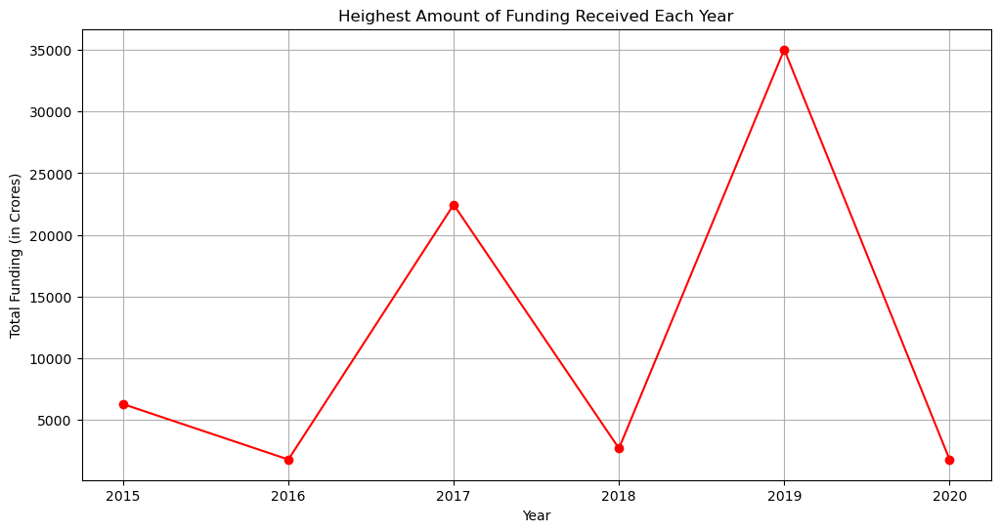

In [187]:
# Plotting the heighest funding received each year

plt.figure(figsize=(12,6))
df.groupby(df['year'])['Amount in Crore Rs'].max().plot(marker='o', color='red')
plt.title('Heighest Amount of Funding Received Each Year')
plt.xlabel('Year')
plt.ylabel('Total Funding (in Crores)')
plt.grid(True)
plt.show()

**Maximum Funding Deal per Year**

A few years saw exceptionally large single funding rounds, especially in 2019 and 2017.

**Business Insight:**

Total yearly funding is often driven by one or two mega deals, not widespread investment. Investors should not judge ecosystem strength based only on headline numbers.

### Trend of investments' frequency over the years 2015 - 2020

In [188]:
year10=df.groupby(["year"])["Amount in Crore Rs"].count().sort_values(ascending=False).head(10)
year10

year
2016    988
2015    833
2017    684
2018    296
2019    106
2020      7
Name: Amount in Crore Rs, dtype: int64

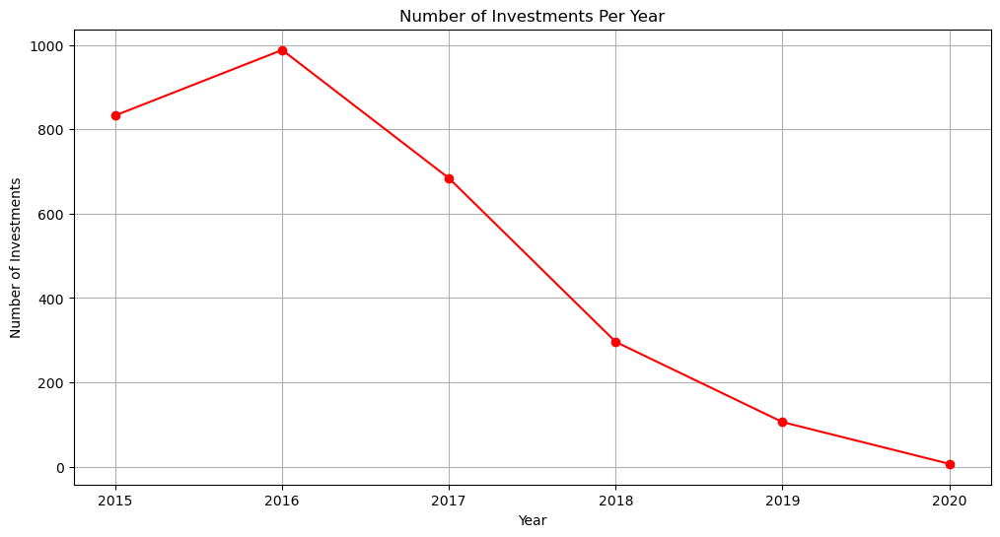

In [189]:
# Number of Investments per Year

plt.figure(figsize=(12,6))
df.groupby(df['year']).size().plot(marker='o', color='red')
plt.title('Number of Investments Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Investments')
plt.grid(True)
plt.show()

**Number of Funding Rounds per Year**

Funding activity peaked in 2015–2017 and declined significantly after 2018.

**Business Insight:**

Early-stage startup activity was stronger in earlier years. Fewer deals in later years indicate higher selectivity and maturity in the funding ecosystem.

In [190]:
mean_amount_per_year = df.groupby('year')['Amount in Crore Rs'].mean()
median_amount_per_year = df.groupby('year')['Amount in Crore Rs'].median()

print("Mean amount of funding each year:\n", mean_amount_per_year)
print("\nMedian amount of funding  each year:\n", median_amount_per_year)

Mean amount of funding each year:
 year
2015     92.859043
2016     41.878967
2017    142.197141
2018    140.528124
2019    804.579580
2020    500.580163
Name: Amount in Crore Rs, dtype: float64

Median amount of funding  each year:
 year
2015     14.368
2016     10.327
2017     14.368
2018     28.287
2019    105.515
2020     80.820
Name: Amount in Crore Rs, dtype: float64


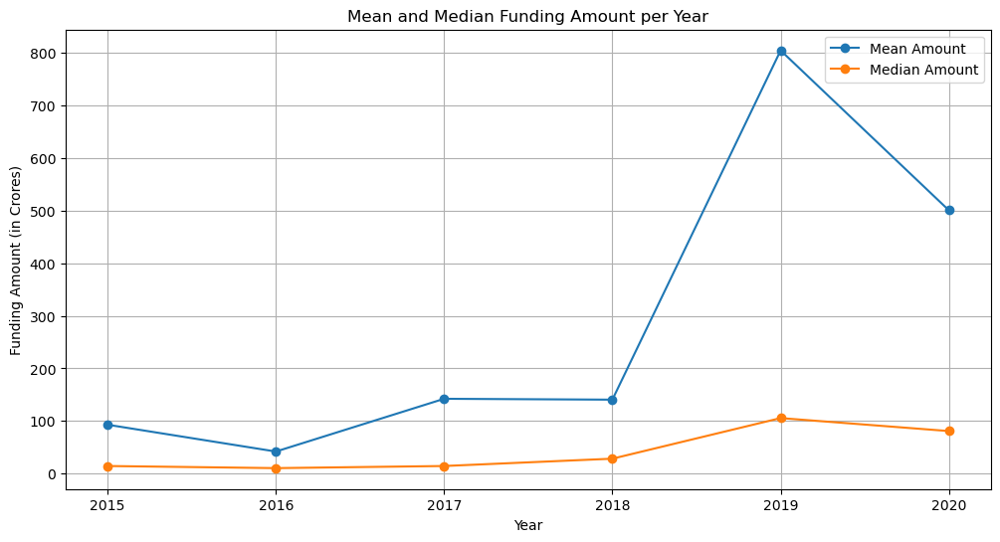

In [191]:
plt.figure(figsize=(12, 6))

plt.plot(mean_amount_per_year.index, mean_amount_per_year.values, label='Mean Amount', marker='o')
plt.plot(median_amount_per_year.index, median_amount_per_year.values, label='Median Amount', marker='o')

plt.title('Mean and Median Funding Amount per Year')
plt.xlabel('Year')
plt.ylabel('Funding Amount (in Crores)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

**Mean vs Median Funding by Year**

Mean funding is much higher than median in recent years, especially in 2019 and 2020.

**Business Insight:**

This highlights skewed investment behavior, where a small number of startups receive very large investments while most raise modest amounts.

# Analysis of Investment Type Based on Funding Amount

In [196]:
# Calculate total amount of funding for each type of investment
investment_totals = df.groupby('Investment Type')['Amount in Crore Rs'].sum().sort_values(ascending=False).head(10)
investment_totals

Investment Type
private equity round    239290.172609
series b                 43150.657700
seed funding             17738.817284
series d                 13306.555020
series c                  9381.571178
funding round             8980.000000
seed/angel funding        2810.605830
series g                  2074.380000
series a                  1860.207000
debt funding              1466.095939
Name: Amount in Crore Rs, dtype: float64

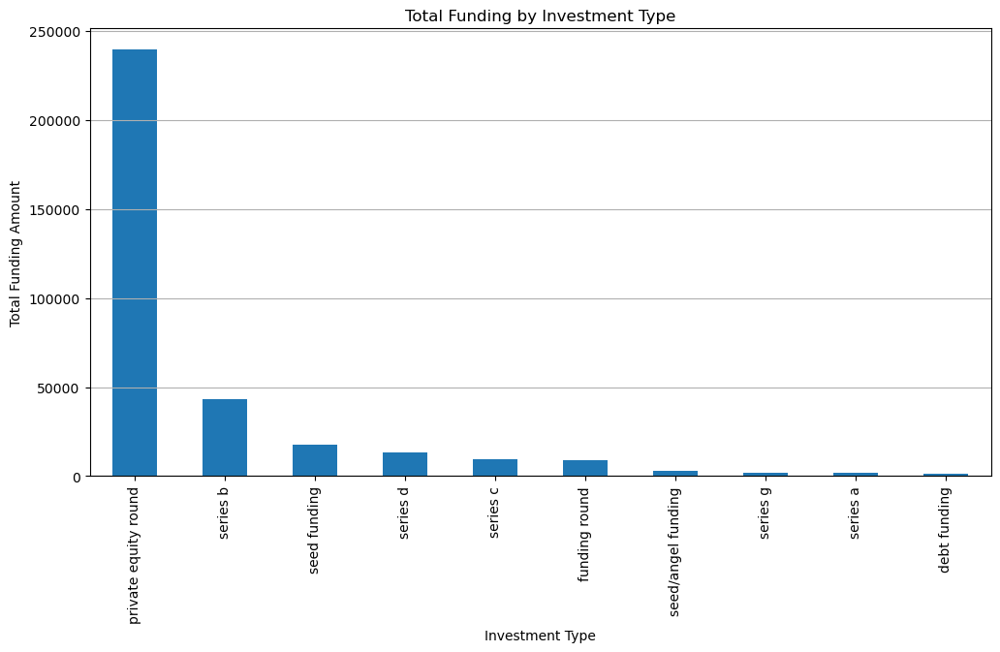

In [197]:
# Plot the total funding by investment type
plt.figure(figsize=(12, 6))
investment_totals.plot(kind='bar')
plt.title('Total Funding by Investment Type')
plt.xlabel('Investment Type')
plt.ylabel('Total Funding Amount')
plt.xticks(rotation=90)
plt.grid(axis='y')

# Show the plot
plt.show()

**Total Funding by Investment Type**

Private Equity and Series B rounds dominate total funding amounts.

**Business Insight:**

Most capital flows toward later-stage startups, showing investor preference for lower-risk, scalable businesses rather than early experimentation.

In [198]:
# Calculate total amount of funding for each type of investment
investment_max = df.groupby('Investment Type')['Amount in Crore Rs'].max().sort_values(ascending=False).head(10)
investment_max

Investment Type
series b                35022.00
private equity round    22450.00
funding round            8980.00
series d                 5253.30
series c                 4041.00
series g                 2074.38
seed funding             1975.60
series h                 1347.00
single venture           1257.20
equity based funding      898.00
Name: Amount in Crore Rs, dtype: float64

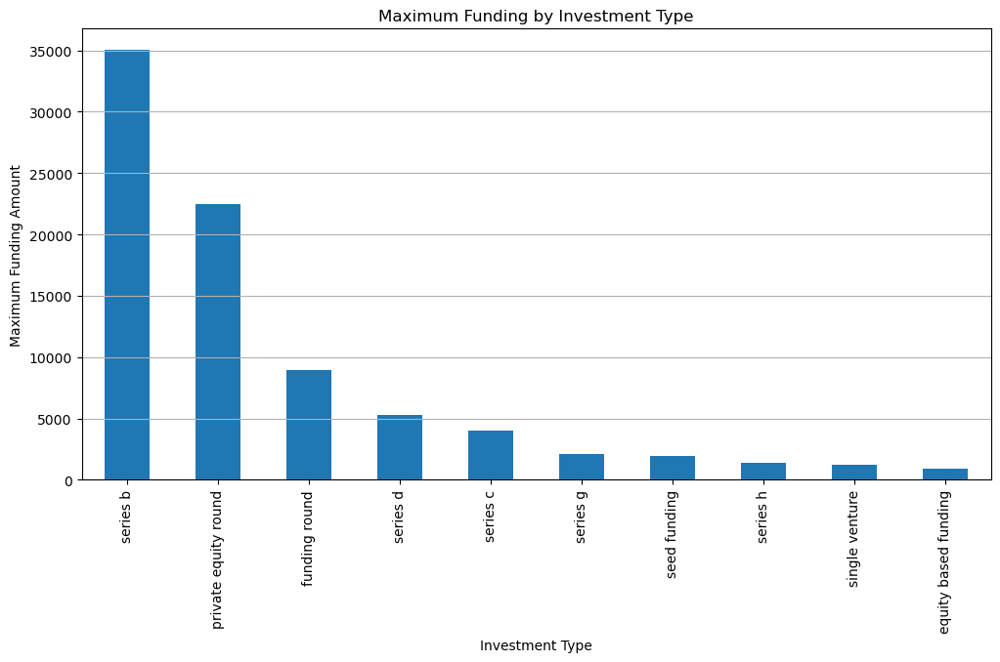

In [199]:
# Plot the total funding by investment type
plt.figure(figsize=(12, 6))
investment_max.plot(kind='bar')
plt.title('Maximum Funding by Investment Type')
plt.xlabel('Investment Type')
plt.ylabel('Maximum Funding Amount')
plt.xticks(rotation=90)
plt.grid(axis='y')

# Show the plot
plt.show()

**Maximum Funding by Investment Type**

Large one-time investments are mainly seen in Series B and Private Equity rounds.

**Business Insight:**

High-value investments are concentrated in growth-stage companies, signaling confidence in market-proven business models.

In [200]:
invest10=df.groupby(["Investment Type"])["Amount in Crore Rs"].count().sort_values(ascending=False).head(10)
invest10

Investment Type
seed funding            1333
private equity round    1316
seed/angel funding       130
debt funding              25
series a                  24
series b                  21
series c                  14
series d                  12
pre series a               9
venture round              4
Name: Amount in Crore Rs, dtype: int64

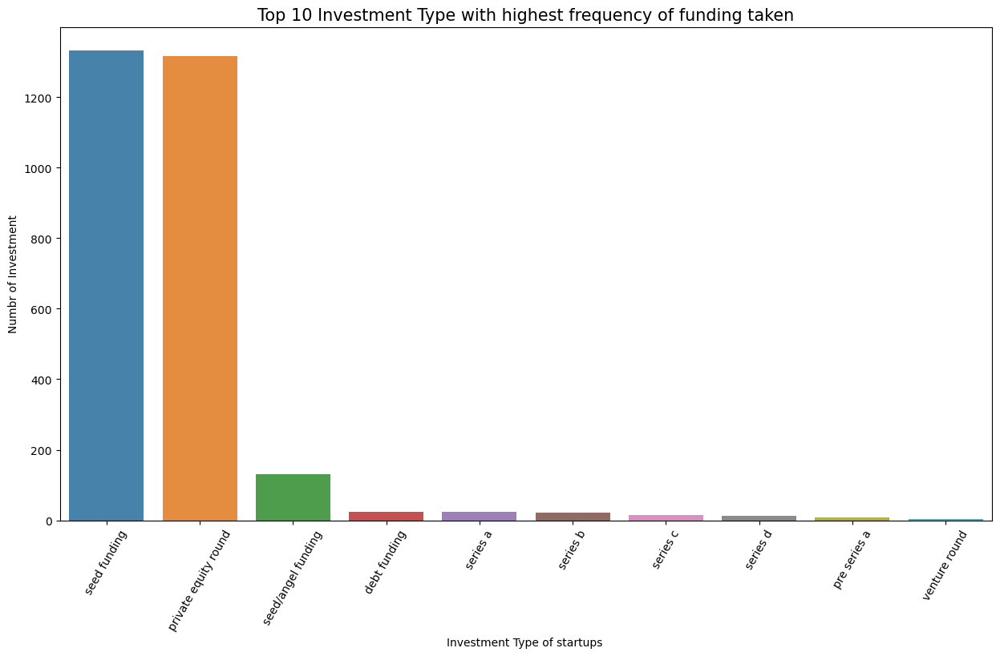

In [201]:
plt.figure(figsize=(15,8))
sns.barplot(x=invest10.index,y=invest10.values,alpha=0.9)
plt.xticks(rotation=60)
plt.xlabel('Investment Type of startups ',fontsize=10)
plt.ylabel('Numbr of Investment',fontsize=10)
plt.title('Top 10 Investment Type with highest frequency of funding taken',fontsize=15)
plt.show()

**Number of Deals by Investment Type**

The table shows the top 10 investment types by number of funding deals.
Seed Funding and Private Equity Rounds dominate the landscape, accounting for the highest number of investments. Other funding stages like Series A, B, and C appear far less frequently, indicating fewer startups reach later funding stages.

**Business Insight:**

This pattern suggests a strong focus on early-stage investments, where investors spread risk across many startups. For founders, this highlights high competition at the seed stage and the importance of building strong traction to progress to later rounds. For investors, it reflects a strategy of diversification early and selectivity in growth-stage funding.

# Analysis of Investor Names Based on Funding Amount

In [202]:
inv_10=df.groupby(["Investors Name"])["Amount in Crore Rs"].sum().sort_values(ascending=False).head(10)
inv_10

Investors Name
westbridge capital                          35629.048
softbank                                    22450.000
softbank group                              13173.660
microsoft, ebay, tencent holdings           12572.000
vijay shekhar sharma                         9112.006
steadview capital and existing investors     6286.000
alibaba group, ant financial                 6106.400
softbank vision fund                         5396.980
altimeter capital, dst global                5253.300
alibaba, foxconn, softbank                   4490.000
Name: Amount in Crore Rs, dtype: float64

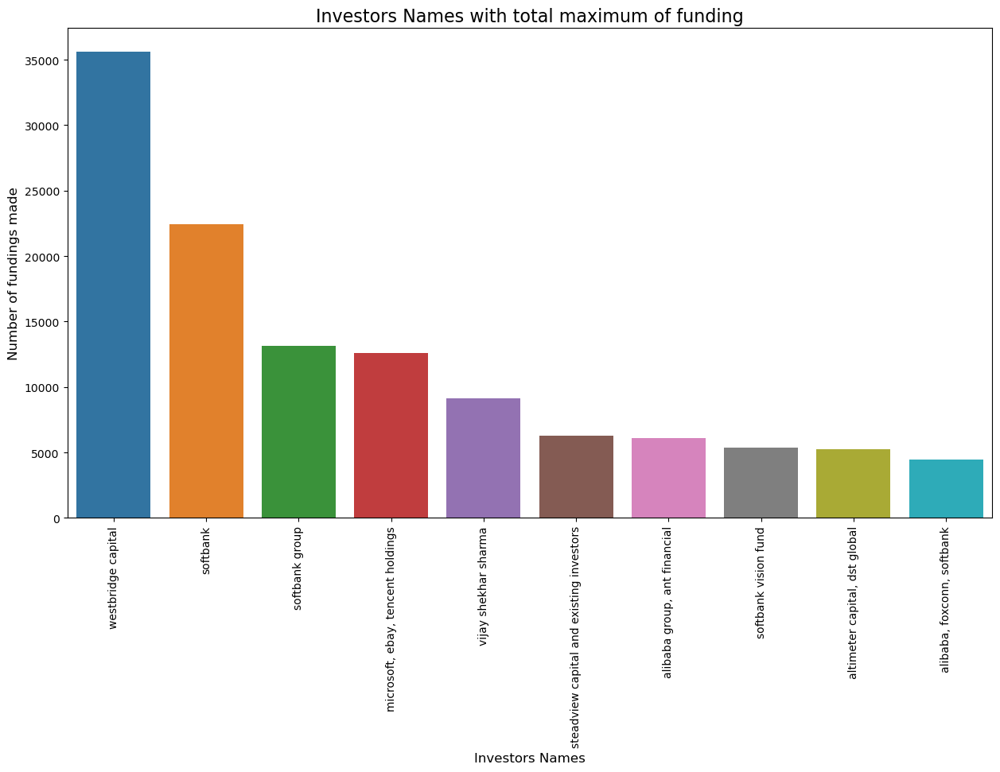

In [203]:
plt.figure(figsize=(15,8))
sns.barplot(x=inv_10.index, y=inv_10.values)
plt.xticks(rotation=90)
plt.xlabel('Investors Names', fontsize=12)
plt.ylabel('Number of fundings made', fontsize=12)
plt.title("Investors Names with total maximum of funding", fontsize=16)
plt.show()

**Top 10 Investors by Total Funding Amount (Sum)**

This output shows investors who have contributed the highest cumulative funding across all their investments. WestBridge Capital and SoftBank dominate in terms of total capital deployed. These investors tend to participate in multiple high-value funding rounds, not just one-off deals.

**Business Insight:**

Investors with high total funding play a major role in shaping the startup ecosystem. Their repeated large investments indicate strong risk appetite and long-term confidence in scalable startups.

In [204]:
inv10=df.groupby(["Investors Name"])["Amount in Crore Rs"].max().sort_values(ascending=False).head(10)
inv10

Investors Name
westbridge capital                                                                             35022.0
softbank                                                                                       22450.0
microsoft, ebay, tencent holdings                                                              12572.0
softbank group                                                                                 12572.0
vijay shekhar sharma                                                                            8980.0
steadview capital and existing investors                                                        6286.0
alibaba group, ant financial                                                                    6106.4
altimeter capital, dst global                                                                   5253.3
baillie gifford, falcon edge capital, tiger global, softbank group, dst global, didi kuaidi     4490.0
alibaba, foxconn, softbank                                

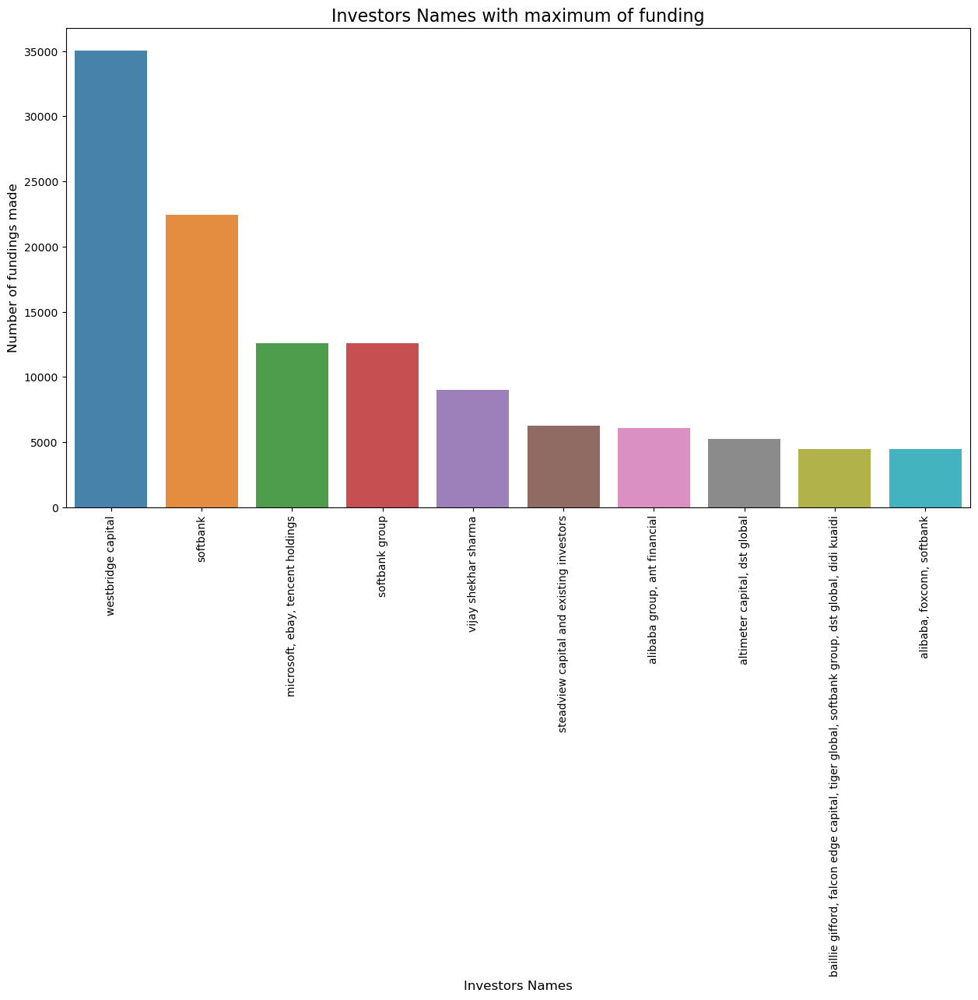

In [205]:
plt.figure(figsize=(15,8))
sns.barplot(x=inv10.index, y=inv10.values, alpha=0.9)
plt.xticks(rotation=90)
plt.xlabel('Investors Names', fontsize=12)
plt.ylabel('Number of fundings made', fontsize=12)
plt.title("Investors Names with maximum of funding", fontsize=16)
plt.show()

**Top 10 Investors by Maximum Single Investment (Max)**

This output highlights investors known for making very large single-ticket investments. The ranking shows that some investors may appear lower in total funding but still make huge one-time bets. WestBridge Capital and SoftBank again stand out with exceptionally large deals.

**Business Insight:**

Large single investments often indicate late-stage funding or strategic dominance. Such investors usually influence valuation, expansion speed, and market leadership of startups.

In [206]:
investors = df['Investors Name'].value_counts().head(10)
print(investors)

Investors Name
undisclosed investors       113
indian angel network         27
ratan tata                   26
kalaari capital              15
sequoia capital              15
accel partners               14
group of angel investors     12
info edge (india) ltd        11
saif partners                11
brand capital                11
Name: count, dtype: int64


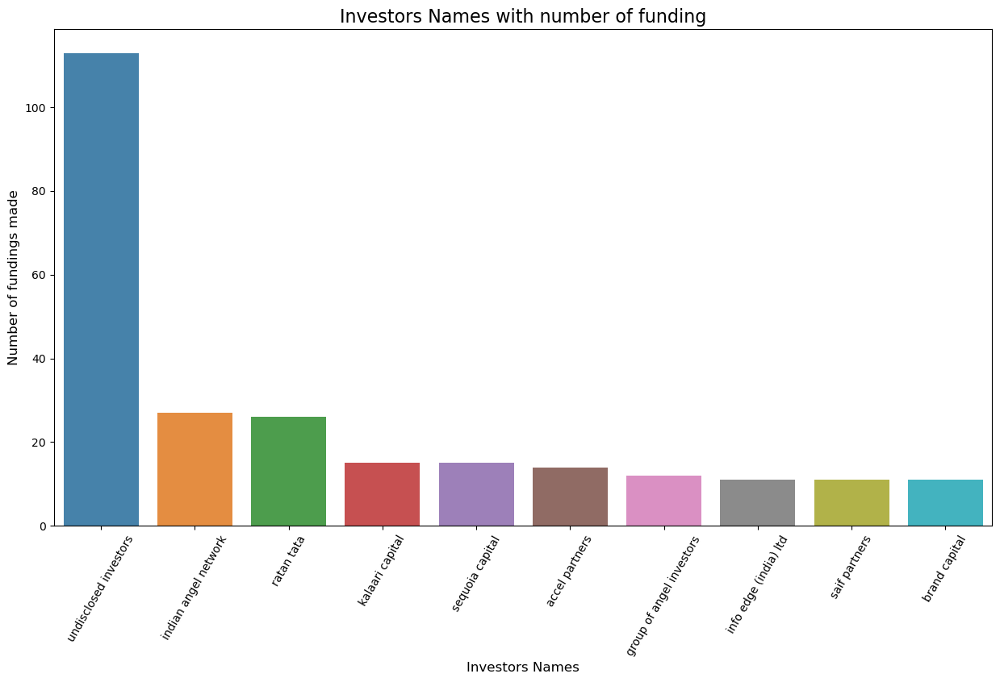

In [207]:
plt.figure(figsize=(15,8))
sns.barplot(x=investors.index, y=investors.values, alpha=0.9)
plt.xticks(rotation=60)
plt.xlabel('Investors Names', fontsize=12)
plt.ylabel('Number of fundings made', fontsize=12)
plt.title("Investors Names with number of funding", fontsize=16)
plt.show()

**Top 10 Investors by Number of Investments (Frequency)**

This output identifies investors who are most active by deal count, regardless of funding size. Undisclosed investors and angel networks appear frequently, indicating early-stage participation. Individual investors and VC firms focus on volume rather than deal size.

**Business Insight:**

High-frequency investors are crucial for early-stage startup growth and ecosystem diversity. Angel and seed investors help identify future high-growth companies before large VCs enter.

# **--------------------------------------- END ----------------------------------------------**

# EXTRA EDA PART

### Top and Bottom 10 Industry sectors that gets highest and lowest amount of funding resp.

In [208]:
sectors=df.groupby(["Industry Vertical"])["Amount in Crore Rs"].sum().sort_values(ascending=False)
top10_=sectors.head(10)
bottom10_=sectors.tail(10)

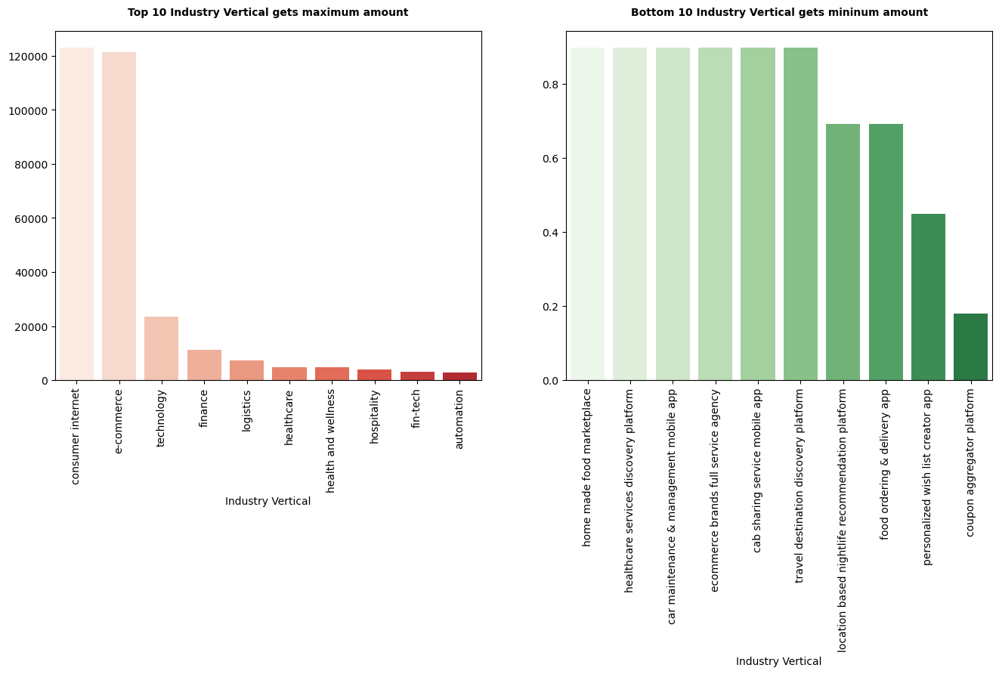

In [209]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.barplot(x=top10_.index,y=top10_.values,palette=sns.color_palette("Reds",12))
plt.title("Top 10 Industry Vertical gets maximum amount",fontweight="black",size=10, pad=15)
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x=bottom10_.index,y=bottom10_.values,palette=sns.color_palette("Greens",12))
plt.title("Bottom 10 Industry Vertical gets mininum amount",fontweight="black",size=10, pad=15)
plt.xticks(rotation=90);

### Top and Bottom 10 Industry sectors that gets max. and min. number of funding resp.

In [210]:
df3 = df[(df["Amount in Crore Rs"] != 0) & (df['Industry Vertical'] != 'unknown')]
sector = df3.groupby(["Industry Vertical"])["Amount in Crore Rs"].count().sort_values(ascending=False)

top10 = sector.head(10)
bottom10 = sector.tail(10)

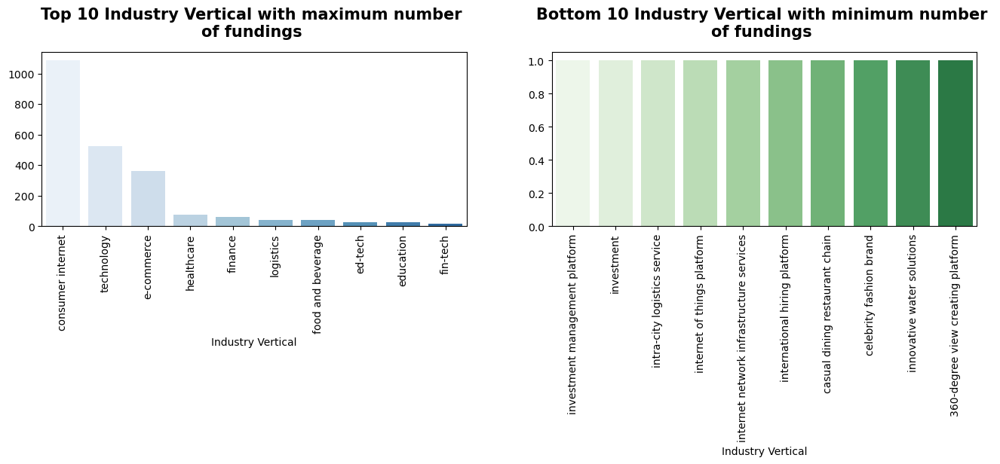

In [211]:
plt.figure(figsize=(16,3))
plt.subplot(1,2,1)
sns.barplot(x=top10.index,y=top10.values,palette=sns.color_palette("Blues",12))
plt.title("Top 10 Industry Vertical with maximum number \nof fundings ",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90)
plt.subplot(1,2,2)
sns.barplot(x=bottom10.index,y=bottom10.values,palette=sns.color_palette("Greens",12))
plt.title("Bottom 10 Industry Vertical with minimum number \nof fundings ",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90);

### From the graph above, we can see that Consumer Internet, Technology and E-Commerce are the top three favored industries by investors for funding. Now let's focus on the SubVertical of these three industries.

In [212]:
## Sub Category

In [213]:
df4 = df[(df["Amount in Crore Rs"] != 0) & (df['SubVertical'] != 'unknown')]
sector1 = df4.groupby(["SubVertical"])["Amount in Crore Rs"].count().sort_values(ascending=False)

subtop10 = sector1.head(10)
subbottom10 = sector1.tail(10)

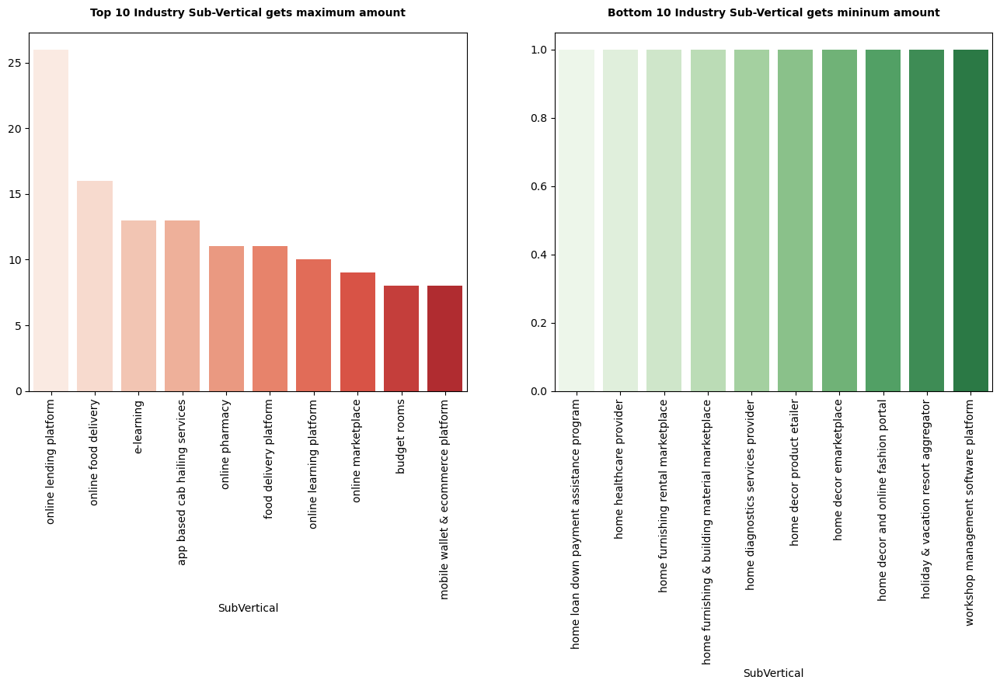

In [214]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.barplot(x=subtop10.index,y=subtop10.values,palette=sns.color_palette("Reds",12))
plt.title("Top 10 Industry Sub-Vertical gets maximum amount",fontweight="black",size=10, pad=15)
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x=subbottom10.index,y=subbottom10.values,palette=sns.color_palette("Greens",12))
plt.title("Bottom 10 Industry Sub-Vertical gets mininum amount",fontweight="black",size=10, pad=15)
plt.xticks(rotation=90);

In [215]:
df["Startup Name"].value_counts().sort_values(ascending=False)

Startup Name
ola                                  13
swiggy                                8
paytm                                 8
oyorooms                              8
urbanclap                             7
lendingkart                           7
lenskart                              7
byjus                                 7
nobroker                              6
cardekho                              6
nykaa                                 6
meesho                                6
holachef                              6
blackbuck                             6
flipkart                              6
medinfi                               6
toppr                                 6
healthifyme                           6
1mg                                   5
faircent                              5
mamaearth                             5
razorpay                              5
aye finance                           5
curefit                               5
jugnoo                     

In [216]:
c=0
for i in df['Startup Name'].unique():
    print(i)
    c=c+1 
print(c)

byjus
shuttl
mamaearth
wealthbucket
fashor
pando
zomato
ecozen
cardekho
dhruva space
rivigo
healthians
licious
trell
rein games
lenskart
freshworks
misters
sunstone eduversity pvt. ltd
burger singh
ninjacart
aye finance
supergaming
clumio
ebikego
digital mall asia
medikabazaar
vogo
paytm
dunzo
udaan
the man company
fpl technologies
cashflo
digital f5
3rdflix
75f
myelin foundry
atomberg
goqii
vyapar app
progcap
alteria capital
pinelabs
meesho
cars24
uniphore
zendrive
lo! foods
tala
indwealth
hungerbox
admitkard
mishry reviews
grofers
rapido
renewbuy
atlan
wizcounsel
ola
daalchini technologies
moglix
ezyhaul
indus os
healthassure
house of msasaba
board infinity
nobroker
bira91
availfinance
bharatpe
recykal
agara labs
chakr innovation
pratilipi
bolo app
okcredit
biz2credit
leegality
ola electric
saahas zero waste
styledotme
blackbuck
zenoti
ather energy
freshvnf
glowroad
kuvera
medlife
kabadiwala
tripoto
azah
setu
toppr
craftsvilla
unacademy
clevertap
my healthcare
krazybee
increff
fleetx

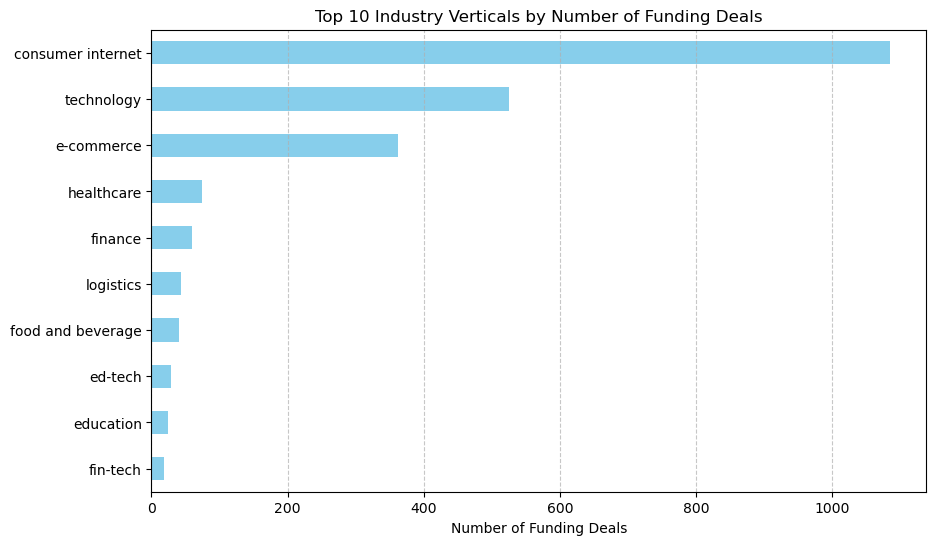

In [217]:
# Calculate the number of funding deals for each industry vertical and select the top 10

top_industry_verticals = df3['Industry Vertical'].value_counts().nlargest(10).sort_values(ascending=True)

# Create the bar chart
plt.figure(figsize=(10, 6))
top_industry_verticals.plot(kind='barh', color='skyblue')
plt.title('Top 10 Industry Verticals by Number of Funding Deals')
plt.xlabel('Number of Funding Deals')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

### Top 10 Indian cities which have most number of startups.

        City  Count
0  bangalore    865
1     mumbai    567
2  new delhi    443
3   gurugram    388
4       pune    115
5    chennai    103
6  hyderabad    101
7      noida     98
8  ahmedabad     40
9     jaipur     25


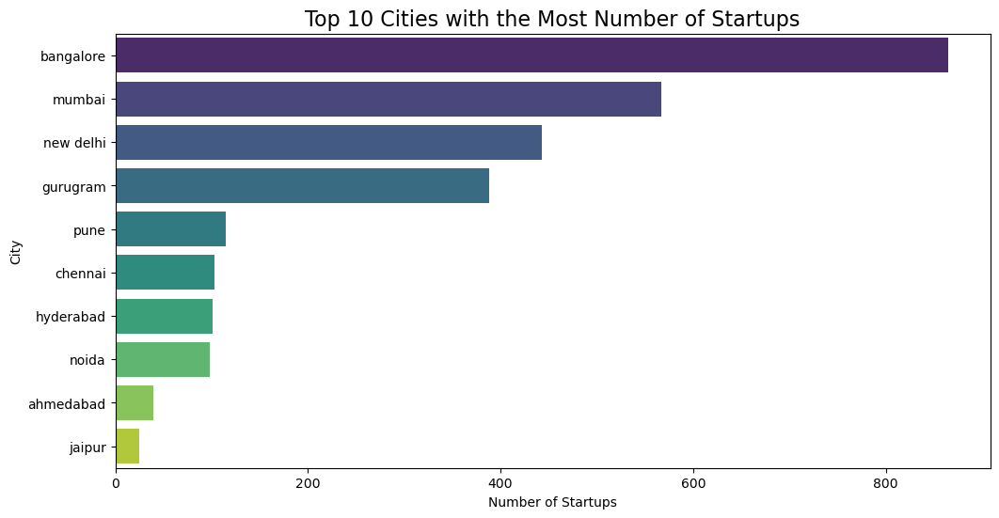

In [218]:

# Count the number of startups per city in the filtered DataFrame
city_counts = df['City'].value_counts().reset_index()
city_counts.columns = ['City', 'Count']  # Rename columns for clarity

# Display the top cities with the most startups
print(city_counts.head(10))

# Get the top 10 cities with the most startups
top_cities = city_counts.head(10)

# Plot the top 10 cities with the most startups
plt.figure(figsize=(12, 6))
sns.barplot(x='Count', y='City', data=top_cities, palette='viridis')
plt.xlabel('Number of Startups')
plt.ylabel('City')
plt.title('Top 10 Cities with the Most Number of Startups', fontsize=16)
plt.show()

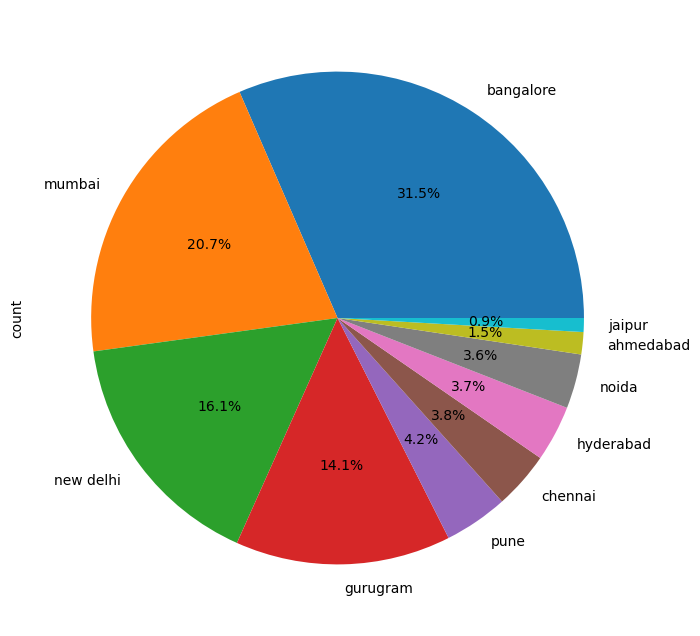

In [219]:
plt.figure(figsize=(12,8))
df['City'].value_counts().head(10).plot(kind='pie',autopct='%1.1f%%')
plt.show()

### Top 10 and Bottom 10 Cities Wise with most amount of fundings received.

In [220]:
df2 = df[(df["Amount in Crore Rs"] != 0) & (df['City'] != 'unknown')]
sector = df2.groupby("City")["Amount in Crore Rs"].sum().sort_values(ascending=False)

top10 = sector.head(10)
bottom10 = sector.tail(10)

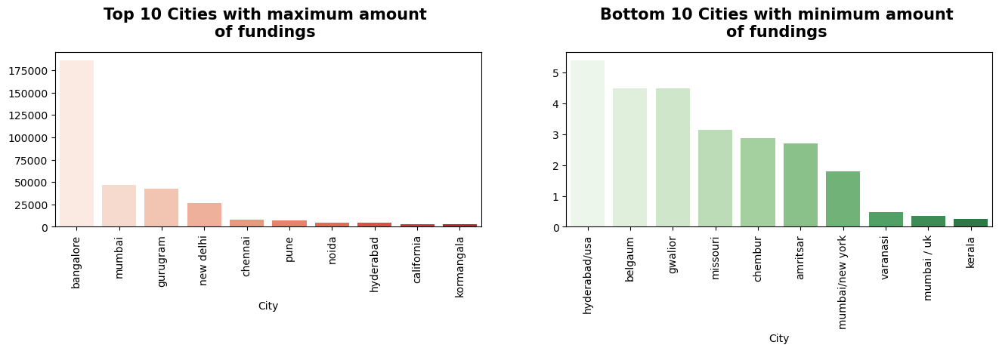

In [221]:
plt.figure(figsize=(16,3))
plt.subplot(1,2,1)
sns.barplot(x=top10.index,y=top10.values,palette=sns.color_palette("Reds",12))
plt.title("Top 10 Cities with maximum amount \nof fundings ",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90)
plt.subplot(1,2,2)
sns.barplot(x=bottom10.index,y=bottom10.values,palette=sns.color_palette("Greens",12))
plt.title("Bottom 10 Cities with minimum amount \nof fundings ",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90);

In [222]:
df["Amount in Crore Rs"].sum()

346376.66784979997

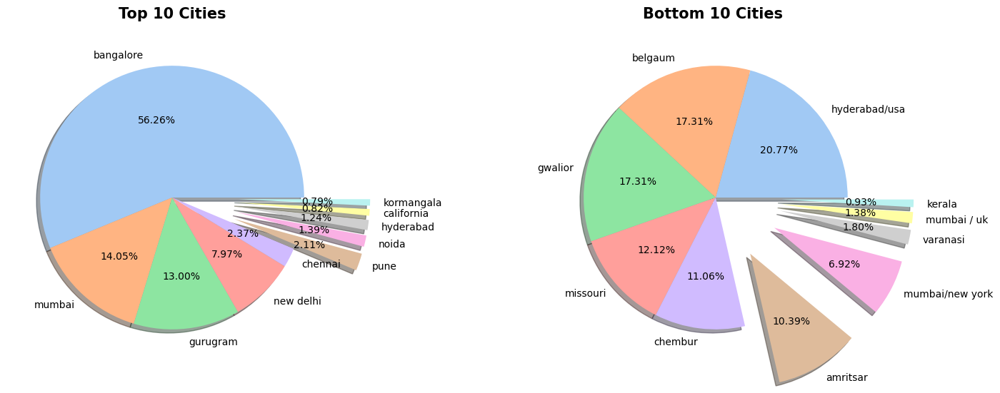

In [223]:
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
plt.pie(top10.values,labels=top10.index,autopct="%.2f%%",explode=[0,0,0,0,0,0.5,0.5,0.5,0.5,0.5],shadow=True,colors=sns.color_palette("pastel"))
plt.title("Top 10 Cities",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.pie(bottom10.values,labels=bottom10.index,autopct="%.2f%%",shadow=True,explode=[0,0,0,0,0,0.5,0.5,0.5,0.5,0.5],colors=sns.color_palette("pastel"))
plt.title("Bottom 10 Cities ",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90);

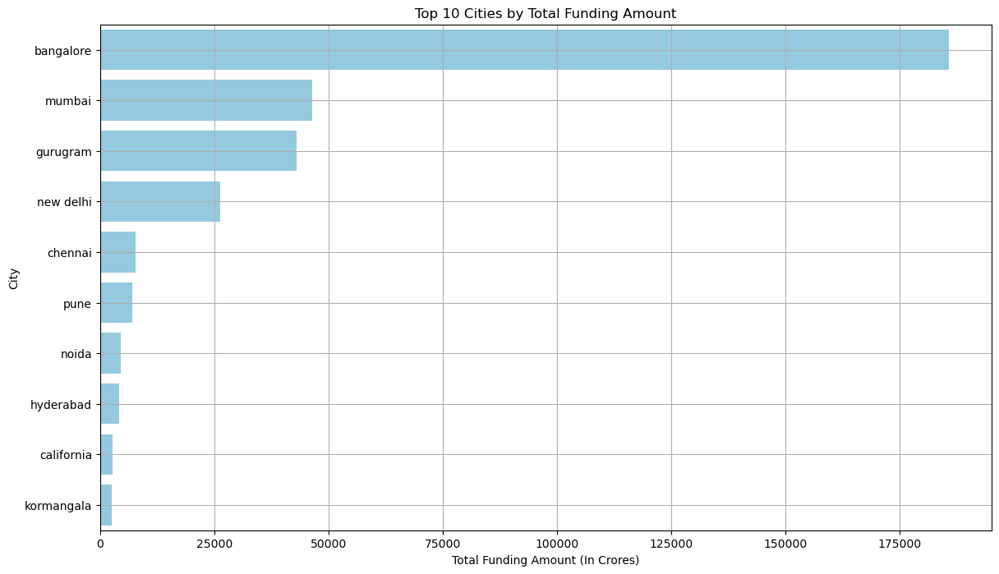

In [224]:
# Calculate the total funding amount received by startups in each city

df1 = df[(df["Amount in Crore Rs"] != 0) & (df['City'] != 'unknown')]
top_cities_funding = df1.groupby('City')['Amount in Crore Rs'].sum().reset_index()
top_cities_funding = top_cities_funding.sort_values(by='Amount in Crore Rs', ascending=False).head(10)
top_cities_funding.columns = ['City', 'Total Funding Amount']

# Plot the total funding amount by city
plt.figure(figsize=(14, 8))
sns.barplot(x='Total Funding Amount', y='City', data=top_cities_funding, color='skyblue')
plt.title('Top 10 Cities by Total Funding Amount')
plt.xlabel('Total Funding Amount (In Crores)')
plt.ylabel('City')
plt.grid(True)
plt.show()

## Top 10 investment type

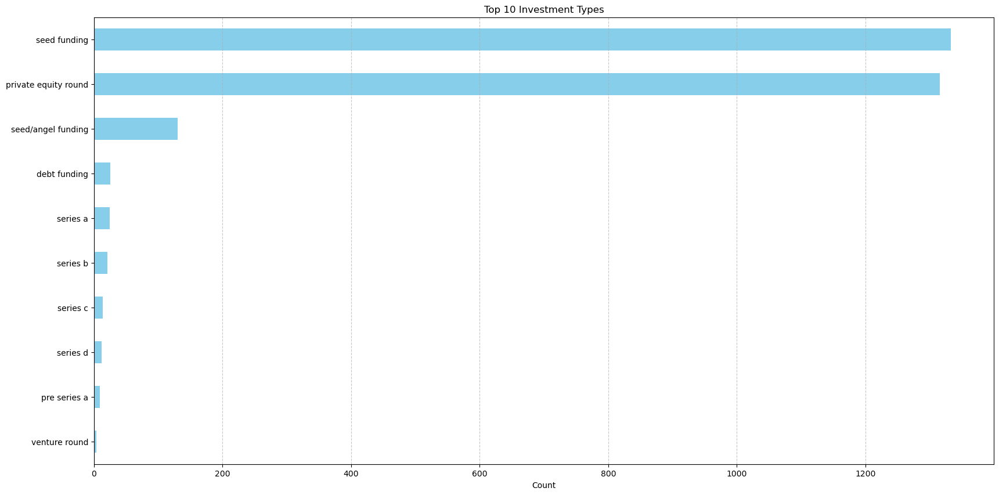

In [225]:
top_investment_types = df['Investment Type'].value_counts().head(10).sort_values(ascending=True)

plt.figure(figsize=(20, 10))
top_investment_types.plot(kind='barh', color='skyblue')
plt.title('Top 10 Investment Types')
plt.xlabel('Count')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

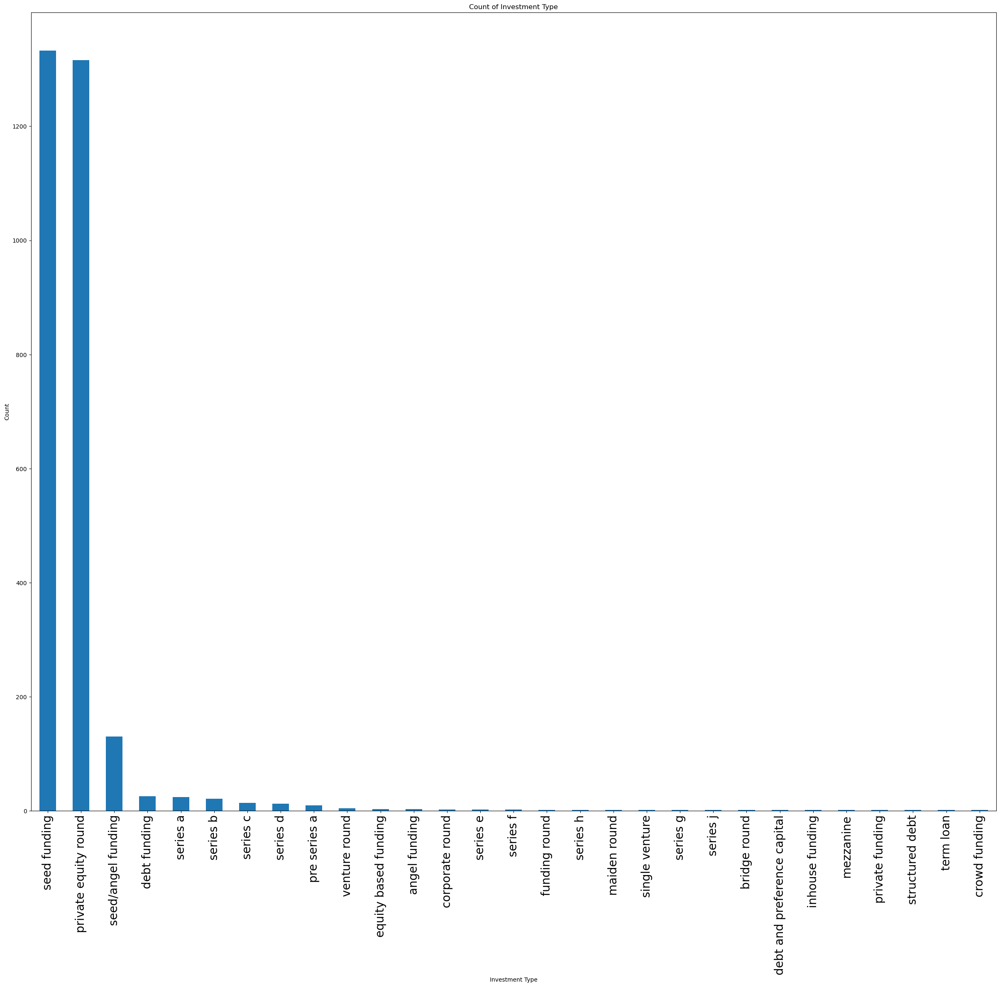

In [226]:
#plt.figure(figsize=(30, 25))
#sns.histplot(data=df,x='Investment Type', hue='Investment Type')
#plt.xticks(rotation=90,size='20')
#plt.show()


plt.figure(figsize=(30, 25))
df['Investment Type'].value_counts().plot(kind='bar')
plt.xlabel("Investment Type")
plt.ylabel("Count")
plt.title("Count of Investment Type")
plt.xticks(rotation=90, size='20')
plt.show()

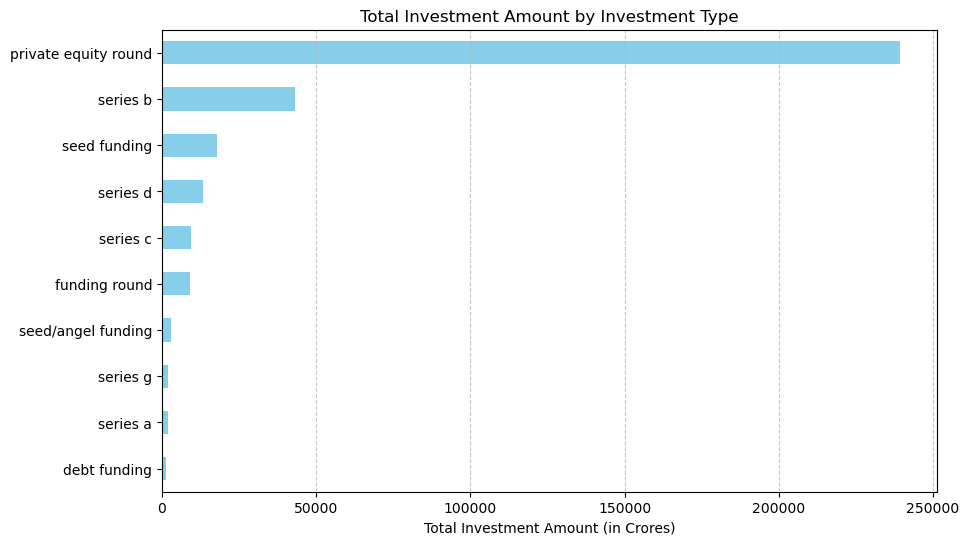

In [227]:
# Calculate the sum of investment amount for each top 10 investment type. 

top_investment_amounts = df.groupby('Investment Type')['Amount in Crore Rs'].sum().nlargest(10).sort_values(ascending=True)


plt.figure(figsize=(10, 6))
top_investment_amounts.plot(kind='barh', color='skyblue')
plt.title('Total Investment Amount by Investment Type')
plt.xlabel('Total Investment Amount (in Crores)')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

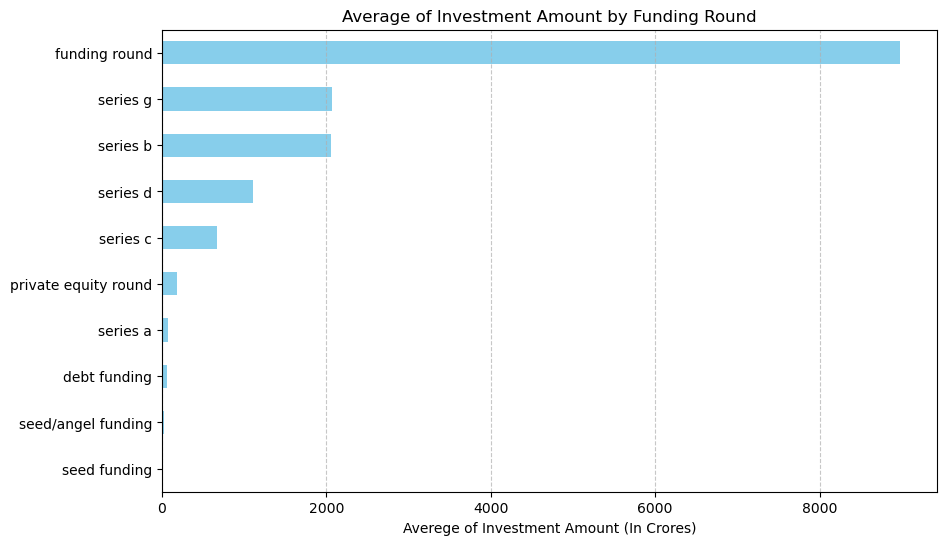

In [228]:
# Calculate the average of sum of investment amount for each investment type and select the top 10

top_investment_amounts = df.groupby('Investment Type')['Amount in Crore Rs'].sum().nlargest(10).index

# Calculate the mean investment amount for these top investment types

mean_investment_amounts = df[df['Investment Type'].isin(top_investment_amounts)].groupby('Investment Type')['Amount in Crore Rs'].mean().sort_values(ascending=True)

# Create the bar chart
plt.figure(figsize=(10, 6))
mean_investment_amounts.plot(kind='barh', color='skyblue')
plt.title('Average of Investment Amount by Funding Round')
plt.xlabel('Averege of Investment Amount (In Crores)')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

## Who plays the main role in Indian Startups Ecosystem ?

In [229]:
# Investor analysis
investor_funding = df['Investors Name'].value_counts().reset_index()
investor_funding

,Investors Name,count
0,undisclosed investors,113
1,indian angel network,27
2,ratan tata,26
3,kalaari capital,15
4,sequoia capital,15
5,accel partners,14
6,group of angel investors,12
7,info edge (india) ltd,11
8,saif partners,11
9,brand capital,11


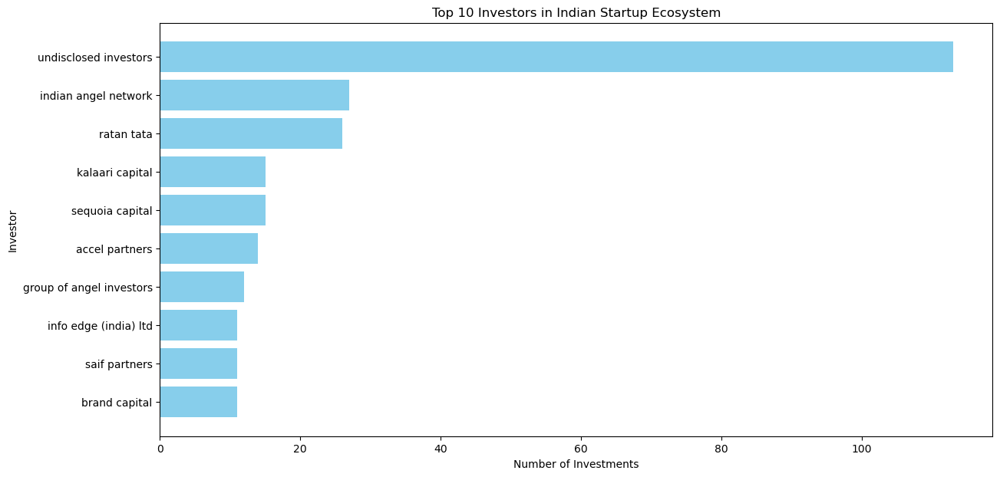

In [230]:
investor_funding.columns = ['Investor', 'Number of Investments']

# Top 10 most invested investors
top_investors = investor_funding.head(10)

plt.figure(figsize=(14, 7))
plt.barh(top_investors['Investor'],
         top_investors['Number of Investments'],
         color='skyblue')
plt.xlabel('Number of Investments')
plt.ylabel('Investor')
plt.title('Top 10 Investors in Indian Startup Ecosystem')
plt.gca().invert_yaxis()
plt.show()

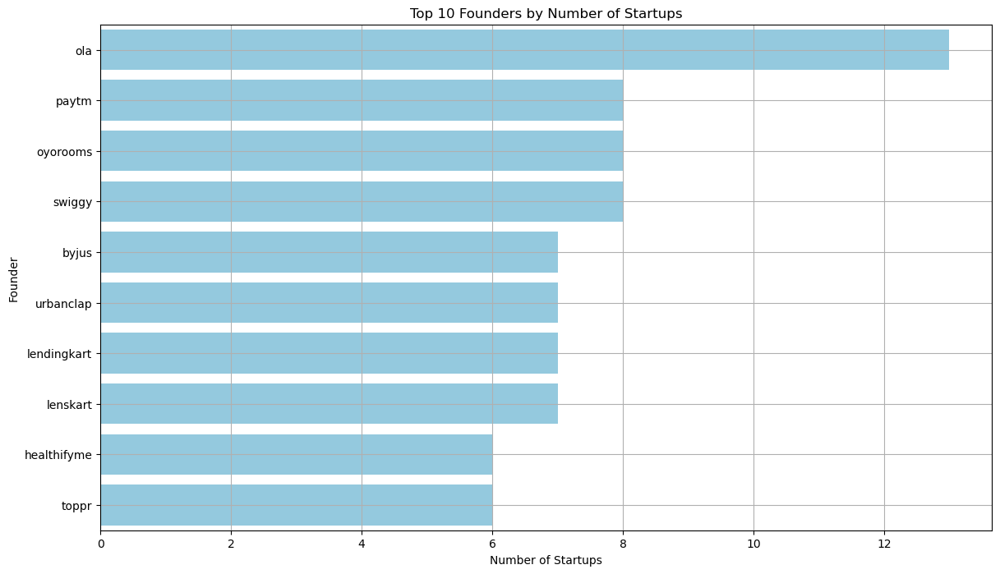

In [231]:
 df['Founders'] = df['Startup Name'].fillna('Unknown').str.split(',')

# Explode the list of founders into separate rows
founders_exploded = df.explode('Founders')

# Count the number of startups for each founder and select the top 10
top_founders = founders_exploded['Founders'].value_counts().head(10).reset_index()
top_founders.columns = ['Founder', 'Number of Startups']

# Plot the top founders
plt.figure(figsize=(14, 8))
sns.barplot(x='Number of Startups', y='Founder', data=top_founders, color='skyblue')
plt.title('Top 10 Founders by Number of Startups')
plt.xlabel('Number of Startups')
plt.ylabel('Founder')
plt.grid(True)
plt.show()

Investors Name
undisclosed investors       113
indian angel network         27
ratan tata                   26
kalaari capital              15
sequoia capital              15
accel partners               14
group of angel investors     12
info edge (india) ltd        11
saif partners                11
brand capital                11
Name: count, dtype: int64


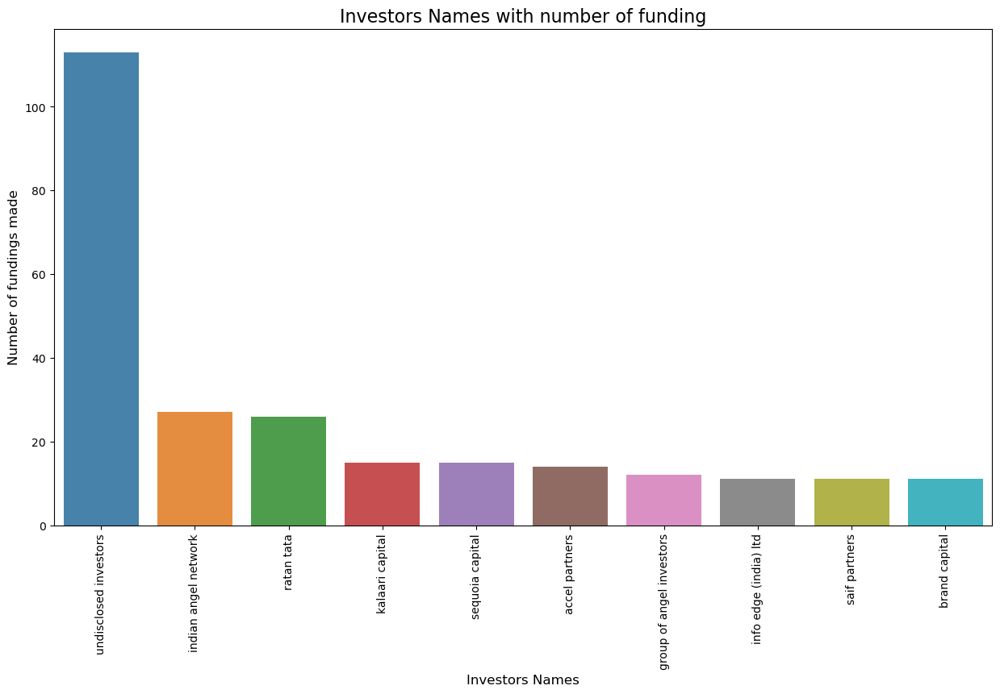

In [232]:
investors = df['Investors Name'].value_counts().head(10)
print(investors)
plt.figure(figsize=(15,8))
sns.barplot(x=investors.index, y=investors.values, alpha=0.9)
plt.xticks(rotation='vertical')
plt.xlabel('Investors Names', fontsize=12)
plt.ylabel('Number of fundings made', fontsize=12)
plt.title("Investors Names with number of funding", fontsize=16)
plt.show()

Investment Type
seed funding            1333
private equity round    1316
seed/angel funding       130
debt funding              25
series a                  24
series b                  21
series c                  14
series d                  12
pre series a               9
venture round              4
equity based funding       3
angel funding              3
corporate round            2
series e                   2
series f                   2
Name: count, dtype: int64


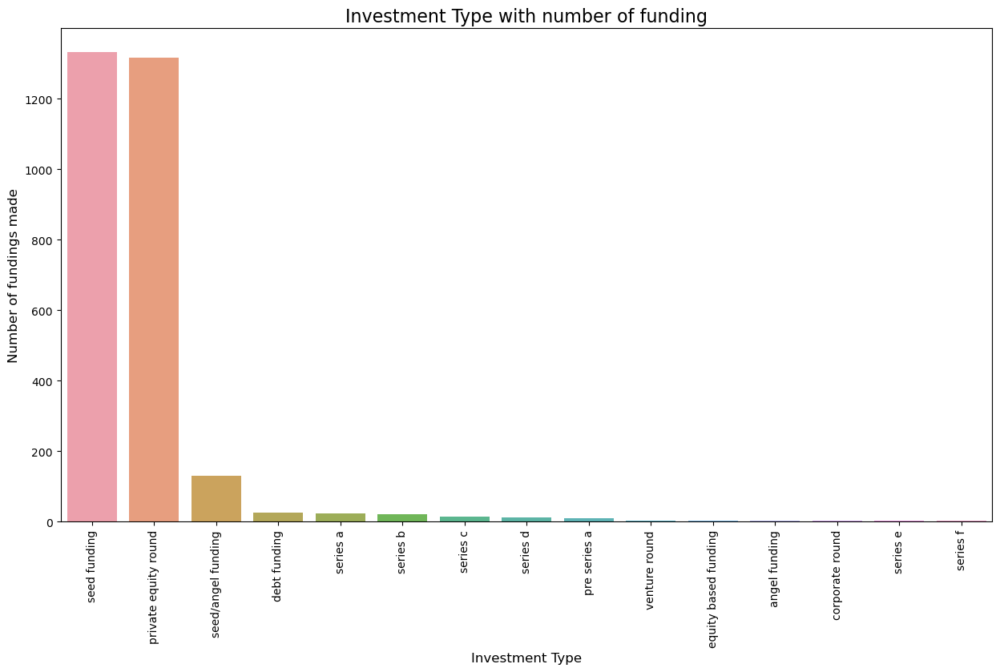

In [233]:
investment = df['Investment Type'].value_counts().head(15)
print(investment)
plt.figure(figsize=(15,8))
sns.barplot(x=investment.index,y=investment.values, alpha=0.9)
plt.xticks(rotation='vertical')
plt.xlabel('Investment Type', fontsize=12)
plt.ylabel('Number of fundings made', fontsize=12)
plt.title("Investment Type with number of funding", fontsize=16)
plt.show()

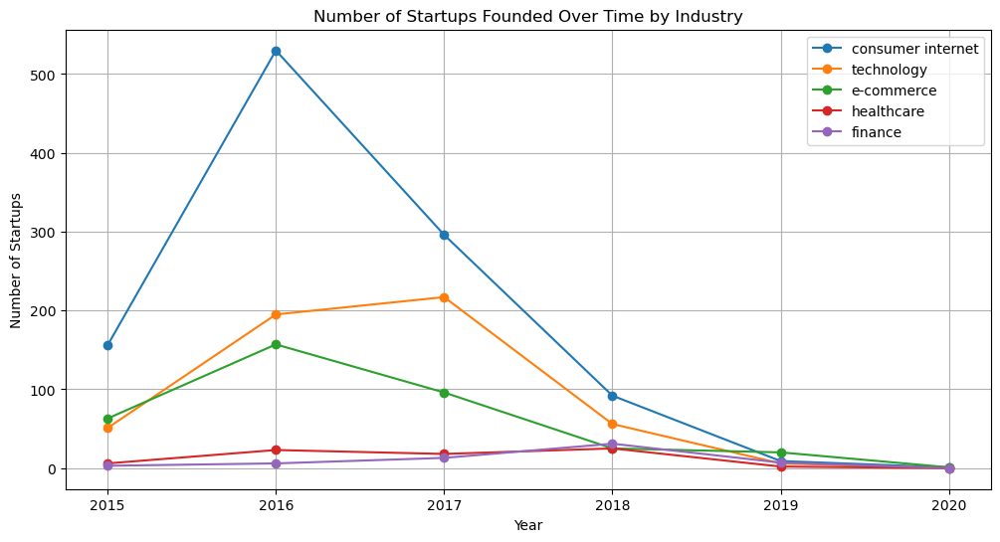

In [238]:
top_industries = df[df['Industry Vertical'] != 'unknown']['Industry Vertical'].value_counts().head(10).reset_index()

yearly_industry_count = df.groupby(['year', 'Industry Vertical']).size().unstack().fillna(0)

# List of top industries
top_industries_list = top_industries['Industry Vertical'].head(5)

# Plotting the line plots for top industries over time
plt.figure(figsize=(12, 6))

for industry in top_industries_list:
    plt.plot(yearly_industry_count.index, yearly_industry_count[industry], marker='o', label=industry)
    
plt.title('Number of Startups Founded Over Time by Industry')
plt.xlabel('Year')
plt.ylabel('Number of Startups')
plt.legend()
plt.grid(True)
plt.show()

In [234]:
investor=input("choose the invester name from this above output list to see its detail as below :")
print(f"Details of invester {investor} : is below")
df[df["Investors Name"].str.contains(investor)][["Investors Name","Startup Name","Industry Vertical","City","Amount in Crore Rs"]].reset_index(drop=True).style.set_properties(**{'border': '1.3px solid green', 'color': 'Red'})

choose the invester name from this above output list to see its detail as below : ratan tata


Details of invester ratan tata : is below


,Investors Name,Startup Name,Industry Vertical,City,Amount in Crore Rs
0,ratan tata,the print,media,new delhi,4.804300
1,"ratan tata, nandan nilekani, uday kotak, vijay shekhar sharma, kiran mazumdar-shaw, rajiv c mody",the print,media,new delhi,4.804300
2,ratan tata,goqii,health and wellness,mumbai,120.332000
3,ratan tata,ideachakki,consumer internet,new delhi,10.327000
4,ratan tata,kyazoonga,e-commerce,mumbai,30.756500
5,"ratan tata, bhavish aggarwal, ankit bhati, binny bansal, girish mathrubootham",madrat games,technology,bangalore,14.368000
6,"international finance corp, tpg growth, adveq management, idg ventures, ratan tata, kris gopalakrishnan",lenskart,e-commerce,new delhi,538.800000
7,ratan tata,murgency,consumer internet,mumbai,10.327000
8,ratan tata,niki.ai,technology,bangalore,14.368000
9,ratan tata,lenskart,e-commerce,new delhi,30.756500


### Top 5 investments in a start up of a particular invester

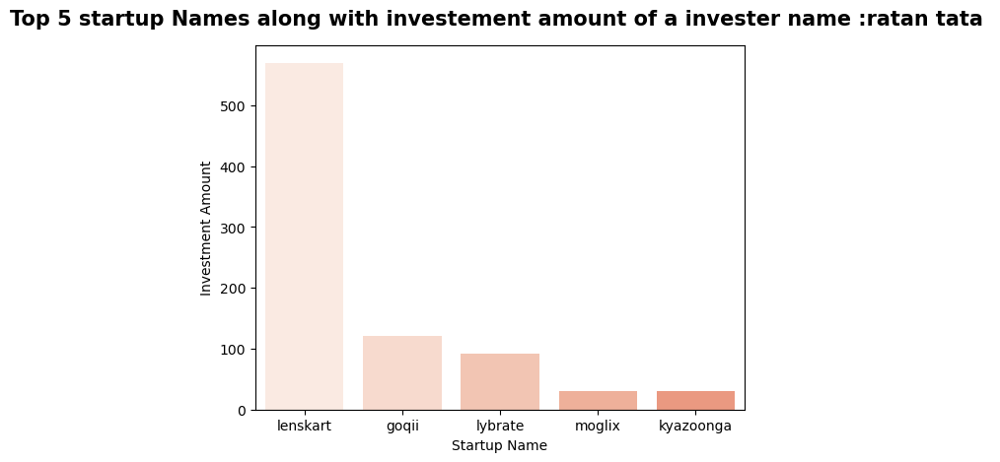

In [235]:
top5=df[df["Investors Name"].str.contains(investor)].groupby("Startup Name")["Amount in Crore Rs"].sum().sort_values(ascending=False).head(5)
sns.barplot(x=top5.index,y=top5.values,palette=sns.color_palette("Reds",12),data=df)
plt.title(f"Top 5 startup Names along with investement amount of a invester name :{investor} ",fontweight="black",size=15, pad=15)
plt.xlabel("Startup Name")
plt.ylabel("Investment Amount");

### How much amount a particular invester invested in which sector/vertical

In [236]:
df[df["Investors Name"].str.contains(investor)].groupby("Industry Vertical")["Amount in Crore Rs"].sum().reset_index().style.set_properties(**{'border': '1.3px solid green', 'color': 'Red'})

,Industry Vertical,Amount in Crore Rs
0,big data & predictive analysis platform,14.368000
1,consumer internet,82.616000
2,e-commerce,784.852000
3,electric bike manufacturers,10.776000
4,health and wellness,120.332000
5,healthcare,20.654000
6,healthcare mobile app,91.596000
7,media,9.608600
8,technology,86.208000
9,wifi ' first cloud communication platform,14.368000


### How much amount a particular invester invested in city

In [237]:
df[df["Investors Name"].str.contains(investor)].groupby("City")["Amount in Crore Rs"].sum().reset_index().style.set_properties(**{'border': '1.3px solid green', 'color': 'Red'})

,City,Amount in Crore Rs
0,bangalore,119.209500
1,coimbatore,10.776000
2,gurugram,82.167000
3,hyderabad,14.368000
4,mumbai,200.478500
5,new delhi,730.478100
6,noida,30.756500
7,pune,30.756500
8,siliguri,30.756500


In [239]:
df

,Date,Startup Name,Investors Name,Investment Type,Amount in Crore Rs,year,Industry Vertical,SubVertical,City,Founders
0,2020-01-09,byjus,tiger global management,private equity round,1796.000000,2020,consumer internet,e-learning,bangalore,[byjus]
1,2020-01-13,shuttl,susquehanna growth equity,series c,72.274578,2020,transportation,app based shuttle service,gurugram,[shuttl]
2,2020-01-09,mamaearth,sequoia capital india,series b,164.862563,2020,e-commerce,retailer of baby and toddler products,gurugram,[mamaearth]
3,2020-01-02,wealthbucket,vinod khatumal,pre series a,26.940000,2020,fin-tech,online investment,new delhi,[wealthbucket]
4,2020-01-02,fashor,sprout venture partners,seed funding,16.164000,2020,fashion and apparel,embroiled clothes for women,mumbai,[fashor]
5,2020-01-13,pando,chiratae ventures,series a,80.820000,2020,logistics,"open-market, freight management platform",chennai,[pando]
6,2020-01-10,zomato,ant financials,private equity round,1347.000000,2020,hospitality,online food delivery platform,gurugram,[zomato]
7,2019-12-12,ecozen,sathguru catalyzer advisors,series a,53.880000,2019,technology,agritech,pune,[ecozen]
8,2019-12-06,cardekho,ping an global voyager fund,series d,628.600000,2019,e-commerce,automobile,gurugram,[cardekho]
9,2019-12-03,dhruva space,"mumbai angels, ravikanth reddy",seed funding,449.000000,2019,aerospace,satellite communication,bangalore,[dhruva space]


In [241]:
df.shape

(2914, 10)